In [1]:
#from thllib import flylib as flb
from matplotlib import pyplot as plt
import numpy as np
import scipy
#from thllib import util
import figurefirst as fifi
import scipy.signal
import local_project_functions as lpf
from IPython.display import SVG,display
import networkx as nx


import flylib as flb
#from thllib import flylib as flb
import flylib as flb
from matplotlib import pyplot as plt
import numpy as np
import scipy
from flylib import util
import figurefirst as fifi
import scipy.signal
import local_project_functions as lpf
from IPython.display import SVG,display
import pandas as pd
import networkx as nx

/home/imager/.local/lib/python2.7/site-packages/pandas/core/computation/__init__.py:18: UserWarning: The installed version of numexpr 2.4.3 is not supported in pandas and will be not be used
The minimum supported version is 2.4.6

  ver=ver, min_ver=_MIN_NUMEXPR_VERSION), UserWarning)


In [2]:
%matplotlib inline

In [3]:

fly_nums = range(1706, 1709) + range(1711, 1714) + range (1715, 1719) + range(1719, 1722) + range(1722, 1727) + range(1729, 1730)  ## last one are the newest trials -- 

multi_fly_df = util.construct_multi_fly_df(fly_nums)


Making dataframe for fly number 1706
Making dataframe for fly number 1707
Making dataframe for fly number 1708
Making dataframe for fly number 1711
Making dataframe for fly number 1712
Making dataframe for fly number 1713
Making dataframe for fly number 1715
Making dataframe for fly number 1716
Making dataframe for fly number 1717
Making dataframe for fly number 1718
Making dataframe for fly number 1719
Making dataframe for fly number 1720
Making dataframe for fly number 1721
Making dataframe for fly number 1722
Making dataframe for fly number 1723
Making dataframe for fly number 1724
Making dataframe for fly number 1725
Making dataframe for fly number 1726
Making dataframe for fly number 1729


In [4]:

flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in fly_nums]
l = [fly.open_signals() for fly in flylist]

sorted_keys = sorted(fly.spikestates.keys())

cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

for cull in cull_list:
    sorted_keys.remove(cull)
#[sorted_keys.remove(cull) for cull in cull_list]

flydict = {}
for fly in flylist:
    flydict[fly.flynum] = fly
    
stim_conditions = [('common', 'idx', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'),
                  ('common', 'idx', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'),
                  ('common', 'idx', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0')]

In [5]:
print(multi_fly_df.columns.values)
print(np.unique(multi_fly_df['stimulus']))

idx = (multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=-8, b_y=0, ch=True')& \
        ((multi_fly_df['amp_diff']>0.1)&(multi_fly_df['amp_diff']<0.104))


['t' 'stimulus' 'amp_diff' 'left_amp' 'right_amp' 'fly_num' 'wbf'
 'experimental_condition' 'pr_left' 'tpd_left' 'nm_left' 'iii1_left'
 'iii3_left' 'i2_left' 'hg2_left' 'hg3_left' 'hg1_left' 'i1_left'
 'bkg_left' 'b1_left' 'b2_left' 'b3_left' 'iii24_left' 'hg4_left'
 'pr_right' 'tpd_right' 'nm_right' 'iii1_right' 'iii3_right' 'i2_right'
 'hg2_right' 'hg3_right' 'hg1_right' 'i1_right' 'bkg_right' 'b1_right'
 'b2_right' 'b3_right' 'iii24_right' 'hg4_right']
['exc_cl_starfield, g_x = 1, g_y=0, b_x =0, b_y = 0, ch=0'
 'pitch_down_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'pitch_up_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'pretrial_stripe_fix'
 'roll_clockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'roll_counterclockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'trials_ended' 'yaw_left, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'yaw_right, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']


In [6]:
multi_fly_df['l_plus_r'] = multi_fly_df['left_amp'] + multi_fly_df['right_amp']
all_stim_df = multi_fly_df


In [7]:
def rad_to_deg (rad):
    r_deg = np.rad2deg(((rad)/10) *2*np.pi)
    return r_deg

In [7]:
def plot_sector_kine(flylist,
                sector,ax,
                pathspecs,
                mode = 'hist',
                contours = False,
                rng = (25,95)):
    sector_map = {'rb-tu':'cl_blocks, g_x=-1, g_y=4 b_x=8, b_y=0',
                  'nb-tu':'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0',
                  'lb-tu':'cl_blocks, g_x=-1, g_y=4 b_x=-8, b_y=0',

                  'rb-nu':'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0',
                  'nb-nu':'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0',
                  'lb-nu':'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0',

                  'rb-td':'cl_blocks, g_x=-1, g_y=-4 b_x=8, b_y=0',
                  'nb-td':'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0',
                  'lb-td':'cl_blocks, g_x=-1, g_y=-4 b_x=-8, b_y=0'}

    block_key = sector_map[sector]

    if mode == 'hist':
        group_hist = get_group_hist(flylist,
                                 xkey,
                                 ykey,
                                 block_keys = [block_key],
                                 condition_keys = ['condition=test'])
        sector_mask = np.array([group_hist>0.5]*4)
        ps = pathspecs[sector]
        fc = ps.mplkwargs()['facecolor']
        sector_img = (sector_mask*fc[:,None,None]).T
        ax.imshow(sector_img,interpolation = 'None',extent = (0,1,0,1))
    if mode == 'kde':
        group_hists = get_kde_estimates_kine(flylist,rng = rng,
                                             block_keys = [block_key],
                                 condition_keys = ['condition=test'],
                                 bandwidth = 5,
                                 nbins = 100)
        print np.shape(group_hists)
        group_hists = np.product(group_hists,axis = 0)
        if contours:
            #sector_mask = np.array(group_hists>0.001*4)
            #pad the mask to deal with corners and edges
            sector_mask = group_hists
            padr = np.zeros(np.shape(sector_mask)[1])
            sector_mask = np.vstack((padr,sector_mask,padr))
            padc = np.zeros((np.shape(sector_mask)[0],1)) 
            sector_mask = np.hstack((padc,sector_mask,padc))
            #get the contour
            from skimage import measure
            level = np.percentile(group_hists,90)
            contours = measure.find_contours(sector_mask,level)
            if len(contours) > 1:
                print('more than one contour found')
                contour = contours[np.argmax([len(c) for c in contours])].T
            else:
                contour = contours[0].T
            #put back in data coords
            cy = (contour[0]-1)/(np.shape(sector_mask)[0]-1)
            cx = (contour[1]-1)/(np.shape(sector_mask)[1]-1)
            
            cy =cy*(rng[1]-rng[0]) + rng[0]
            cx =cx*(rng[1]-rng[0]) + rng[0]
            
            if (cy[0] != cy[-1]) | (cx[0] != cx[-1]):
                #close the contours
                cy = np.hstack([cy,cy[0]])
                cx = np.hstack([cx,cx[0]])
            ps = pathspecs[sector]
            kwargs = ps.mplkwargs()
            ax.fill(cx,cy,clip_on = False,**kwargs)
        else:
            sector_mask = np.array([group_hists>0.001]*4)
            ps = pathspecs[sector]
            fc = ps.mplkwargs()['facecolor']
            sector_img = np.transpose(sector_mask*fc[:,None,None],(1,2,0))[::-1,:,:]
            ax.imshow(sector_img,interpolation = 'None',extent = (0,1,0,1))

In [67]:
def plot_sector(flylist,
                xkey,ykey,
                sector,ax,
                pathspecs,
                mode = 'hist',
                contours = False):
    sector_map = {'rb-tu':'cl_blocks, g_x=-1, g_y=4 b_x=8, b_y=0',
                  'nb-tu':'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0',
                  'lb-tu':'cl_blocks, g_x=-1, g_y=4 b_x=-8, b_y=0',
                  
                  'rb-nu':'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0',
                  'nb-nu':'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0',
                  'lb-nu':'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0',
                  
                  'rb-td':'cl_blocks, g_x=-1, g_y=-4 b_x=8, b_y=0',
                  'nb-td':'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0',
                  'lb-td':'cl_blocks, g_x=-1, g_y=-4 b_x=-8, b_y=0'}
    
    block_key = sector_map[sector]
    if mode == 'hist':
        group_hist = get_group_hist(flylist,
                                 xkey,
                                 ykey,
                                 block_keys = [block_key],
                                 condition_keys = ['condition=test'])
        sector_mask = np.array([group_hist>0.5]*4)
        ps = pathspecs[sector]
        fc = ps.mplkwargs()['facecolor']
        sector_img = (sector_mask*fc[:,None,None]).T
        ax.imshow(sector_img,interpolation = 'None',extent = (0,1,0,1))
    if mode == 'kde':
        group_hists = get_kde_estimates(flylist,
                                 xkey,
                                 ykey,
                                 block_keys = [block_key],
                                 condition_keys = ['condition=test'],
                                 bandwidth = 0.1,
                                 nbins = 100)
        group_hists = np.product(group_hists,axis = 0)
        if contours:
            #sector_mask = np.array(group_hists>0.001*4)
            #pad the mask to deal with corners and edges
            sector_mask = group_hists
            padr = np.zeros(np.shape(sector_mask)[1])
            sector_mask = np.vstack((padr,sector_mask,padr))
            padc = np.zeros((np.shape(sector_mask)[0],1)) 
            sector_mask = np.hstack((padc,sector_mask,padc))
            #get the contour
            from skimage import measure
            contours = measure.find_contours(sector_mask,30.5)
            if len(contours) > 1:
                print('more than one contour found for:')
                print('%s %s - %s %s'%(xkey + ykey))
                contour = contours[np.argmax([len(c) for c in contours])].T
            else:
                contour = contours[0].T
            #put back in data coords
            cy = (contour[0]-1)/(np.shape(sector_mask)[0]-1)
            cx = (contour[1]-1)/(np.shape(sector_mask)[1]-1)
            if (cy[0] != cy[-1]) | (cx[0] != cx[-1]):
                #close the contours
                cy = np.hstack([cy,cy[0]])
                cx = np.hstack([cx,cx[0]])
            ps = pathspecs[sector]
            #fc = ps.mplkwargs()['facecolor']
            #ec = ps.mplkwargs()['edgecolor']
            kwargs = ps.mplkwargs()
            ax.fill(cx,cy,clip_on = False,**kwargs)
        else:
            sector_mask = np.array([group_hists>0.001]*4)
            ps = pathspecs[sector]
            fc = ps.mplkwargs()['facecolor']
            sector_img = np.transpose(sector_mask*fc[:,None,None],(1,2,0))[::-1,:,:]
            ax.imshow(sector_img,interpolation = 'None',extent = (0,1,0,1))


In [68]:
def get_kde_estimates(flies,xkey,ykey,
                      condition_keys = [],
                      block_keys = [],
                      nbins = 50,bandwidth = 0.05):
    from sklearn.neighbors.kde import KernelDensity
    pdfs = []
    for fly in flies:
        try:
            dmask = fly.data_mask
            c_masks = []
            b_masks = []

            for ckey in condition_keys:
                c_masks.append(np.array(fly.experimental_condition) == ckey)
            for bkey in block_keys:
                b_masks.append(np.array(fly.experimental_block) == bkey)
            if len(c_masks)>0:
                if len(b_masks)>0:
                    dmask = dmask & np.any(b_masks,axis = 0) & np.any(c_masks,axis = 0)
                else:
                    dmask = dmask & np.any(c_masks,axis = 0)
            else:
                if len(b_masks)>0:
                    dmask = dmask & np.any(b_masks,axis = 0)
 
            x = fly.non_neg_signals[xkey][dmask]
            y = fly.non_neg_signals[ykey][dmask]
            X = np.array([x,y])
            xedges = np.linspace(0,1,nbins)
            yedges = np.linspace(0,1,nbins)
            gridx,gridy = np.meshgrid(xedges,yedges)
            kde = KernelDensity(kernel='gaussian', bandwidth=bandwidth).fit(X.T)
            smps = kde.score_samples(np.vstack((gridx.ravel(),gridy.ravel())).T)
            pdfs.append((np.exp(smps.reshape(np.shape(gridx)))))
        except ValueError:
            pass
    return pdfs

In [69]:
def get_kde_estimates_kine(flies,rng = (25,95),
                      condition_keys = [],
                      block_keys = [],
                      nbins = 50,bandwidth = 10):
    from sklearn.neighbors.kde import KernelDensity
    #from thllib import util
    from flylib import util
    pdfs = []
    for fly in flies:
        #try:
        dmask = fly.data_mask
        c_masks = []
        b_masks = []

        for ckey in condition_keys:
            c_masks.append(np.array(fly.experimental_condition) == ckey)
        for bkey in block_keys:
            b_masks.append(np.array(fly.experimental_block) == bkey)
        if len(c_masks)>0:
            if len(b_masks)>0:
                dmask = dmask & np.any(b_masks,axis = 0) & np.any(c_masks,axis = 0)
            else:
                dmask = dmask & np.any(c_masks,axis = 0)
        else:
            if len(b_masks)>0:
                dmask = dmask & np.any(b_masks,axis = 0)

        x = util.fill_nan(np.rad2deg(np.array(fly.left_amp)[dmask]))
        y = util.fill_nan(np.rad2deg(np.array(fly.right_amp)[dmask]))
        X = np.array([x,y])
        X[np.isnan(X)] = 0
        X = np.squeeze(X)
        xedges = np.linspace(rng[0],rng[1],nbins)
        yedges = np.linspace(rng[0],rng[1],nbins)
        gridx,gridy = np.meshgrid(xedges,yedges)
        kde = KernelDensity(kernel='gaussian', bandwidth=bandwidth).fit(X.T)
        smps = kde.score_samples(np.vstack((gridx.ravel(),gridy.ravel())).T)
        pdfs.append((np.exp(smps.reshape(np.shape(gridx)))))
        #except ValueError:
        #    pass
    return pdfs

In [70]:
def make_scatter_plots(fly,ax_group):
    """create summary plot for each fly in flylist, uses the template 
    file cov_matrix_triang_layout.svg, the hdf5 data of each fly needs to 
    be loaded"""
    import figurefirst as fifi
    if 'data_mask' in fly.h5files.keys():
        #fifi.mpl_functions.kill_all_spines(layout)
        dmask = np.array(fly.data_mask)

        # keymap = {}
        #l = [keymap.update({key:(key_to_key(key[0]),key_to_key(key[1]))}) for key in layout.axes.keys()]
        #keymap.pop('flynum')
        for key1,g in ax_group.items():
            for key2,ax in g.items():
                try:
                    dkeys = (key_to_key(key1),key_to_key(key2))
                    dta1 = fly.non_neg_signals[dkeys[0]][dmask][::50]
                    dta2 = fly.non_neg_signals[dkeys[1]][dmask][::50]
                    ax.scatter(dta1,dta2,
                               marker = 'o', #'.'
                               s = 0.9,
                               color = 'k',
                               alpha = 0.5,
                               edgecolors = 'none',
                               rasterized = True)
                    ax.set_xbound(0,1)
                    ax.set_ybound(0,1)
                    fifi.mpl_functions.kill_spines(ax)
                except KeyError:
                    if key == 'flynum':
                        ax.text(0,0,'Fly%s'%fly.flynum,size = 20)
                    else:
                        pass
            #layout.save('scatter_matrix_%s.svg'%fly.flynum)
            #plt.close('all')
        #display(SVG('scatter_matrix_%s.svg'%fly.flynum))
        
        

In [71]:
def scatter(fly, key1, key2, ax):
            dmask = np.array(fly.data_mask)
            dkeys = (key_to_key(key1),key_to_key(key2))
            dta1 = fly.non_neg_signals[dkeys[0]][dmask][::50]
            dta2 = fly.non_neg_signals[dkeys[1]][dmask][::50]
            ax.scatter(dta1,dta2,
                        marker = 'o', #'.'
                        s = 0.9,
                        color = 'k',
                        alpha = 0.9,
                        edgecolors = 'none',
                        rasterized = True)
            ax.set_xbound(0,1)
            ax.set_ybound(0,1)
            fifi.mpl_functions.kill_spines(ax)
            
'''           
def scatter_left_turn(fly, key1, key2, ax, sector):
    sector_map = {'rb-tu':'cl_blocks, g_x=-1, g_y=4 b_x=8, b_y=0',
                  'nb-tu':'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0',
                  'lb-tu':'cl_blocks, g_x=-1, g_y=4 b_x=-8, b_y=0',

                  'rb-nu':'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0',
                  'nb-nu':'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0',
                  'lb-nu':'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0',

                  'rb-td':'cl_blocks, g_x=-1, g_y=-4 b_x=8, b_y=0',
                  'nb-td':'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0',
                  'lb-td':'cl_blocks, g_x=-1, g_y=-4 b_x=-8, b_y=0'}

    block_key = sector_map[sector]

    if mode == 'hist':
        group_hist = get_group_hist(flylist,
                                 xkey,
                                 ykey,
                                 block_keys = [block_key],
                                 condition_keys = ['condition=test'])
        sector_mask = np.array([group_hist>0.5]*4)
        ps = pathspecs[sector]
        fc = ps.mplkwargs()['facecolor']
        sector_img = (sector_mask*fc[:,None,None]).T
        ax.imshow(sector_img,interpolation = 'None',extent = (0,1,0,1))
            dmask = np.array(fly.data_mask)
            dkeys = (key_to_key(key1),key_to_key(key2))
            dta1 = fly.non_neg_signals[dkeys[0]][dmask][::50]
            dta2 = fly.non_neg_signals[dkeys[1]][dmask][::50]
            ax.scatter(dta1,dta2,
                        marker = 'o', #'.'
                        s = 0.9,
                        color = 'turquoise',
                        alpha = 0.9,
                        edgecolors = 'none',
                        rasterized = True)
            ax.set_xbound(0,1)
            ax.set_ybound(0,1)
            fifi.mpl_functions.kill_spines(ax)
            
def scatter_right_turn(fly, key1, key2, ax):
            dmask = np.array(fly.data_mask)
            dkeys = (key_to_key(key1),key_to_key(key2))
            dta1 = fly.non_neg_signals[dkeys[0]][dmask][::50]
            dta2 = fly.non_neg_signals[dkeys[1]][dmask][::50]
            ax.scatter(dta1,dta2,
                        marker = 'o', #'.'
                        s = 0.9,
                        color = 'r',
                        alpha = 0.9,
                        edgecolors = 'none',
                        rasterized = True)
            ax.set_xbound(0,1)
            ax.set_ybound(0,1)
            fifi.mpl_functions.kill_spines(ax)
'''

"           \ndef scatter_left_turn(fly, key1, key2, ax, sector):\n    sector_map = {'rb-tu':'cl_blocks, g_x=-1, g_y=4 b_x=8, b_y=0',\n                  'nb-tu':'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0',\n                  'lb-tu':'cl_blocks, g_x=-1, g_y=4 b_x=-8, b_y=0',\n\n                  'rb-nu':'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0',\n                  'nb-nu':'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0',\n                  'lb-nu':'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0',\n\n                  'rb-td':'cl_blocks, g_x=-1, g_y=-4 b_x=8, b_y=0',\n                  'nb-td':'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0',\n                  'lb-td':'cl_blocks, g_x=-1, g_y=-4 b_x=-8, b_y=0'}\n\n    block_key = sector_map[sector]\n\n    if mode == 'hist':\n        group_hist = get_group_hist(flylist,\n                                 xkey,\n                                 ykey,\n                                 block_keys = [block_key],\n                                 condition_keys = ['condition

In [72]:
def key_to_key(inkey):
    """map the input key from the cov_mtrx_triang_layout.svg into a set of keys 
    (a tuple of tuples) that can be used to construct signals from the fly data"""
    try:
        k1 = {'R':'right','L':'left'}[inkey[0]]
    except KeyError:
        if inkey[0] == 'w':
            return ('common','wb_freq')
        else:
            return
    k2 = inkey[1:]
    return (k1,k2)

In [8]:
def averaged_fly_WSA(stim, measured_kine):   #'amp_diff'  vs 'l_plus_r'  #WBF

    y2 = stim.index.tolist()
    #y_der = (np.asarray(y)).diff()

    slope = np.gradient(np.asarray(y2))
    slope = slope.flatten()
    new_trial_inds =np.argwhere(slope>1.)
    new_trial_inds
    new_trial_inds_shifted = new_trial_inds -1
    len(new_trial_inds)

    new_trial_inds = new_trial_inds.flatten()
    new_trial_inds_shifted = new_trial_inds_shifted.flatten()

    counter = 0
    stim['trial'] = ""
    for trial_ind in new_trial_inds_shifted: 
        if counter == 0:
            stim['trial'][0:trial_ind] = counter
        else: 
            stim['trial'][new_trial_inds_shifted[counter-1]: trial_ind] = counter
        counter += 1

    #d = pd.DataFrame()
    main_df_yaw_right = pd.DataFrame()
    dfe_yaw_right= pd.DataFrame()
    counter = 0
    for trial_in in new_trial_inds: 
        d = stim.loc[(stim['trial']==counter)] #, ignore_index=True
        #print(d)
        #d = d.reset_index(drop=True)
        e = d[measured_kine]
        #e = d['amp_diff']
        #e = e.reset_index()
        #e = pd.Series(e)
        ee = e.tolist()
        #print(len(ee)) ##should be 550

        #ee = pd.Series(ee)
        if len(ee)> 2:
            if len(ee) == 500:
                main_df_yaw_right[counter] = ee
            if len(ee) >= 500:
                main_df_yaw_right[counter] = ee[0:500]
            else:
                for i in range(500-len(ee)):
                    ee.append(0)
                main_df_yaw_right[counter] = ee
            #dfe = pd.concat([dfe, ee], ignore_index=True)#, ignore_index=True, axis=1)#d['amp_diff'] #, ignore_index=True


        counter +=1

    #df_big_force['impact force (mN)'].iloc[3]
    #df.loc[42, :]
    #df.loc[date & trial & ID, :].iloc[0]

    from scipy import stats

    #stats.sem(main_df, axis =1)
    mean_WBA_yaw_right = np.mean(main_df_yaw_right, axis =1)  #mean
    #sameple_yaw_1 = main_df_yaw_right[0]
    #sameple_yaw_2 = main_df_yaw_right[2]
    #sameple_yaw_3 = main_df_yaw_right[4]
    #sameple_yaw_4 = main_df_yaw_right[8]
    #sameple_yaw_9 = main_df_yaw_right[12]
    #sameple_yaw_11 = main_df_yaw_right[18]
    #error = main_df.stack().std()  
    error_yaw_right = main_df_yaw_right.std(axis = 1, skipna = True)
    #print(error)
    inds = np.arange(0, 500)
    time =inds/50.
    return((mean_WBA_yaw_right, error_yaw_right))

In [8]:
print(multi_fly_df.columns.values)
print(np.unique(multi_fly_df['stimulus']))


# double_filtered_df = multi_fly_df.loc[idx]
# print(double_filtered_df)

['t' 'stimulus' 'amp_diff' 'left_amp' 'right_amp' 'fly_num' 'wbf'
 'experimental_condition' 'pr_left' 'tpd_left' 'nm_left' 'iii1_left'
 'iii3_left' 'i2_left' 'hg2_left' 'hg3_left' 'hg1_left' 'i1_left'
 'bkg_left' 'b1_left' 'b2_left' 'b3_left' 'iii24_left' 'hg4_left'
 'pr_right' 'tpd_right' 'nm_right' 'iii1_right' 'iii3_right' 'i2_right'
 'hg2_right' 'hg3_right' 'hg1_right' 'i1_right' 'bkg_right' 'b1_right'
 'b2_right' 'b3_right' 'iii24_right' 'hg4_right' 'l_plus_r']
['exc_cl_starfield, g_x = 1, g_y=0, b_x =0, b_y = 0, ch=0'
 'pitch_down_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'pitch_up_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'pretrial_stripe_fix'
 'roll_clockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'roll_counterclockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'trials_ended' 'yaw_left, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'yaw_right, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']


In [9]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


In [10]:


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])



In [11]:
    
#Normalized Data
#normalized = (x-min(x))/(max(x)-min(x))

def normd(muscle_data):
        xno = muscle_data
        normalized = (xno-min(xno))/(max(xno)-min(xno))
        return normalized

In [12]:
normed_multi_fly_df = pd.DataFrame()

for flynum in fly_nums:
    df=multi_fly_df.loc[multi_fly_df['fly_num']==flynum]
    for key in sorted_keys: 
        a = normd(df[key])
        df[key] = a
    normed_multi_fly_df = normed_multi_fly_df.append(df)

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [13]:
df.head()

,t,stimulus,amp_diff,left_amp,right_amp,fly_num,wbf,experimental_condition,pr_left,tpd_left,...,hg3_right,hg1_right,i1_right,bkg_right,b1_right,b2_right,b3_right,iii24_right,hg4_right,l_plus_r
1033100,0.000000,pretrial_stripe_fix,-0.188255,0.970698,1.158953,1729,195.0,condition=pretrial_closed_loop;gain=-1,4.958195,1.543559,...,0.0,0.084561,0.127691,58.683719,0.512647,0.176878,0.579004,0.0,0.0,2.129651
1033101,0.020000,pretrial_stripe_fix,-0.211787,0.970698,1.182485,1729,194.0,condition=pretrial_closed_loop;gain=-1,4.902340,1.519649,...,0.0,0.084755,0.125727,58.693229,0.520760,0.170112,0.584283,0.0,0.0,2.153183
1033102,0.040001,pretrial_stripe_fix,-0.211787,0.970698,1.182485,1729,194.0,condition=pretrial_closed_loop;gain=-1,4.951801,1.613328,...,0.0,0.082418,0.122386,58.360995,0.491454,0.166371,0.556086,0.0,0.0,2.153183
1033103,0.060001,pretrial_stripe_fix,-0.135308,1.017762,1.153070,1729,194.0,condition=pretrial_closed_loop;gain=-1,5.057065,1.701032,...,0.0,0.094701,0.133351,59.764245,0.586443,0.182670,0.601415,0.0,0.0,2.170831
1033104,0.080002,pretrial_stripe_fix,-0.182372,0.964815,1.147187,1729,193.5,condition=pretrial_closed_loop;gain=-1,4.772273,1.537068,...,0.0,0.087237,0.124177,58.449582,0.497385,0.168396,0.569187,0.0,0.0,2.112002


In [15]:
normed_multi_fly_df.head()

,t,stimulus,amp_diff,left_amp,right_amp,fly_num,wbf,experimental_condition,pr_left,tpd_left,...,hg3_right,hg1_right,i1_right,bkg_right,b1_right,b2_right,b3_right,iii24_right,hg4_right,l_plus_r
0,0.000000,pretrial_stripe_fix,0.139235,0.939798,0.800563,1706,214.0,condition=pretrial_closed_loop;gain=-1,4.571946,1.491414,...,0.0,0.244639,0.288587,52.770800,0.926521,0.182205,0.812668,0.306789,0.414706,1.740361
1,0.020000,pretrial_stripe_fix,0.157396,0.933744,0.776349,1706,214.0,condition=pretrial_closed_loop;gain=-1,4.664477,1.574465,...,0.0,0.254448,0.297470,53.675583,0.966432,0.197089,0.837214,0.405268,0.450768,1.710093
2,0.040001,pretrial_stripe_fix,0.157396,0.927691,0.770295,1706,214.0,condition=pretrial_closed_loop;gain=-1,4.618111,1.586186,...,0.0,0.243973,0.286975,52.496064,0.933423,0.172134,0.817649,0.496774,0.407442,1.697986
3,0.060001,pretrial_stripe_fix,0.157396,0.939798,0.782402,1706,214.0,condition=pretrial_closed_loop;gain=-1,4.586780,1.496374,...,0.0,0.237532,0.281561,52.445010,0.922361,0.177981,0.828147,0.499345,0.427945,1.722200
4,0.080001,pretrial_stripe_fix,0.145288,0.927691,0.782402,1706,214.0,condition=pretrial_closed_loop;gain=-1,4.619746,1.460535,...,0.0,0.247733,0.290425,52.481228,0.924175,0.179729,0.844368,0.273425,0.452637,1.710093


       
graphs = {}
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]

In [62]:
multi_fly_df.head()

,t,stimulus,amp_diff,left_amp,right_amp,fly_num,wbf,experimental_condition,pr_left,tpd_left,...,hg3_right,hg1_right,i1_right,bkg_right,b1_right,b2_right,b3_right,iii24_right,hg4_right,l_plus_r
0,0.000000,pretrial_stripe_fix,0.139235,0.939798,0.800563,1706,214.0,condition=pretrial_closed_loop;gain=-1,4.571946,1.491414,...,0.0,3.828224,2.385128,52.770800,3.479168,0.262396,5.933876,0.306789,2.824595,1.740361
1,0.020000,pretrial_stripe_fix,0.157396,0.933744,0.776349,1706,214.0,condition=pretrial_closed_loop;gain=-1,4.664477,1.574465,...,0.0,3.981724,2.436680,53.675583,3.579196,0.283829,6.072957,0.405268,3.070222,1.710093
2,0.040001,pretrial_stripe_fix,0.157396,0.927691,0.770295,1706,214.0,condition=pretrial_closed_loop;gain=-1,4.618111,1.586186,...,0.0,3.817812,2.375776,52.496064,3.496466,0.247891,5.962103,0.496774,2.775119,1.697986
3,0.060001,pretrial_stripe_fix,0.157396,0.939798,0.782402,1706,214.0,condition=pretrial_closed_loop;gain=-1,4.586780,1.496374,...,0.0,3.717019,2.344355,52.445010,3.468740,0.256312,6.021583,0.499345,2.914766,1.722200
4,0.080001,pretrial_stripe_fix,0.145288,0.927691,0.782402,1706,214.0,condition=pretrial_closed_loop;gain=-1,4.619746,1.460535,...,0.0,3.876640,2.395799,52.481228,3.473287,0.258830,6.113495,0.273425,3.082952,1.710093


In [9]:
yaw_left = multi_fly_df.loc[multi_fly_df['stimulus']== 'yaw_left, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
yaw_right = multi_fly_df.loc[multi_fly_df['stimulus']== 'yaw_right, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
pitch_up = multi_fly_df.loc[multi_fly_df['stimulus']== 'pitch_up_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
pitch_down = multi_fly_df.loc[multi_fly_df['stimulus']== 'pitch_down_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
roll_cw = multi_fly_df.loc[multi_fly_df['stimulus']== 'roll_clockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
roll_ccw = multi_fly_df.loc[multi_fly_df['stimulus']== 'roll_counterclockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']




In [16]:
yaw_left = normed_multi_fly_df.loc[normed_multi_fly_df['stimulus']== 'yaw_left, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
yaw_right = normed_multi_fly_df.loc[normed_multi_fly_df['stimulus']== 'yaw_right, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
pitch_up = normed_multi_fly_df.loc[normed_multi_fly_df['stimulus']== 'pitch_up_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
pitch_down = normed_multi_fly_df.loc[normed_multi_fly_df['stimulus']== 'pitch_down_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
roll_cw = normed_multi_fly_df.loc[normed_multi_fly_df['stimulus']== 'roll_clockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
roll_ccw = normed_multi_fly_df.loc[normed_multi_fly_df['stimulus']== 'roll_counterclockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']




In [ ]:
## 

In [84]:
###Kinematics



yaw_right_mean, yaw_right_error = averaged_fly_WSA(yaw_right, 'amp_diff')
yaw_left_mean, yaw_left_error = averaged_fly_WSA(yaw_left, 'amp_diff')
pitch_up_mean, pitch_up_error = averaged_fly_WSA(pitch_up, 'l_plus_r')
pitch_down_mean, pitch_down_error = averaged_fly_WSA(pitch_down, 'l_plus_r')
roll_cw_mean, roll_cw_error = averaged_fly_WSA(roll_cw, 'amp_diff')
roll_ccw_mean, roll_ccw_error = averaged_fly_WSA(roll_ccw, 'amp_diff')

yaw_right_mean_wbf, yaw_right_error_wbf = averaged_fly_WSA(yaw_right, 'wbf')
yaw_left_mean_wbf, yaw_left_error_wbf = averaged_fly_WSA(yaw_left, 'wbf')
pitch_up_mean_wbf, pitch_up_error_wbf = averaged_fly_WSA(pitch_up, 'wbf')
pitch_down_mean_wbf, pitch_down_error_wbf = averaged_fly_WSA(pitch_down, 'wbf')
roll_cw_mean_wbf, roll_cw_error_wbf = averaged_fly_WSA(roll_cw, 'wbf')
roll_ccw_mean_wbf, roll_ccw_error_wbf = averaged_fly_WSA(roll_ccw, 'wbf')

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:22: Settin

In [ ]:
### plot relationship to one another --> make huge DF

In [11]:
###Basalares


yaw_right_b1r, yaw_right_error_b1r = averaged_fly_WSA(yaw_right, 'b1_right')
yaw_left_b1r, yaw_left_error_b1r = averaged_fly_WSA(yaw_left, 'b1_right')
pitch_up_b1r, pitch_up_error_b1r = averaged_fly_WSA(pitch_up, 'b1_right')
pitch_down_b1r, pitch_down_error_b1r = averaged_fly_WSA(pitch_down, 'b1_right')
roll_cw_b1r, roll_cw_error_b1r = averaged_fly_WSA(roll_cw, 'b1_right')
roll_ccw_b1r, roll_ccw_error_b1r = averaged_fly_WSA(roll_ccw, 'b1_right')

yaw_right_b1l, yaw_right_error_b1l = averaged_fly_WSA(yaw_right, 'b1_left')
yaw_left_b1l, yaw_left_error_b1l = averaged_fly_WSA(yaw_left, 'b1_left')
pitch_up_b1l, pitch_up_error_b1l = averaged_fly_WSA(pitch_up, 'b1_left')
pitch_down_b1l, pitch_down_error_b1l = averaged_fly_WSA(pitch_down, 'b1_left')
roll_cw_b1l, roll_cw_error_b1l = averaged_fly_WSA(roll_cw, 'b1_left')
roll_ccw_b1l, roll_ccw_error_b1l = averaged_fly_WSA(roll_ccw, 'b1_left')

yaw_right_b2r, yaw_right_error_b2r = averaged_fly_WSA(yaw_right, 'b2_right')
yaw_left_b2r, yaw_left_error_b2r = averaged_fly_WSA(yaw_left, 'b2_right')
pitch_up_b2r, pitch_up_error_b2r = averaged_fly_WSA(pitch_up, 'b2_right')
pitch_down_b2r, pitch_down_error_b2r = averaged_fly_WSA(pitch_down, 'b2_right')
roll_cw_b2r, roll_cw_error_b2r = averaged_fly_WSA(roll_cw, 'b2_right')
roll_ccw_b2r, roll_ccw_error_b2r = averaged_fly_WSA(roll_ccw, 'b2_right')

yaw_right_b2l, yaw_right_error_b2l = averaged_fly_WSA(yaw_right, 'b2_left')
yaw_left_b2l, yaw_left_error_b2l = averaged_fly_WSA(yaw_left, 'b2_left')
pitch_up_b2l, pitch_up_error_b2l = averaged_fly_WSA(pitch_up, 'b2_left')
pitch_down_b2l, pitch_down_error_b2l = averaged_fly_WSA(pitch_down, 'b2_left')
roll_cw_b2l, roll_cw_error_b2l = averaged_fly_WSA(roll_cw, 'b2_left')
roll_ccw_b2l, roll_ccw_error_b2l = averaged_fly_WSA(roll_ccw, 'b2_left')

yaw_right_b3r, yaw_right_error_b3r = averaged_fly_WSA(yaw_right, 'b3_right')
yaw_left_b3r, yaw_left_error_b3r = averaged_fly_WSA(yaw_left, 'b3_right')
pitch_up_b3r, pitch_up_error_b3r = averaged_fly_WSA(pitch_up, 'b3_right')
pitch_down_b3r, pitch_down_error_b3r = averaged_fly_WSA(pitch_down, 'b3_right')
roll_cw_b3r, roll_cw_error_b3r = averaged_fly_WSA(roll_cw, 'b3_right')
roll_ccw_b3r, roll_ccw_error_b3r = averaged_fly_WSA(roll_ccw, 'b3_right')

yaw_right_b3l, yaw_right_error_b3l = averaged_fly_WSA(yaw_right, 'b3_left')
yaw_left_b3l, yaw_left_error_b3l = averaged_fly_WSA(yaw_left, 'b3_left')
pitch_up_b3l, pitch_up_error_b3l = averaged_fly_WSA(pitch_up, 'b3_left')
pitch_down_b3l, pitch_down_error_b3l = averaged_fly_WSA(pitch_down, 'b3_left')
roll_cw_b3l, roll_cw_error_b3l = averaged_fly_WSA(roll_cw, 'b3_left')
roll_ccw_b3l, roll_ccw_error_b3l = averaged_fly_WSA(roll_ccw, 'b3_left')


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:22: Settin

In [ ]:
### First axillary 



yaw_right_i1r, yaw_right_error_i1r = averaged_fly_WSA(yaw_right, 'i1_right')
yaw_left_i1r, yaw_left_error_i1r = averaged_fly_WSA(yaw_left, 'i1_right')
pitch_up_i1r, pitch_up_error_i1r = averaged_fly_WSA(pitch_up, 'i1_right')
pitch_down_i1r, pitch_down_error_i1r = averaged_fly_WSA(pitch_down, 'i1_right')
roll_cw_i1r, roll_cw_error_i1r = averaged_fly_WSA(roll_cw, 'i1_right')
roll_ccw_i1r, roll_ccw_error_i1r = averaged_fly_WSA(roll_ccw, 'i1_right')

yaw_right_i1l, yaw_right_error_i1l = averaged_fly_WSA(yaw_right, 'i1_left')
yaw_left_i1l, yaw_left_error_i1l = averaged_fly_WSA(yaw_left, 'i1_left')
pitch_up_i1l, pitch_up_error_i1l = averaged_fly_WSA(pitch_up, 'i1_left')
pitch_down_i1l, pitch_down_error_i1l = averaged_fly_WSA(pitch_down, 'i1_left')
roll_cw_i1l, roll_cw_error_i1l = averaged_fly_WSA(roll_cw, 'i1_left')
roll_ccw_i1l, roll_ccw_error_i1l = averaged_fly_WSA(roll_ccw, 'i1_left')

yaw_right_i2r, yaw_right_error_i2r = averaged_fly_WSA(yaw_right, 'i2_right')
yaw_left_i2r, yaw_left_error_i2r = averaged_fly_WSA(yaw_left, 'i2_right')
pitch_up_i2r, pitch_up_error_i2r = averaged_fly_WSA(pitch_up, 'i2_right')
pitch_down_i2r, pitch_down_error_i2r = averaged_fly_WSA(pitch_down, 'i2_right')
roll_cw_i2r, roll_cw_error_i2r = averaged_fly_WSA(roll_cw, 'i2_right')
roll_ccw_i2r, roll_ccw_error_i2r = averaged_fly_WSA(roll_ccw, 'i2_right')

yaw_right_i2l, yaw_right_error_i2l = averaged_fly_WSA(yaw_right, 'i2_left')
yaw_left_i2l, yaw_left_error_i2l = averaged_fly_WSA(yaw_left, 'i2_left')
pitch_up_i2l, pitch_up_error_i2l = averaged_fly_WSA(pitch_up, 'i2_left')
pitch_down_i2l, pitch_down_error_i2l = averaged_fly_WSA(pitch_down, 'i2_left')
roll_cw_i2l, roll_cw_error_i2l = averaged_fly_WSA(roll_cw, 'i2_left')
roll_ccw_i2l, roll_ccw_error_i2l = averaged_fly_WSA(roll_ccw, 'i2_left')

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:22: Settin

In [14]:
### Third axillary 


yaw_right_iii1r, yaw_right_error_iii1r = averaged_fly_WSA(yaw_right, 'iii1_right')
yaw_left_iii1r, yaw_left_error_iii1r = averaged_fly_WSA(yaw_left, 'iii1_right')
pitch_up_iii1r, pitch_up_error_iii1r = averaged_fly_WSA(pitch_up, 'iii1_right')
pitch_down_iii1r, pitch_down_error_iii1r = averaged_fly_WSA(pitch_down, 'iii1_right')
roll_cw_iii1r, roll_cw_error_iii1r = averaged_fly_WSA(roll_cw, 'iii1_right')
roll_ccw_iii1r, roll_ccw_error_iii1r = averaged_fly_WSA(roll_ccw, 'iii1_right')

yaw_right_iii1l, yaw_right_error_iii1l = averaged_fly_WSA(yaw_right, 'iii1_left')
yaw_left_iii1l, yaw_left_error_iii1l = averaged_fly_WSA(yaw_left, 'iii1_left')
pitch_up_iii1l, pitch_up_error_iii1l = averaged_fly_WSA(pitch_up, 'iii1_left')
pitch_down_iii1l, pitch_down_error_iii1l = averaged_fly_WSA(pitch_down, 'iii1_left')
roll_cw_iii1l, roll_cw_error_iii1l = averaged_fly_WSA(roll_cw, 'iii1_left')
roll_ccw_iii1l, roll_ccw_error_iii1l = averaged_fly_WSA(roll_ccw, 'iii1_left')


yaw_right_iii3r, yaw_right_error_iii3r = averaged_fly_WSA(yaw_right, 'iii3_right')
yaw_left_iii3r, yaw_left_error_iii3r = averaged_fly_WSA(yaw_left, 'iii3_right')
pitch_up_iii3r, pitch_up_error_iii3r = averaged_fly_WSA(pitch_up, 'iii3_right')
pitch_down_iii3r, pitch_down_error_iii3r = averaged_fly_WSA(pitch_down, 'iii3_right')
roll_cw_iii3r, roll_cw_error_iii3r = averaged_fly_WSA(roll_cw, 'iii3_right')
roll_ccw_iii3r, roll_ccw_error_iii3r = averaged_fly_WSA(roll_ccw, 'iii3_right')

yaw_right_iii3l, yaw_right_error_iii3l = averaged_fly_WSA(yaw_right, 'iii3_left')
yaw_left_iii3l, yaw_left_error_iii3l = averaged_fly_WSA(yaw_left, 'iii3_left')
pitch_up_iii3l, pitch_up_error_iii3l = averaged_fly_WSA(pitch_up, 'iii3_left')
pitch_down_iii3l, pitch_down_error_iii3l = averaged_fly_WSA(pitch_down, 'iii3_left')
roll_cw_iii3l, roll_cw_error_iii3l = averaged_fly_WSA(roll_cw, 'iii3_left')
roll_ccw_iii3l, roll_ccw_error_iii3l = averaged_fly_WSA(roll_ccw, 'iii3_left')


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:22: Settin

In [16]:
##### Hgs



yaw_right_hg1r, yaw_right_error_hg1r = averaged_fly_WSA(yaw_right, 'hg1_right')
yaw_left_hg1r, yaw_left_error_hg1r = averaged_fly_WSA(yaw_left, 'hg1_right')
pitch_up_hg1r, pitch_up_error_hg1r = averaged_fly_WSA(pitch_up, 'hg1_right')
pitch_down_hg1r, pitch_down_error_hg1r = averaged_fly_WSA(pitch_down, 'hg1_right')
roll_cw_hg1r, roll_cw_error_hg1r = averaged_fly_WSA(roll_cw, 'hg1_right')
roll_ccw_hg1r, roll_ccw_error_hg1r = averaged_fly_WSA(roll_ccw, 'hg1_right')

yaw_right_hg1l, yaw_right_error_hg1l = averaged_fly_WSA(yaw_right, 'hg1_left')
yaw_left_hg1l, yaw_left_error_hg1l = averaged_fly_WSA(yaw_left, 'hg1_left')
pitch_up_hg1l, pitch_up_error_hg1l = averaged_fly_WSA(pitch_up, 'hg1_left')
pitch_down_hg1l, pitch_down_error_hg1l = averaged_fly_WSA(pitch_down, 'hg1_left')
roll_cw_hg1l, roll_cw_error_hg1l = averaged_fly_WSA(roll_cw, 'hg1_left')
roll_ccw_hg1l, roll_ccw_error_hg1l = averaged_fly_WSA(roll_ccw, 'hg1_left')

yaw_right_hg2r, yaw_right_error_hg2r = averaged_fly_WSA(yaw_right, 'hg2_right')
yaw_left_hg2r, yaw_left_error_hg2r = averaged_fly_WSA(yaw_left, 'hg2_right')
pitch_up_hg2r, pitch_up_error_hg2r = averaged_fly_WSA(pitch_up, 'hg2_right')
pitch_down_hg2r, pitch_down_error_hg2r = averaged_fly_WSA(pitch_down, 'hg2_right')
roll_cw_hg2r, roll_cw_error_hg2r = averaged_fly_WSA(roll_cw, 'hg2_right')
roll_ccw_hg2r, roll_ccw_error_hg2r = averaged_fly_WSA(roll_ccw, 'hg2_right')

yaw_right_hg2l, yaw_right_error_hg2l = averaged_fly_WSA(yaw_right, 'hg2_left')
yaw_left_hg2l, yaw_left_error_hg2l = averaged_fly_WSA(yaw_left, 'hg2_left')
pitch_up_hg2l, pitch_up_error_hg2l = averaged_fly_WSA(pitch_up, 'hg2_left')
pitch_down_hg2l, pitch_down_error_hg2l = averaged_fly_WSA(pitch_down, 'hg2_left')
roll_cw_hg2l, roll_cw_error_hg2l = averaged_fly_WSA(roll_cw, 'hg2_left')
roll_ccw_hg2l, roll_ccw_error_hg2l = averaged_fly_WSA(roll_ccw, 'hg2_left')

yaw_right_hg3r, yaw_right_error_hg3r = averaged_fly_WSA(yaw_right, 'hg3_right')
yaw_left_hg3r, yaw_left_error_hg3r = averaged_fly_WSA(yaw_left, 'hg3_right')
pitch_up_hg3r, pitch_up_error_hg3r = averaged_fly_WSA(pitch_up, 'hg3_right')
pitch_down_hg3r, pitch_down_error_hg3r = averaged_fly_WSA(pitch_down, 'hg3_right')
roll_cw_hg3r, roll_cw_error_hg3r = averaged_fly_WSA(roll_cw, 'hg3_right')
roll_ccw_hg3r, roll_ccw_error_hg3r = averaged_fly_WSA(roll_ccw, 'hg3_right')

yaw_right_hg3l, yaw_right_error_hg3l = averaged_fly_WSA(yaw_right, 'hg3_left')
yaw_left_hg3l, yaw_left_error_hg3l = averaged_fly_WSA(yaw_left, 'hg3_left')
pitch_up_hg3l, pitch_up_error_hg3l = averaged_fly_WSA(pitch_up, 'hg3_left')
pitch_down_hg3l, pitch_down_error_hg3l = averaged_fly_WSA(pitch_down, 'hg3_left')
roll_cw_hg3l, roll_cw_error_hg3l = averaged_fly_WSA(roll_cw, 'hg3_left')
roll_ccw_hg3l, roll_ccw_error_hg3l = averaged_fly_WSA(roll_ccw, 'hg3_left')



yaw_right_hg4r, yaw_right_error_hg4r = averaged_fly_WSA(yaw_right, 'hg4_right')
yaw_left_hg4r, yaw_left_error_hg4r = averaged_fly_WSA(yaw_left, 'hg4_right')
pitch_up_hg4r, pitch_up_error_hg4r = averaged_fly_WSA(pitch_up, 'hg4_right')
pitch_down_hg4r, pitch_down_error_hg4r = averaged_fly_WSA(pitch_down, 'hg4_right')
roll_cw_hg4r, roll_cw_error_hg4r = averaged_fly_WSA(roll_cw, 'hg4_right')
roll_ccw_hg4r, roll_ccw_error_hg4r = averaged_fly_WSA(roll_ccw, 'hg4_right')

yaw_right_hg4l, yaw_right_error_hg4l = averaged_fly_WSA(yaw_right, 'hg4_left')
yaw_left_hg4l, yaw_left_error_hg4l = averaged_fly_WSA(yaw_left, 'hg4_left')
pitch_up_hg4l, pitch_up_error_hg4l = averaged_fly_WSA(pitch_up, 'hg4_left')
pitch_down_hg4l, pitch_down_error_hg4l = averaged_fly_WSA(pitch_down, 'hg4_left')
roll_cw_hg4l, roll_cw_error_hg4l = averaged_fly_WSA(roll_cw, 'hg4_left')
roll_ccw_hg4l, roll_ccw_error_hg4l = averaged_fly_WSA(roll_ccw, 'hg4_left')

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:22: Settin

In [ ]:
#format for the figure first entries: yaw_l_lmr_lb2



In [ ]:
### Construct DF of all the traces for the experimental trials

def rad_to_deg (rad):
    r_deg = np.rad2deg(((rad)/10) *2*np.pi)
    return r_deg


fly = flylist[1]
#snum = 5
snum = 3

#df.loc[df['Value'].idxmax()]

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
times = np.arange(len(x))*0.02

b2 = fly.normed_signals['left', 'b2']

#x = b2

#Normalized Data
normalized = (x-min(x))/(max(x)-min(x))

def normd (muscle_data):
    x = muscle_data
    normalized = (x-min(x))/(max(x)-min(x))
    return normalized

b1 = fly.normed_signals['left', 'b1']
np.mean(fly.normed_signals['left', 'b1'])

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

plt.hist(b1, bins=20)
plt.ylabel('No of times')
plt.show()

b1_norm = normd(fly.normed_signals['left', 'b1'])

plt.hist(b1_norm, bins=20)
plt.ylabel('No of times')
plt.show()

In [23]:
df = pd.DataFrame()

df['mean'] = yaw_right_mean
df['mean_er'] = yaw_right_error

df['mean_WBF'] = yaw_right_mean_wbf
df['WBF_er'] = yaw_right_error_wbf

df['b1_l'] = yaw_right_b1l
df['b2_l'] = yaw_right_b2l
df['b3_l'] = yaw_right_b3l
df['i1_l'] = yaw_right_i1l
df['i2_l'] = yaw_right_i2l
df['iii1_l'] = yaw_right_iii1l
df['iii3_l'] = yaw_right_iii3l
df['hg1_l'] = yaw_right_hg1l
df['hg2_l'] = yaw_right_hg2l
df['hg3_l'] = yaw_right_hg3l
df['hg4_l'] = yaw_right_hg4l

df['b1_r'] = yaw_right_b1r
df['b2_r'] = yaw_right_b2r
df['b3_r'] = yaw_right_b3r
df['i1_r'] = yaw_right_i1r
df['i2_r'] = yaw_right_i2r
df['iii1_r'] = yaw_right_iii1r
df['iii3_r'] = yaw_right_iii3r
df['hg1_r'] = yaw_right_hg1r
df['hg2_r'] = yaw_right_hg2r
df['hg3_r'] = yaw_right_hg3r
df['hg4_r'] = yaw_right_hg4r

yaw_right_df = df
yaw_right_df.to_csv('yaw_right_df_nrm.csv', index=False) 

In [24]:
df = pd.DataFrame()

df['mean'] = yaw_left_mean
df['mean_er'] = yaw_left_error

df['mean_WBF'] = yaw_left_mean_wbf
df['WBF_er'] = yaw_left_error_wbf

df['b1_l'] = yaw_left_b1l
df['b2_l'] = yaw_left_b2l
df['b3_l'] = yaw_left_b3l
df['i1_l'] = yaw_left_i1l
df['i2_l'] = yaw_left_i2l
df['iii1_l'] = yaw_left_iii1l
df['iii3_l'] = yaw_left_iii3l
df['hg1_l'] = yaw_left_hg1l
df['hg2_l'] = yaw_left_hg2l
df['hg3_l'] = yaw_left_hg3l
df['hg4_l'] = yaw_left_hg4l

df['b1_r'] = yaw_left_b1r
df['b2_r'] = yaw_left_b2r
df['b3_r'] = yaw_left_b3r
df['i1_r'] = yaw_left_i1r
df['i2_r'] = yaw_left_i2r
df['iii1_r'] = yaw_left_iii1r
df['iii3_r'] = yaw_left_iii3r
df['hg1_r'] = yaw_left_hg1r
df['hg2_r'] = yaw_left_hg2r
df['hg3_r'] = yaw_left_hg3r
df['hg4_r'] = yaw_left_hg4r

yaw_left_df = df
yaw_left_df.to_csv('yaw_left_df_nrm.csv', index=False) 

In [25]:
df = pd.DataFrame()

df['mean'] = pitch_up_mean
df['mean_er'] = pitch_up_error

df['mean_WBF'] = pitch_up_mean_wbf
df['WBF_er'] = pitch_up_error_wbf

df['b1_l'] = pitch_up_b1l
df['b2_l'] = pitch_up_b2l
df['b3_l'] = pitch_up_b3l
df['i1_l'] = pitch_up_i1l
df['i2_l'] = pitch_up_i2l
df['iii1_l'] = pitch_up_iii1l
df['iii3_l'] = pitch_up_iii3l
df['hg1_l'] = pitch_up_hg1l
df['hg2_l'] = pitch_up_hg2l
df['hg3_l'] = pitch_up_hg3l
df['hg4_l'] = pitch_up_hg4l

df['b1_r'] = pitch_up_b1r
df['b2_r'] = pitch_up_b2r
df['b3_r'] = pitch_up_b3r
df['i1_r'] = pitch_up_i1r
df['i2_r'] = pitch_up_i2r
df['iii1_r'] = pitch_up_iii1r
df['iii3_r'] = pitch_up_iii3r
df['hg1_r'] = pitch_up_hg1r
df['hg2_r'] = pitch_up_hg2r
df['hg3_r'] = pitch_up_hg3r
df['hg4_r'] = pitch_up_hg4r

pitch_up_df = df
pitch_up_df.to_csv('pitch_up_df_nrm.csv', index=False) 

In [26]:
df = pd.DataFrame()

df['mean'] = pitch_down_mean
df['mean_er'] = pitch_down_error

df['mean_WBF'] = pitch_down_mean_wbf
df['WBF_er'] = pitch_down_error_wbf

df['b1_l'] = pitch_down_b1l
df['b2_l'] = pitch_down_b2l
df['b3_l'] = pitch_down_b3l
df['i1_l'] = pitch_down_i1l
df['i2_l'] = pitch_down_i2l
df['iii1_l'] = pitch_down_iii1l
df['iii3_l'] = pitch_down_iii3l
df['hg1_l'] = pitch_down_hg1l
df['hg2_l'] = pitch_down_hg2l
df['hg3_l'] = pitch_down_hg3l
df['hg4_l'] = pitch_down_hg4l

df['b1_r'] = pitch_down_b1r
df['b2_r'] = pitch_down_b2r
df['b3_r'] = pitch_down_b3r
df['i1_r'] = pitch_down_i1r
df['i2_r'] = pitch_down_i2r
df['iii1_r'] = pitch_down_iii1r
df['iii3_r'] = pitch_down_iii3r
df['hg1_r'] = pitch_down_hg1r
df['hg2_r'] = pitch_down_hg2r
df['hg3_r'] = pitch_down_hg3r
df['hg4_r'] = pitch_down_hg4r

pitch_down_df = df
pitch_down_df.to_csv('pitch_down_df_nrm.csv', index=False) 

In [27]:
df = pd.DataFrame()

df['mean'] = roll_cw_mean
df['mean_er'] = roll_cw_error

df['mean_WBF'] = roll_cw_mean_wbf
df['WBF_er'] = roll_cw_error_wbf

df['b1_l'] = roll_cw_b1l
df['b2_l'] = roll_cw_b2l
df['b3_l'] = roll_cw_b3l
df['i1_l'] = roll_cw_i1l
df['i2_l'] = roll_cw_i2l
df['iii1_l'] = roll_cw_iii1l
df['iii3_l'] = roll_cw_iii3l
df['hg1_l'] = roll_cw_hg1l
df['hg2_l'] = roll_cw_hg2l
df['hg3_l'] = roll_cw_hg3l
df['hg4_l'] = roll_cw_hg4l

df['b1_r'] = roll_cw_b1r
df['b2_r'] = roll_cw_b2r
df['b3_r'] = roll_cw_b3r
df['i1_r'] = roll_cw_i1r
df['i2_r'] = roll_cw_i2r
df['iii1_r'] = roll_cw_iii1r
df['iii3_r'] = roll_cw_iii3r
df['hg1_r'] = roll_cw_hg1r
df['hg2_r'] = roll_cw_hg2r
df['hg3_r'] = roll_cw_hg3r
df['hg4_r'] = roll_cw_hg4r

roll_cw_df = df
roll_cw_df.to_csv('roll_cw_df_nrm.csv', index=False) 

In [28]:
df = pd.DataFrame()

df['mean'] = roll_ccw_mean
df['mean_er'] = roll_ccw_error

df['mean_WBF'] = roll_ccw_mean_wbf
df['WBF_er'] = roll_ccw_error_wbf

df['b1_l'] = roll_ccw_b1l
df['b2_l'] = roll_ccw_b2l
df['b3_l'] = roll_ccw_b3l
df['i1_l'] = roll_ccw_i1l
df['i2_l'] = roll_ccw_i2l
df['iii1_l'] = roll_ccw_iii1l
df['iii3_l'] = roll_ccw_iii3l
df['hg1_l'] = roll_ccw_hg1l
df['hg2_l'] = roll_ccw_hg2l
df['hg3_l'] = roll_ccw_hg3l
df['hg4_l'] = roll_ccw_hg4l

df['b1_r'] = roll_ccw_b1r
df['b2_r'] = roll_ccw_b2r
df['b3_r'] = roll_ccw_b3r
df['i1_r'] = roll_ccw_i1r
df['i2_r'] = roll_ccw_i2r
df['iii1_r'] = roll_ccw_iii1r
df['iii3_r'] = roll_ccw_iii3r
df['hg1_r'] = roll_ccw_hg1r
df['hg2_r'] = roll_ccw_hg2r
df['hg3_r'] = roll_ccw_hg3r
df['hg4_r'] = roll_ccw_hg4r

roll_ccw_df = df
roll_ccw_df.to_csv('roll_ccw_df_nrm.csv', index=False) 

In [37]:
### import normd function --- norm the signals first
### add left and right separately wings indepenede
## with normalization show averaged values of muscles etc....


In [ ]:
### plot single value averages and total averages 


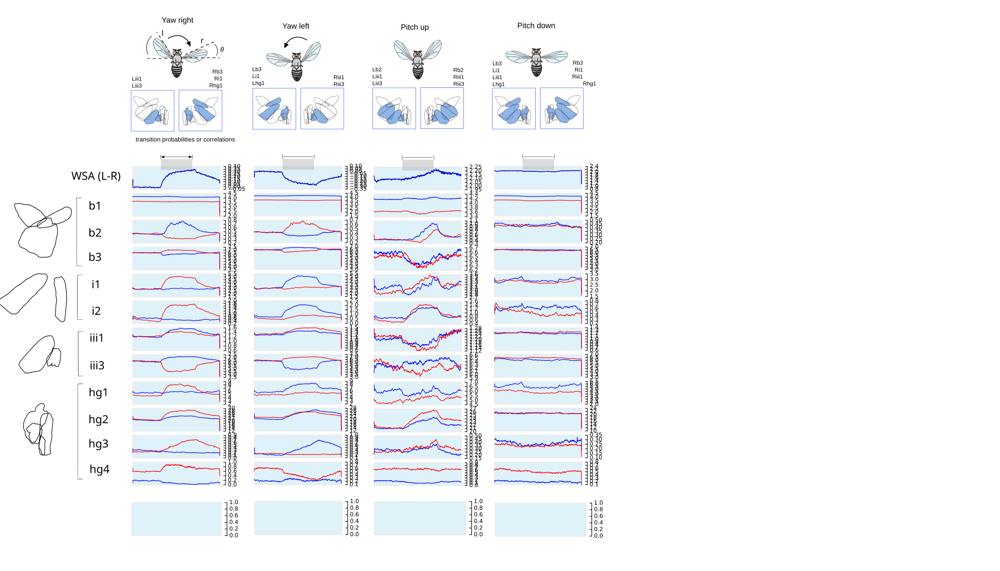

'\n#layout.axes[\'lmr_rt\'].fill_between(times, (yaw_right_dlmr - yaw_right_dlmr_er),  (yaw_right_dlmr + yaw_right_dlmr_er) ,clip_on = False, color = \'k\', alpha = 0.15)\nlayout.axes[\'lmr_rt\'].set_xbound(0,times[-1])\nlayout.axes[\'lmr_rt\'].set_ylabel(\'Stroke \n amplitude\')\nlayout.axes[\'lmr_rt\'].patch.set_alpha(0.0)\nlayout.axes[\'lmr_rt\'].set_ybound(-20,20)\nlayout.axes[\'lmr_rt\'].set_yticks([-15, 0, 15])\nlayout.axes[\'lmr_rt\'].plot(times[120],yaw_right_dlmr[120],\'cyan\', marker=\'o\', markersize=4)#, \'o\') \nlayout.axes[\'lmr_rt\'].plot(times[240],yaw_right_dlmr[240],\'purple\', marker=\'o\', markersize=4)#, \'o\') \n#ax17.set_xbound(times[120],times[240]),ax17.set_ybound(0.8,1.2)\nlayout.axes[\'lmr_rt\'].set_xticks([times[120],times[240]])\n\n\nlayout.axes[\'liii1_rt\'].plot(times,yaw_right_diii3l,clip_on = False,color = \'k\')\n#layout.axes[\'liii1_rt\'].fill_between(times, (yaw_right_diii3l - yaw_right_diii3l_er),  (yaw_right_diii3l + yaw_right_diii3l_er) ,clip_on =

In [76]:
### now do saccade portion to be incorporated in later




from matplotlib.animation import FuncAnimation

import figurefirst as fifi
import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np; np.random.seed(0)
import pandas as pd


layout = fifi.FigureLayout('layouts/paper_figure_7_new_data_9.svg',make_mplfigures = True)


times = np.arange(500)*0.02
colors = times[150:350]




layout.axes['yaw_r_lmr_lw'].plot(times,yaw_right_df['mean'],clip_on = False,color = 'k')

layout.axes['yaw_r_lmr_lw'].plot(times,yaw_right_df['mean'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb1'].plot(times,yaw_right_df['b1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb2'].plot(times,yaw_right_df['b2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb3'].plot(times,yaw_right_df['b3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_li1'].plot(times,yaw_right_df['i1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_li2'].plot(times,yaw_right_df['i2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_liii1'].plot(times,yaw_right_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_liii3'].plot(times,yaw_right_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg1'].plot(times,yaw_right_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg2'].plot(times,yaw_right_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg3'].plot(times,yaw_right_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg4'].plot(times,yaw_right_df['hg4_l'],clip_on = False,color = 'b')

#layout.axes['yaw_r_lmr_lw'].plot(times,yaw_right_df['mean'],clip_on = False,color = 'k')
layout.axes['yaw_r_lmr_lb1'].plot(times,yaw_right_df['b1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lb2'].plot(times,yaw_right_df['b2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lb3'].plot(times,yaw_right_df['b3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_li1'].plot(times,yaw_right_df['i1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_li2'].plot(times,yaw_right_df['i2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_liii1'].plot(times,yaw_right_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_liii3'].plot(times,yaw_right_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg1'].plot(times,yaw_right_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg2'].plot(times,yaw_right_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg3'].plot(times,yaw_right_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg4'].plot(times,yaw_right_df['hg4_r'],clip_on = False,color = 'r')




layout.axes['yaw_l_lmr_lw'].plot(times,yaw_left_df['mean'],clip_on = False,color = 'k')

layout.axes['yaw_l_lmr_lw'].plot(times,yaw_left_df['mean'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb1'].plot(times,yaw_left_df['b1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb2'].plot(times,yaw_left_df['b2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb3'].plot(times,yaw_left_df['b3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_li1'].plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_li2'].plot(times,yaw_left_df['i2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_liii1'].plot(times,yaw_left_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_liii3'].plot(times,yaw_left_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg1'].plot(times,yaw_left_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg2'].plot(times,yaw_left_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg3'].plot(times,yaw_left_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg4'].plot(times,yaw_left_df['hg4_l'],clip_on = False,color = 'b')

#layout.axes['yaw_l_lmr_lw'].plot(times,yaw_left_df['mean'],clip_on = False,color = 'k')
layout.axes['yaw_l_lmr_lb1'].plot(times,yaw_left_df['b1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lb2'].plot(times,yaw_left_df['b2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lb3'].plot(times,yaw_left_df['b3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_li1'].plot(times,yaw_left_df['i1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_li2'].plot(times,yaw_left_df['i2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_liii1'].plot(times,yaw_left_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_liii3'].plot(times,yaw_left_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg1'].plot(times,yaw_left_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg2'].plot(times,yaw_left_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg3'].plot(times,yaw_left_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg4'].plot(times,yaw_left_df['hg4_r'],clip_on = False,color = 'r')




layout.axes['pitch_up_lmr_lw'].plot(times,pitch_up_df['mean'],clip_on = False,color = 'k')

layout.axes['pitch_up_lmr_lw'].plot(times,pitch_up_df['mean'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb1'].plot(times,pitch_up_df['b1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb2'].plot(times,pitch_up_df['b2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb3'].plot(times,pitch_up_df['b3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_li1'].plot(times,pitch_up_df['i1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_li2'].plot(times,pitch_up_df['i2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_liii1'].plot(times,pitch_up_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_liii3'].plot(times,pitch_up_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg1'].plot(times,pitch_up_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg2'].plot(times,pitch_up_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg3'].plot(times,pitch_up_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg4'].plot(times,pitch_up_df['hg4_l'],clip_on = False,color = 'b')

#layout.axes['pitch_up_lmr_lw'].plot(times,pitch_up_df['mean'],clip_on = False,color = 'k')
layout.axes['pitch_up_lmr_lb1'].plot(times,pitch_up_df['b1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lb2'].plot(times,pitch_up_df['b2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lb3'].plot(times,pitch_up_df['b3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_li1'].plot(times,pitch_up_df['i1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_li2'].plot(times,pitch_up_df['i2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_liii1'].plot(times,pitch_up_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_liii3'].plot(times,pitch_up_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg1'].plot(times,pitch_up_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg2'].plot(times,pitch_up_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg3'].plot(times,pitch_up_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg4'].plot(times,pitch_up_df['hg4_r'],clip_on = False,color = 'r')


layout.axes['pitch_down_lmr_lw'].plot(times,pitch_down_df['mean'],clip_on = False,color = 'k')

layout.axes['pitch_down_lmr_lw'].plot(times,pitch_down_df['mean'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb1'].plot(times,pitch_down_df['b1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb2'].plot(times,pitch_down_df['b2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb3'].plot(times,pitch_down_df['b3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_li1'].plot(times,pitch_down_df['i1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_li2'].plot(times,pitch_down_df['i2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_liii1'].plot(times,pitch_down_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_liii3'].plot(times,pitch_down_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg1'].plot(times,pitch_down_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg2'].plot(times,pitch_down_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg3'].plot(times,pitch_down_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg4'].plot(times,pitch_down_df['hg4_l'],clip_on = False,color = 'b')

#layout.axes['pitch_down_lmr_lw'].plot(times,pitch_down_df['mean'],clip_on = False,color = 'k')
layout.axes['pitch_down_lmr_lb1'].plot(times,pitch_down_df['b1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lb2'].plot(times,pitch_down_df['b2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lb3'].plot(times,pitch_down_df['b3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_li1'].plot(times,pitch_down_df['i1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_li2'].plot(times,pitch_down_df['i2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_liii1'].plot(times,pitch_down_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_liii3'].plot(times,pitch_down_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg1'].plot(times,pitch_down_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg2'].plot(times,pitch_down_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg3'].plot(times,pitch_down_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg4'].plot(times,pitch_down_df['hg4_r'],clip_on = False,color = 'r')



fifi.mpl_functions.set_spines(layout)
layout.save('figure_07_v9.svg')
plt.close('all')
display(SVG('figure_07_v9.svg'))


'''
#layout.axes['lmr_rt'].fill_between(times, (yaw_right_dlmr - yaw_right_dlmr_er),  (yaw_right_dlmr + yaw_right_dlmr_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lmr_rt'].set_xbound(0,times[-1])
layout.axes['lmr_rt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_rt'].patch.set_alpha(0.0)
layout.axes['lmr_rt'].set_ybound(-20,20)
layout.axes['lmr_rt'].set_yticks([-15, 0, 15])
layout.axes['lmr_rt'].plot(times[120],yaw_right_dlmr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lmr_rt'].plot(times[240],yaw_right_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 
#ax17.set_xbound(times[120],times[240]),ax17.set_ybound(0.8,1.2)
layout.axes['lmr_rt'].set_xticks([times[120],times[240]])


layout.axes['liii1_rt'].plot(times,yaw_right_diii3l,clip_on = False,color = 'k')
#layout.axes['liii1_rt'].fill_between(times, (yaw_right_diii3l - yaw_right_diii3l_er),  (yaw_right_diii3l + yaw_right_diii3l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['liii1_rt'].set_xbound(0,times[-1])
layout.axes['liii1_rt'].set_ylabel('L iii3')
layout.axes['liii1_rt'].plot(times[120],yaw_right_diii3l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
#layout.axes['liii1_rt'].plot(times[120],iii3l[120],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].plot(times[240],yaw_right_diii3l[240],'purple', marker='o', markersize=4)#, 'o')
layout.axes['liii1_rt'].set_ybound(0.45,0.60)
layout.axes['liii1_rt'].set_yticks([0.45, 0.6])

#x = list(pitch_down_new_df['muscles'])
c_r = times[120:240]
Min = times[119]
Max = times[241]             
x = yaw_right_di1r[120:240]
y = yaw_right_db3r[120:240]
df= pd.DataFrame({"x":x,"y":y,"c":c_r})
cmap = plt.cm.cool
norm = matplotlib.colors.Normalize(vmin=Min, vmax=Max)

ax1 = layout.axes['Liii1_Rb3']
scatter(flylist[6], ('Ri1'),('Rb3'), ax1)
c = ax1.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
#plot_sector(flylist,('left','iii1'),('right','b3'),'nb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
########layout.axes['Liii1_Rb3'].plot(df.x, df.y, color=cmap(norm(df.c.values)), marker = 'o', markersize=2)
#plot_sector(flylist,('left','iii1'),('right','b3'),'lb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
layout.axes['Liii1_Rb3'].set_xbound(0,1),layout.axes['Liii1_Rb3'].set_ybound(0,1)#,ax3.set_xlabel('left b3',color = c_l),ax3.set_ylabel('right b3',color = c_r)
layout.axes['Liii1_Rb3'].set_xticks([0,1])
layout.axes['Liii1_Rb3'].set_yticks([0,1])  
layout.axes['Liii1_Rb3'].set_ybound(0.20,0.45)
layout.axes['Liii1_Rb3'].set_yticks([0.2, 0.45])

x = yaw_right_diii3l[120:240]
y = yaw_right_dhg1r[120:240]
ax2 = layout.axes['Liii3_Rhg1']
scatter(flylist[6], ('Liii3'),('Rhg1'), ax2)
c = ax2.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax2.set_xbound(0,1),ax2.set_ybound(0,1)
ax2.set_xticks([0,1])
ax2.set_yticks([0,1])                
                
x = yaw_right_diii3l[120:240]
y = yaw_right_db3r[120:240]
ax3 = layout.axes['Liii3_Rb3']
scatter(flylist[6], ('Liii3'),('Rb3'), ax3)
c = ax3.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax3.set_xbound(0,1),ax2.set_ybound(0,1)
ax3.set_xticks([0,1])
ax3.set_yticks([0,1])  


x = yaw_right_dhg1r[120:240]
y = yaw_right_di1r[120:240]
ax4 = layout.axes['Ri1_Rhg1']
scatter(flylist[6], ('Ri1'),('Rhg1'), ax4)
c = ax4.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax4.set_xbound(0,1),ax2.set_ybound(0,1)
ax4.set_xticks([0,1])
ax4.set_yticks([0,1])  



            

layout.axes['ri1_rt'].plot(times,yaw_right_di1r,clip_on = False,color = 'k')
#layout.axes['ri1_rt'].fill_between(times, (yaw_right_di1r - yaw_right_di1r_er),  (yaw_right_di1r+ yaw_right_di1r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['ri1_rt'].set_xbound(0,times[-1])
layout.axes['ri1_rt'].set_ylabel('Right i1')
layout.axes['ri1_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['ri1_rt'].plot(times[120],yaw_right_di1r[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['ri1_rt'].plot(times[240],yaw_right_di1r[240],'purple', marker='o', markersize=4)#, 'o') 
#layout.axes['ri1_rt'].set_ybound(0.40,0.60)
#layout.axes['ri1_rt'].set_yticks([0.40, 0.6])
layout.axes['ri1_rt'].set_ybound(0.2,0.45)
layout.axes['ri1_rt'].set_yticks([0.2, 0.45])


layout.axes['rb3_rt'].plot(times,yaw_right_db3r,clip_on = False,color = 'k')
#layout.axes['rb3_rt'].fill_between(times, (yaw_right_db3r - yaw_right_db3r_er),  (yaw_right_db3r+ yaw_right_db3r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['rb3_rt'].set_xbound(0,times[-1])
layout.axes['rb3_rt'].set_ylabel('Right b3')
layout.axes['rb3_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['rb3_rt'].plot(times[120],yaw_right_db3r[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['rb3_rt'].plot(times[240],yaw_right_db3r[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['rb3_rt'].set_ybound(0.55,0.65)
layout.axes['rb3_rt'].set_yticks([0.55, 0.65])



#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)


##write the clips out here and use the derivative to get the signals 



## plot each segment

#----------------------------------------------------------------------


fly = flylist[6]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]



layout.axes['lmr_lt'].plot(times,yaw_left_dlmr,clip_on = False,color = 'k')
#layout.axes['lmr_lt'].fill_between(times, (yaw_left_dlmr - yaw_left_dlmr_er),  (yaw_left_dlmr+ yaw_left_dlmr_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lmr_lt'].set_xbound(0,times[-1])
layout.axes['lmr_lt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_lt'].patch.set_alpha(0.0)
layout.axes['lmr_lt'].set_ybound(-20,20)
layout.axes['lmr_lt'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lmr_lt'].plot(times[130],yaw_left_dlmr[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lmr_lt'].plot(times[240],yaw_left_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 


x = yaw_left_di1l[120:240]
y = yaw_left_diii3r[120:240]
ax5 = layout.axes['Li1_Riii3']
scatter(flylist[6], ('Li1'),('Riii3'), ax5)
c = ax5.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax5.set_xbound(0,1),ax5.set_ybound(0,1)
ax5.set_xticks([0,1])
ax5.set_yticks([0,1])                
                


x = yaw_left_db3l[120:240]
y = yaw_left_diii3r[120:240]
ax6 = layout.axes['Lb3_Riii3']
scatter(flylist[6], ('Lb3'),('Riii3'), ax6)
c = ax6.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax6.set_xbound(0,1),ax6.set_ybound(0,1)
ax6.set_xticks([0,1])
ax6.set_yticks([0,1])                
                               
                
x = yaw_left_dhg1l[120:240]
y = yaw_left_diii3r[120:240]
ax7 = layout.axes['Lhg1_Riii3']
scatter(flylist[6], ('Lhg1'),('Riii3'), ax7)
c = ax7.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax7.set_xbound(0,1),ax7.set_ybound(0,1)
ax7.set_xticks([0,1])
ax7.set_yticks([0,1])  


x = yaw_left_di1l[120:240]
y = yaw_left_diii1r[120:240]
ax8 = layout.axes['Li1_Riii1']
scatter(flylist[6], ('Li1'),('Riii1'), ax8)
c = ax8.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax8.set_xbound(0,1),ax8.set_ybound(0,1)
ax8.set_xticks([0,1])
ax8.set_yticks([0,1])  



layout.axes['riii3_lt'].plot(times,yaw_left_diii3r,clip_on = False,color = 'k')
#layout.axes['riii3_lt'].fill_between(times, (yaw_left_diii3r - yaw_left_diii3r_er),  (yaw_left_diii3r+ yaw_left_diii3r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['riii3_lt'].set_xbound(0,times[-1])
layout.axes['riii3_lt'].set_ylabel('R iii3')
layout.axes['riii3_lt'].set_ybound(0.45,0.60)
layout.axes['riii3_lt'].set_yticks([0.45, 0.6])
layout.axes['riii3_lt'].patch.set_alpha(0.0)
layout.axes['riii3_lt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['riii3_lt'].plot(times[130],yaw_left_diii3r[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['riii3_lt'].plot(times[240],yaw_left_diii3r[240],'purple', marker='o', markersize=4)#, 'o') 


layout.axes['li1_lt'].plot(times,yaw_left_di1l,clip_on = False,color = 'k')
#layout.axes['li1_lt'].fill_between(times, (yaw_left_di1l - yaw_left_di1l_er),  (yaw_left_di1l+ yaw_left_di1l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['li1_lt'].set_xbound(0,times[-1])
layout.axes['li1_lt'].set_ylabel('L i1')
layout.axes['li1_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['li1_lt'].plot(times[130],yaw_left_di1l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['li1_lt'].plot(times[240],yaw_left_di1l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['li1_lt'].set_ybound(0.20,0.40)
layout.axes['li1_lt'].set_yticks([0.20, 0.4])

layout.axes['lb3_lt'].plot(times,yaw_left_db3l,clip_on = False,color = 'k')
#layout.axes['lb3_lt'].fill_between(times, (yaw_left_db3l - yaw_left_db3l_er),  (yaw_left_db3l+ yaw_left_db3l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lb3_lt'].set_xbound(0,times[-1])
layout.axes['lb3_lt'].set_ylabel('L b3')
layout.axes['lb3_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lb3_lt'].plot(times[130],yaw_left_db3l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_lt'].plot(times[240],yaw_left_db3l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_lt'].set_ybound(0.50,0.60)
layout.axes['lb3_lt'].set_yticks([0.50, 0.60])




#____________________________________________________________________





fly = flylist[3]
snum = 1  #5


l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]

times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)

layout.axes['lpr_WSAi'].plot(times,WSAi_dlmr,clip_on = False,color = 'k')
layout.axes['lpr_WSAi'].set_xbound(0,times[-1])
layout.axes['lpr_WSAi'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAi'].patch.set_alpha(0.0)
#layout.axes['lpr_WSAi'].set_ybound(-20,20)
layout.axes['lpr_WSAi'].set_yticks([50, 75])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lpr_WSAi'].plot(times[120],WSAi_dlmr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lpr_WSAi'].plot(times[240],WSAi_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 




x = WSAi_db2l[120:240]
y = WSAi_diii3r[120:240]
ax9 = layout.axes['Lb2_Riii3']
scatter(flylist[6], ('Lb2'),('Riii3'), ax9)
c = ax9.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax9.set_xbound(0,1),ax9.set_ybound(0,1)
ax9.set_xticks([0,1])
ax9.set_yticks([0,1])                
                


x = WSAi_diii3l[120:240]
y = WSAi_diii3r[120:240]
ax10 = layout.axes['Liii3_Riii3']
scatter(flylist[6], ('Liii3'),('Riii3'), ax10)
c = ax10.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax10.set_xbound(0,1),ax10.set_ybound(0,1)
ax10.set_xticks([0,1])
ax10.set_yticks([0,1])                
                               
                
x = WSAi_diii1l[120:240]
y = WSAi_diii3r[120:240]
ax11 = layout.axes['Liii1_Riii3']
scatter(flylist[6], ('Liii1'),('Riii3'), ax11)
c = ax11.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax11.set_xbound(0,1),ax11.set_ybound(0,1)
ax11.set_xticks([0,1])
ax11.set_yticks([0,1])  


x = iii1l[120:240]
y = iii1r[120:240]
ax12 = layout.axes['Liii1_Riii1']
scatter(flylist[6], ('Liii1'),('Riii1'), ax12)
c = ax12.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax12.set_xbound(0,1),ax12.set_ybound(0,1)
ax12.set_xticks([0,1])
ax12.set_yticks([0,1])  



layout.axes['lb2_WSAi'].plot(times,WSAi_db2l,clip_on = False,color = 'k')
layout.axes['lb2_WSAi'].set_xbound(0,times[-1])
layout.axes['lb2_WSAi'].set_ylabel('L b2')
layout.axes['lb2_WSAi'].patch.set_alpha(0.0)
layout.axes['lb2_WSAi'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['lb2_WSAi'].plot(times[120],WSAi_db2l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb2_WSAi'].plot(times[240],WSAi_db2l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['lb2_WSAi'].set_ybound(0.19,0.23)
layout.axes['lb2_WSAi'].set_yticks([0.19, 0.23])


layout.axes['liii3_WSAi'].plot(times,WSAi_diii3l,clip_on = False,color = 'k')
layout.axes['liii3_WSAi'].set_xbound(0,times[-1])
layout.axes['liii3_WSAi'].set_ylabel('L iii3')
layout.axes['liii3_WSAi'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['liii3_WSAi'].plot(times[130],WSAi_diii3l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii3_WSAi'].plot(times[240],WSAi_diii3l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii3_WSAi'].set_ybound(0.45,0.60)
layout.axes['liii3_WSAi'].set_yticks([0.40, 0.6])

layout.axes['liii1_WSAi'].plot(times,WSAi_diii1l,clip_on = False,color = 'k')
layout.axes['liii1_WSAi'].set_xbound(0,times[-1])
layout.axes['liii1_WSAi'].set_ylabel('L iii1')
layout.axes['liii1_WSAi'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['liii1_WSAi'].plot(times[130],WSAi_diii1l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_WSAi'].plot(times[240],WSAi_diii1l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_WSAi'].set_ybound(0.150,0.18)
layout.axes['liii1_WSAi'].set_yticks([0.150, 0.18])








#____________________________________________________________________________

fly = flylist[1]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)

b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]


layout.axes['lpr_WSAd'].plot(times,WSAd_dlmr,clip_on = False,color = 'k')
layout.axes['lpr_WSAd'].set_xbound(0,times[-1])
layout.axes['lpr_WSAd'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAd'].patch.set_alpha(0.0)
layout.axes['lpr_WSAd'].set_ybound(50,75)
layout.axes['lpr_WSAd'].set_yticks([50, 75])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lpr_WSAd'].plot(times[120],WSAd_dlmr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lpr_WSAd'].plot(times[240],WSAd_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 




x = WSAd_db3l[120:240]
y = WSAd_db3r[120:240]
ax13 = layout.axes['Lb3_Rb3']
scatter(flylist[6], ('Lb3'),('Rb3'), ax13)
c = ax13.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax13.set_xbound(0,1),ax13.set_ybound(0,1)
ax13.set_xticks([0,1])
ax13.set_yticks([0,1])                
                


x = WSAd_dhg1l[120:240]
y = WSAd_dhg1r[120:240]
ax14 = layout.axes['Lhg1_Rhg1']
scatter(flylist[6], ('Lhg1'),('Rhg1'), ax14)
c = ax14.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax14.set_xbound(0,1),ax14.set_ybound(0,1)
ax14.set_xticks([0,1])
ax14.set_yticks([0,1])                
                               
                
x = WSAd_db3l[120:240]
y = WSAd_diii1r[120:240]
ax15 = layout.axes['Lb3_Riii1']
scatter(flylist[6], ('Lb3'),('Riii1'), ax15)
c = ax15.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax15.set_xbound(0,1),ax15.set_ybound(0,1)
ax15.set_xticks([0,1])
ax15.set_yticks([0,1])  


x = WSAd_dhg1l[120:240]
y = WSAd_di1r[120:240]
ax16 = layout.axes['Lhg1_Ri1']
scatter(flylist[6], ('Lhg1'),('Ri1'), ax16)
c = ax16.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax16.set_xbound(0,1),ax16.set_ybound(0,1)
ax16.set_xticks([0,1])
ax16.set_yticks([0,1])  


x = times[120:240]
y = np.ones(20)
ax17 = layout.axes['cmap_legend']
x_prime = x[::6]
colors = x_prime
c = ax17.scatter(x_prime, y, c=colors, cmap='cool', alpha=0.45)
ax17.set_xbound(times[120],times[240]),ax17.set_ybound(0.8,1.2)
ax17.set_xticks([times[120],times[240]])
ax17.set_yticks([1])  



layout.axes['li1_WSAd'].plot(times,WSAd_di1l,clip_on = False,color = 'k')
layout.axes['li1_WSAd'].set_xbound(0,times[-1])
layout.axes['li1_WSAd'].set_ylabel('L i1')
layout.axes['li1_WSAd'].patch.set_alpha(0.0)
layout.axes['li1_WSAd'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['li1_WSAd'].plot(times[120],WSAd_di1l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['li1_WSAd'].plot(times[240],WSAd_di1l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['li1_WSAd'].set_ybound(0.20,0.4)
layout.axes['li1_WSAd'].set_yticks([0.20, 0.40])

layout.axes['lb3_WSAd'].plot(times,WSAd_db3l,clip_on = False,color = 'k')
layout.axes['lb3_WSAd'].set_xbound(0,times[-1])
layout.axes['lb3_WSAd'].set_ylabel('L b3')
layout.axes['lb3_WSAd'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lb3_WSAd'].plot(times[120],WSAd_db3l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_WSAd'].plot(times[240],WSAd_db3l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_WSAd'].set_ybound(0.40,0.60)
layout.axes['lb3_WSAd'].set_yticks([0.40, 0.6])

layout.axes['lhg1_WSAd'].plot(times,WSAd_db1l,clip_on = False,color = 'k')
layout.axes['lhg1_WSAd'].set_xbound(0,times[-1])
layout.axes['lhg1_WSAd'].set_ylabel('L b1')
layout.axes['lhg1_WSAd'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lhg1_WSAd'].plot(times[120],WSAd_db1l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lhg1_WSAd'].plot(times[240],WSAd_db1l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['lhg1_WSAd'].set_ybound(0.55,0.58)
layout.axes['lhg1_WSAd'].set_yticks([0.55, 0.58])







fifi.mpl_functions.set_spines(layout)
layout.save('figure_05_v7.svg')
plt.close('all')
display(SVG('figure_05_v7.svg'))

'''

In [ ]:
### now do saccade portion to be incorporated in later




from matplotlib.animation import FuncAnimation

import figurefirst as fifi

#layout = fifi.FigureLayout('paper_figure_1_v2.svg',make_mplfigures = True)
layout = fifi.FigureLayout('layouts/paper_figure_4_v7.svg',make_mplfigures = True)

#layout.axes['yaw_left'].plot(time, mean_WBA) #,'o',alpha = 0.2)
#layout.axes['yaw_left'].fill_between(time, (mean_WBA-error), (mean_WBA + error),alpha = 0.1)

#layout.axes['yaw_right'].plot(time, mean_WBA_turn_right) #,'o',alpha = 0.2)
#layout.axes['yaw_right'].fill_between(time, (mean_WBA_turn_right-error_turn_right), (mean_WBA_turn_right + error_turn_right),alpha = 0.1)

import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np; np.random.seed(0)
import pandas as pd



x = np.arange(-10,10)
layout.axes['phasic'].plot(x, x**3)
layout.axes['tonic'].plot(x, x** (1. / 3))
layout.axes['phasic'].set_xbound(-10, 10)
layout.axes['tonic'].set_xbound(-10, 10)
layout.axes['tonic'].axhline(y=0, color='k')
layout.axes['tonic'].axvline(x=0, color='k')
layout.axes['phasic'].axhline(y=0, color='k')
layout.axes['phasic'].axvline(x=0, color='k')
#layout.axes['phasic'].set_ybound(-10, 10)
layout.axes['tonic'].set_ybound([-3, 3])
layout.axes['tonic'].plot(x, np.cbrt(x))




fly = flylist[6]
snum = 1  #5

#l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]

times = np.arange(len(x))*0.02
colors = times[120:240]


x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


###check normed signals method 


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]

'''
layout.axes['l_wsa'].plot(times,l_deg,clip_on = False,color = 'k')
layout.axes['l_wsa'].set_xbound(0,times[-1])
layout.axes['l_wsa'].set_ylabel('left \n amplitude')
layout.axes['l_wsa'].patch.set_alpha(0.0)
layout.axes['l_wsa'].set_ybound(20,40)
layout.axes['l_wsa'].set_yticks([20, 30, 40])
#layout.axes['l_wsa'].set_ybound(-15,15)
#layout.axes['l_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)

layout.axes['r_wsa'].plot(times,r_deg,clip_on = False,color = 'k')
layout.axes['r_wsa'].set_xbound(0,times[-1])
layout.axes['r_wsa'].set_ylabel('right \n amplitude')
layout.axes['r_wsa'].patch.set_alpha(0.0)
layout.axes['r_wsa'].set_ybound(20,40)
layout.axes['r_wsa'].set_yticks([20, 30, 40])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)

'''

layout.axes['lmr_rt'].plot(times,yaw_right_dlmr,clip_on = False,color = 'k')
#layout.axes['lmr_rt'].fill_between(times, (yaw_right_dlmr - yaw_right_dlmr_er),  (yaw_right_dlmr + yaw_right_dlmr_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lmr_rt'].set_xbound(0,times[-1])
layout.axes['lmr_rt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_rt'].patch.set_alpha(0.0)
layout.axes['lmr_rt'].set_ybound(-20,20)
layout.axes['lmr_rt'].set_yticks([-15, 0, 15])
layout.axes['lmr_rt'].plot(times[120],yaw_right_dlmr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lmr_rt'].plot(times[240],yaw_right_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 
#ax17.set_xbound(times[120],times[240]),ax17.set_ybound(0.8,1.2)
layout.axes['lmr_rt'].set_xticks([times[120],times[240]])


layout.axes['liii1_rt'].plot(times,yaw_right_diii3l,clip_on = False,color = 'k')
#layout.axes['liii1_rt'].fill_between(times, (yaw_right_diii3l - yaw_right_diii3l_er),  (yaw_right_diii3l + yaw_right_diii3l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['liii1_rt'].set_xbound(0,times[-1])
layout.axes['liii1_rt'].set_ylabel('L iii3')
layout.axes['liii1_rt'].plot(times[120],yaw_right_diii3l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
#layout.axes['liii1_rt'].plot(times[120],iii3l[120],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].plot(times[240],yaw_right_diii3l[240],'purple', marker='o', markersize=4)#, 'o')
layout.axes['liii1_rt'].set_ybound(0.45,0.60)
layout.axes['liii1_rt'].set_yticks([0.45, 0.6])

#x = list(pitch_down_new_df['muscles'])
c_r = times[120:240]
Min = times[119]
Max = times[241]             
x = yaw_right_di1r[120:240]
y = yaw_right_db3r[120:240]
df= pd.DataFrame({"x":x,"y":y,"c":c_r})
cmap = plt.cm.cool
norm = matplotlib.colors.Normalize(vmin=Min, vmax=Max)

ax1 = layout.axes['Liii1_Rb3']
scatter(flylist[6], ('Ri1'),('Rb3'), ax1)
c = ax1.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
#plot_sector(flylist,('left','iii1'),('right','b3'),'nb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
########layout.axes['Liii1_Rb3'].plot(df.x, df.y, color=cmap(norm(df.c.values)), marker = 'o', markersize=2)
#plot_sector(flylist,('left','iii1'),('right','b3'),'lb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
layout.axes['Liii1_Rb3'].set_xbound(0,1),layout.axes['Liii1_Rb3'].set_ybound(0,1)#,ax3.set_xlabel('left b3',color = c_l),ax3.set_ylabel('right b3',color = c_r)
layout.axes['Liii1_Rb3'].set_xticks([0,1])
layout.axes['Liii1_Rb3'].set_yticks([0,1])  
layout.axes['Liii1_Rb3'].set_ybound(0.20,0.45)
layout.axes['Liii1_Rb3'].set_yticks([0.2, 0.45])

x = yaw_right_diii3l[120:240]
y = yaw_right_dhg1r[120:240]
ax2 = layout.axes['Liii3_Rhg1']
scatter(flylist[6], ('Liii3'),('Rhg1'), ax2)
c = ax2.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax2.set_xbound(0,1),ax2.set_ybound(0,1)
ax2.set_xticks([0,1])
ax2.set_yticks([0,1])                
                
x = yaw_right_diii3l[120:240]
y = yaw_right_db3r[120:240]
ax3 = layout.axes['Liii3_Rb3']
scatter(flylist[6], ('Liii3'),('Rb3'), ax3)
c = ax3.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax3.set_xbound(0,1),ax2.set_ybound(0,1)
ax3.set_xticks([0,1])
ax3.set_yticks([0,1])  


x = yaw_right_dhg1r[120:240]
y = yaw_right_di1r[120:240]
ax4 = layout.axes['Ri1_Rhg1']
scatter(flylist[6], ('Ri1'),('Rhg1'), ax4)
c = ax4.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax4.set_xbound(0,1),ax2.set_ybound(0,1)
ax4.set_xticks([0,1])
ax4.set_yticks([0,1])  



            

layout.axes['ri1_rt'].plot(times,yaw_right_di1r,clip_on = False,color = 'k')
#layout.axes['ri1_rt'].fill_between(times, (yaw_right_di1r - yaw_right_di1r_er),  (yaw_right_di1r+ yaw_right_di1r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['ri1_rt'].set_xbound(0,times[-1])
layout.axes['ri1_rt'].set_ylabel('Right i1')
layout.axes['ri1_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['ri1_rt'].plot(times[120],yaw_right_di1r[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['ri1_rt'].plot(times[240],yaw_right_di1r[240],'purple', marker='o', markersize=4)#, 'o') 
#layout.axes['ri1_rt'].set_ybound(0.40,0.60)
#layout.axes['ri1_rt'].set_yticks([0.40, 0.6])
layout.axes['ri1_rt'].set_ybound(0.2,0.45)
layout.axes['ri1_rt'].set_yticks([0.2, 0.45])


layout.axes['rb3_rt'].plot(times,yaw_right_db3r,clip_on = False,color = 'k')
#layout.axes['rb3_rt'].fill_between(times, (yaw_right_db3r - yaw_right_db3r_er),  (yaw_right_db3r+ yaw_right_db3r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['rb3_rt'].set_xbound(0,times[-1])
layout.axes['rb3_rt'].set_ylabel('Right b3')
layout.axes['rb3_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['rb3_rt'].plot(times[120],yaw_right_db3r[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['rb3_rt'].plot(times[240],yaw_right_db3r[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['rb3_rt'].set_ybound(0.55,0.65)
layout.axes['rb3_rt'].set_yticks([0.55, 0.65])



#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)


##write the clips out here and use the derivative to get the signals 



## plot each segment

#----------------------------------------------------------------------


fly = flylist[6]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]



layout.axes['lmr_lt'].plot(times,yaw_left_dlmr,clip_on = False,color = 'k')
#layout.axes['lmr_lt'].fill_between(times, (yaw_left_dlmr - yaw_left_dlmr_er),  (yaw_left_dlmr+ yaw_left_dlmr_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lmr_lt'].set_xbound(0,times[-1])
layout.axes['lmr_lt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_lt'].patch.set_alpha(0.0)
layout.axes['lmr_lt'].set_ybound(-20,20)
layout.axes['lmr_lt'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lmr_lt'].plot(times[130],yaw_left_dlmr[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lmr_lt'].plot(times[240],yaw_left_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 


x = yaw_left_di1l[120:240]
y = yaw_left_diii3r[120:240]
ax5 = layout.axes['Li1_Riii3']
scatter(flylist[6], ('Li1'),('Riii3'), ax5)
c = ax5.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax5.set_xbound(0,1),ax5.set_ybound(0,1)
ax5.set_xticks([0,1])
ax5.set_yticks([0,1])                
                


x = yaw_left_db3l[120:240]
y = yaw_left_diii3r[120:240]
ax6 = layout.axes['Lb3_Riii3']
scatter(flylist[6], ('Lb3'),('Riii3'), ax6)
c = ax6.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax6.set_xbound(0,1),ax6.set_ybound(0,1)
ax6.set_xticks([0,1])
ax6.set_yticks([0,1])                
                               
                
x = yaw_left_dhg1l[120:240]
y = yaw_left_diii3r[120:240]
ax7 = layout.axes['Lhg1_Riii3']
scatter(flylist[6], ('Lhg1'),('Riii3'), ax7)
c = ax7.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax7.set_xbound(0,1),ax7.set_ybound(0,1)
ax7.set_xticks([0,1])
ax7.set_yticks([0,1])  


x = yaw_left_di1l[120:240]
y = yaw_left_diii1r[120:240]
ax8 = layout.axes['Li1_Riii1']
scatter(flylist[6], ('Li1'),('Riii1'), ax8)
c = ax8.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax8.set_xbound(0,1),ax8.set_ybound(0,1)
ax8.set_xticks([0,1])
ax8.set_yticks([0,1])  



layout.axes['riii3_lt'].plot(times,yaw_left_diii3r,clip_on = False,color = 'k')
#layout.axes['riii3_lt'].fill_between(times, (yaw_left_diii3r - yaw_left_diii3r_er),  (yaw_left_diii3r+ yaw_left_diii3r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['riii3_lt'].set_xbound(0,times[-1])
layout.axes['riii3_lt'].set_ylabel('R iii3')
layout.axes['riii3_lt'].set_ybound(0.45,0.60)
layout.axes['riii3_lt'].set_yticks([0.45, 0.6])
layout.axes['riii3_lt'].patch.set_alpha(0.0)
layout.axes['riii3_lt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['riii3_lt'].plot(times[130],yaw_left_diii3r[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['riii3_lt'].plot(times[240],yaw_left_diii3r[240],'purple', marker='o', markersize=4)#, 'o') 


layout.axes['li1_lt'].plot(times,yaw_left_di1l,clip_on = False,color = 'k')
#layout.axes['li1_lt'].fill_between(times, (yaw_left_di1l - yaw_left_di1l_er),  (yaw_left_di1l+ yaw_left_di1l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['li1_lt'].set_xbound(0,times[-1])
layout.axes['li1_lt'].set_ylabel('L i1')
layout.axes['li1_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['li1_lt'].plot(times[130],yaw_left_di1l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['li1_lt'].plot(times[240],yaw_left_di1l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['li1_lt'].set_ybound(0.20,0.40)
layout.axes['li1_lt'].set_yticks([0.20, 0.4])

layout.axes['lb3_lt'].plot(times,yaw_left_db3l,clip_on = False,color = 'k')
#layout.axes['lb3_lt'].fill_between(times, (yaw_left_db3l - yaw_left_db3l_er),  (yaw_left_db3l+ yaw_left_db3l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lb3_lt'].set_xbound(0,times[-1])
layout.axes['lb3_lt'].set_ylabel('L b3')
layout.axes['lb3_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lb3_lt'].plot(times[130],yaw_left_db3l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_lt'].plot(times[240],yaw_left_db3l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_lt'].set_ybound(0.50,0.60)
layout.axes['lb3_lt'].set_yticks([0.50, 0.60])




#____________________________________________________________________





fly = flylist[3]
snum = 1  #5


l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]

times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)

layout.axes['lpr_WSAi'].plot(times,WSAi_dlmr,clip_on = False,color = 'k')
layout.axes['lpr_WSAi'].set_xbound(0,times[-1])
layout.axes['lpr_WSAi'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAi'].patch.set_alpha(0.0)
#layout.axes['lpr_WSAi'].set_ybound(-20,20)
layout.axes['lpr_WSAi'].set_yticks([50, 75])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lpr_WSAi'].plot(times[120],WSAi_dlmr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lpr_WSAi'].plot(times[240],WSAi_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 




x = WSAi_db2l[120:240]
y = WSAi_diii3r[120:240]
ax9 = layout.axes['Lb2_Riii3']
scatter(flylist[6], ('Lb2'),('Riii3'), ax9)
c = ax9.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax9.set_xbound(0,1),ax9.set_ybound(0,1)
ax9.set_xticks([0,1])
ax9.set_yticks([0,1])                
                


x = WSAi_diii3l[120:240]
y = WSAi_diii3r[120:240]
ax10 = layout.axes['Liii3_Riii3']
scatter(flylist[6], ('Liii3'),('Riii3'), ax10)
c = ax10.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax10.set_xbound(0,1),ax10.set_ybound(0,1)
ax10.set_xticks([0,1])
ax10.set_yticks([0,1])                
                               
                
x = WSAi_diii1l[120:240]
y = WSAi_diii3r[120:240]
ax11 = layout.axes['Liii1_Riii3']
scatter(flylist[6], ('Liii1'),('Riii3'), ax11)
c = ax11.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax11.set_xbound(0,1),ax11.set_ybound(0,1)
ax11.set_xticks([0,1])
ax11.set_yticks([0,1])  


x = iii1l[120:240]
y = iii1r[120:240]
ax12 = layout.axes['Liii1_Riii1']
scatter(flylist[6], ('Liii1'),('Riii1'), ax12)
c = ax12.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax12.set_xbound(0,1),ax12.set_ybound(0,1)
ax12.set_xticks([0,1])
ax12.set_yticks([0,1])  



layout.axes['lb2_WSAi'].plot(times,WSAi_db2l,clip_on = False,color = 'k')
layout.axes['lb2_WSAi'].set_xbound(0,times[-1])
layout.axes['lb2_WSAi'].set_ylabel('L b2')
layout.axes['lb2_WSAi'].patch.set_alpha(0.0)
layout.axes['lb2_WSAi'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['lb2_WSAi'].plot(times[120],WSAi_db2l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb2_WSAi'].plot(times[240],WSAi_db2l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['lb2_WSAi'].set_ybound(0.19,0.23)
layout.axes['lb2_WSAi'].set_yticks([0.19, 0.23])


layout.axes['liii3_WSAi'].plot(times,WSAi_diii3l,clip_on = False,color = 'k')
layout.axes['liii3_WSAi'].set_xbound(0,times[-1])
layout.axes['liii3_WSAi'].set_ylabel('L iii3')
layout.axes['liii3_WSAi'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['liii3_WSAi'].plot(times[130],WSAi_diii3l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii3_WSAi'].plot(times[240],WSAi_diii3l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii3_WSAi'].set_ybound(0.45,0.60)
layout.axes['liii3_WSAi'].set_yticks([0.40, 0.6])

layout.axes['liii1_WSAi'].plot(times,WSAi_diii1l,clip_on = False,color = 'k')
layout.axes['liii1_WSAi'].set_xbound(0,times[-1])
layout.axes['liii1_WSAi'].set_ylabel('L iii1')
layout.axes['liii1_WSAi'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['liii1_WSAi'].plot(times[130],WSAi_diii1l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_WSAi'].plot(times[240],WSAi_diii1l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_WSAi'].set_ybound(0.150,0.18)
layout.axes['liii1_WSAi'].set_yticks([0.150, 0.18])








#____________________________________________________________________________

fly = flylist[1]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)

b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]


layout.axes['lpr_WSAd'].plot(times,WSAd_dlmr,clip_on = False,color = 'k')
layout.axes['lpr_WSAd'].set_xbound(0,times[-1])
layout.axes['lpr_WSAd'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAd'].patch.set_alpha(0.0)
layout.axes['lpr_WSAd'].set_ybound(50,75)
layout.axes['lpr_WSAd'].set_yticks([50, 75])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lpr_WSAd'].plot(times[120],WSAd_dlmr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lpr_WSAd'].plot(times[240],WSAd_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 




x = WSAd_db3l[120:240]
y = WSAd_db3r[120:240]
ax13 = layout.axes['Lb3_Rb3']
scatter(flylist[6], ('Lb3'),('Rb3'), ax13)
c = ax13.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax13.set_xbound(0,1),ax13.set_ybound(0,1)
ax13.set_xticks([0,1])
ax13.set_yticks([0,1])                
                


x = WSAd_dhg1l[120:240]
y = WSAd_dhg1r[120:240]
ax14 = layout.axes['Lhg1_Rhg1']
scatter(flylist[6], ('Lhg1'),('Rhg1'), ax14)
c = ax14.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax14.set_xbound(0,1),ax14.set_ybound(0,1)
ax14.set_xticks([0,1])
ax14.set_yticks([0,1])                
                               
                
x = WSAd_db3l[120:240]
y = WSAd_diii1r[120:240]
ax15 = layout.axes['Lb3_Riii1']
scatter(flylist[6], ('Lb3'),('Riii1'), ax15)
c = ax15.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax15.set_xbound(0,1),ax15.set_ybound(0,1)
ax15.set_xticks([0,1])
ax15.set_yticks([0,1])  


x = WSAd_dhg1l[120:240]
y = WSAd_di1r[120:240]
ax16 = layout.axes['Lhg1_Ri1']
scatter(flylist[6], ('Lhg1'),('Ri1'), ax16)
c = ax16.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax16.set_xbound(0,1),ax16.set_ybound(0,1)
ax16.set_xticks([0,1])
ax16.set_yticks([0,1])  


x = times[120:240]
y = np.ones(20)
ax17 = layout.axes['cmap_legend']
x_prime = x[::6]
colors = x_prime
c = ax17.scatter(x_prime, y, c=colors, cmap='cool', alpha=0.45)
ax17.set_xbound(times[120],times[240]),ax17.set_ybound(0.8,1.2)
ax17.set_xticks([times[120],times[240]])
ax17.set_yticks([1])  



layout.axes['li1_WSAd'].plot(times,WSAd_di1l,clip_on = False,color = 'k')
layout.axes['li1_WSAd'].set_xbound(0,times[-1])
layout.axes['li1_WSAd'].set_ylabel('L i1')
layout.axes['li1_WSAd'].patch.set_alpha(0.0)
layout.axes['li1_WSAd'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['li1_WSAd'].plot(times[120],WSAd_di1l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['li1_WSAd'].plot(times[240],WSAd_di1l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['li1_WSAd'].set_ybound(0.20,0.4)
layout.axes['li1_WSAd'].set_yticks([0.20, 0.40])

layout.axes['lb3_WSAd'].plot(times,WSAd_db3l,clip_on = False,color = 'k')
layout.axes['lb3_WSAd'].set_xbound(0,times[-1])
layout.axes['lb3_WSAd'].set_ylabel('L b3')
layout.axes['lb3_WSAd'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lb3_WSAd'].plot(times[120],WSAd_db3l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_WSAd'].plot(times[240],WSAd_db3l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_WSAd'].set_ybound(0.40,0.60)
layout.axes['lb3_WSAd'].set_yticks([0.40, 0.6])

layout.axes['lhg1_WSAd'].plot(times,WSAd_db1l,clip_on = False,color = 'k')
layout.axes['lhg1_WSAd'].set_xbound(0,times[-1])
layout.axes['lhg1_WSAd'].set_ylabel('L b1')
layout.axes['lhg1_WSAd'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lhg1_WSAd'].plot(times[120],WSAd_db1l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lhg1_WSAd'].plot(times[240],WSAd_db1l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['lhg1_WSAd'].set_ybound(0.55,0.58)
layout.axes['lhg1_WSAd'].set_yticks([0.55, 0.58])







fifi.mpl_functions.set_spines(layout)
layout.save('figure_05_v7.svg')
plt.close('all')
display(SVG('figure_05_v7.svg'))

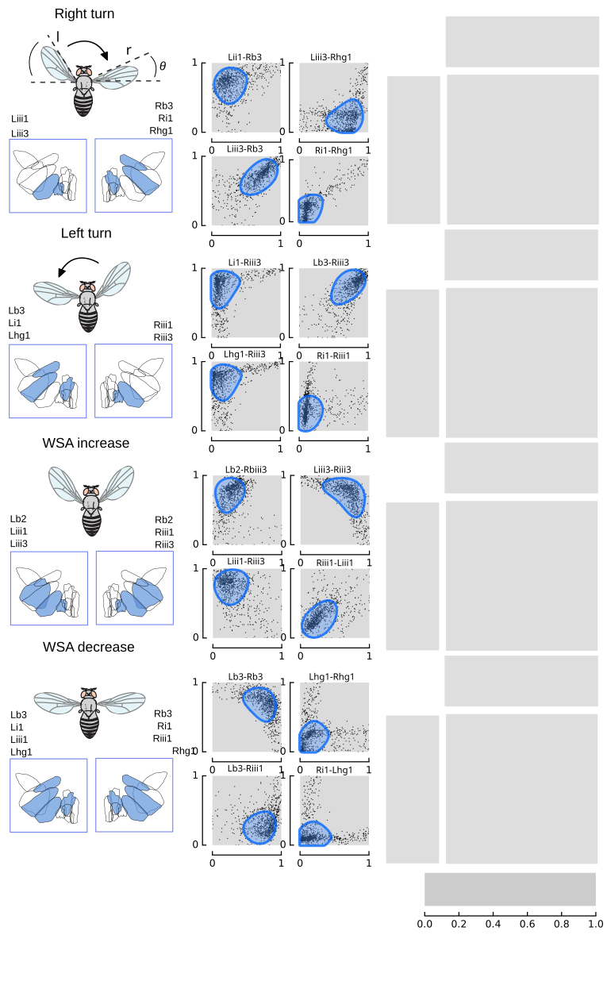

In [18]:
#lpf.make_scatter_plots(flylist[6])#,layout.axes_groups)

#layout = fifi.FigureLayout('layouts/scatter_anc_contour_layout.svg',make_mplfigures = True)
layout = fifi.FigureLayout('layouts/paper_figure_4_v3.svg',make_mplfigures = True)




c_l = layout.pathspecs['lb-nu'].mplkwargs()['edgecolor']
c_r = layout.pathspecs['rb-nu'].mplkwargs()['edgecolor']


#make_scatter_plots(flylist[6],layout.axes_groups['none']['scatter_mtrx'])



ax2 = layout.axes['Lb3_Rb3']
scatter(flylist[6], ('Lb3'),('Rb3'), ax2)
plot_sector(flylist,('left','b3'),('right','b3'),'nb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax2.set_xbound(0,1),ax2.set_ybound(0,1)#,ax2.set_xlabel('left b3',color = c_l),ax2.set_ylabel('right b3',color = c_r)
ax2.set_xticks([0,1])
ax2.set_yticks([0,1])


ax3 = layout.axes['Liii1_Rb3']
scatter(flylist[6], ('Liii1'),('Rb3'), ax3)
plot_sector(flylist,('left','iii1'),('right','b3'),'nb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax3.set_xbound(0,1),ax3.set_ybound(0,1)#,ax3.set_xlabel('left b3',color = c_l),ax3.set_ylabel('right b3',color = c_r)
ax3.set_xticks([0,1])
ax3.set_yticks([0,1])

ax4 = layout.axes['Liii3_Rhg1']
scatter(flylist[6], ('Liii3'),('Rhg1'), ax4)
plot_sector(flylist,('left','iii3'),('right','hg1'),'nb-nu',ax4,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax4.set_xbound(0,1),ax4.set_ybound(0,1)#,ax4.set_xlabel('left b3',color = c_l),ax4.set_ylabel('right b3',color = c_r)
ax4.set_xticks([0,1])
ax4.set_yticks([0,1])

ax5 = layout.axes['Liii3_Rb3']
scatter(flylist[6], ('Liii3'),('Rb3'), ax5)
plot_sector(flylist,('left','iii3'),('right','b3'),'nb-nu',ax5,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax5.set_xbound(0,1),ax5.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax5.set_ylabel('right b3',color = c_r)
ax5.set_xticks([0,1])
ax5.set_yticks([0,1])

ax6 = layout.axes['Ri1_Rhg1']
scatter(flylist[6], ('Ri1'),('Rhg1'), ax6)
plot_sector(flylist,('right','i1'),('right','hg1'),'nb-nu',ax6,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax6.set_xbound(0,1),ax5.set_ybound(0,1)#,ax6.set_xlabel('left b3',color = c_l),ax6.set_ylabel('right b3',color = c_r)
ax6.set_xticks([0,1])
ax6.set_yticks([0,1])

ax7 = layout.axes['Li1_Riii3']
scatter(flylist[6], ('Li1'),('Riii3'), ax7)
plot_sector(flylist,('left','i1'),('right','iii3'),'nb-nu',ax7,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax7.set_xbound(0,1),ax7.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax7.set_xticks([0,1])
ax7.set_yticks([0,1])

ax8 = layout.axes['Lb3_Riii3']
scatter(flylist[6], ('Lb3'),('Riii3'), ax8)
plot_sector(flylist,('left','b3'),('right','iii3'),'nb-nu',ax8,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax8.set_xbound(0,1),ax8.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax8.set_xticks([0,1])
ax8.set_yticks([0,1])


ax9 = layout.axes['Lhg1_Riii3']
scatter(flylist[6], ('Lhg1'),('Riii3'), ax9)
plot_sector(flylist,('left','hg1'),('right','iii3'),'nb-nu',ax9,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax9.set_xbound(0,1),ax9.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax9.set_xticks([0,1])
ax9.set_yticks([0,1])

ax10 = layout.axes['Ri1_Riii1']
scatter(flylist[6], ('Ri1'),('Riii1'), ax10)
plot_sector(flylist,('right','i1'),('right','iii1'),'nb-nu',ax10,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax10.set_xbound(0,1),ax10.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax10.set_xticks([0,1])
ax10.set_yticks([0,1])


ax11 = layout.axes['Lb2_Riii3']
scatter(flylist[6], ('Lb2'),('Riii3'), ax11)
plot_sector(flylist,('left','b2'),('right','iii3'),'nb-nu',ax11,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax11.set_xbound(0,1),ax11.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax11.set_xticks([0,1])
ax11.set_yticks([0,1])

ax12 = layout.axes['Liii3_Riii3']
scatter(flylist[6], ('Liii3'),('Riii3'), ax12)
plot_sector(flylist,('left','iii3'),('right','iii3'),'nb-nu',ax12,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax12.set_xbound(0,1),ax12.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax12.set_xticks([0,1])
ax12.set_yticks([0,1])

ax13 = layout.axes['Liii1_Riii3']
scatter(flylist[6], ('Liii1'),('Riii3'), ax13)
plot_sector(flylist,('left','iii1'),('right','iii3'),'nb-nu',ax13,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax13.set_xbound(0,1),ax13.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax13.set_xticks([0,1])
ax13.set_yticks([0,1])

ax14 = layout.axes['Liii1_Riii1']
scatter(flylist[6], ('Liii1'),('Riii1'), ax14)
plot_sector(flylist,('left','iii1'),('right','iii1'),'nb-nu',ax14,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax14.set_xbound(0,1),ax14.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax14.set_xticks([0,1])
ax14.set_yticks([0,1])


ax15 = layout.axes['Lhg1_Rhg1']
scatter(flylist[6], ('Lhg1'),('Rhg1'), ax15)
plot_sector(flylist,('left','hg1'),('right','hg1'),'nb-nu',ax15,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax15.set_xbound(0,1),ax15.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax15.set_xticks([0,1])
ax15.set_yticks([0,1])

ax16 = layout.axes['Lb3_Riii1']
scatter(flylist[6], ('Lb3'),('Riii1'), ax16)
plot_sector(flylist,('left','b3'),('right','iii1'),'nb-nu',ax16,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax16.set_xbound(0,1),ax16.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax16.set_xticks([0,1])
ax16.set_yticks([0,1])

ax17 = layout.axes['Lhg1_Ri1']
scatter(flylist[6], ('Lhg1'),('Ri1'), ax17)
plot_sector(flylist,('left','hg1'),('right','i1'),'nb-nu',ax17,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax17.set_xbound(0,1),ax17.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax17.set_xticks([0,1])
ax17.set_yticks([0,1])





'''
ax3 = layout.axes_groups['none']['expanded_inset']['Liii3_Riii3']
plot_sector(flylist,('left','iii3'),('right','iii3'),'nb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','iii3'),('right','iii3'),'rb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','iii3'),('right','iii3'),'lb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
ax3.set_xbound(0,1),ax3.set_ybound(0,1),ax3.set_xlabel('left iii3',color = c_l),ax3.set_ylabel('right iii3',color = c_r)

ax4 = layout.axes_groups['none']['expanded_inset']['Lb3_Riii3']
plot_sector(flylist,('left','b3'),('right','iii3'),'nb-nu',ax4,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','iii3'),'rb-nu',ax4,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','iii3'),'lb-nu',ax4,layout.pathspecs,mode = 'kde',contours = True)
ax4.set_xbound(0,1),ax4.set_ybound(0,1),ax4.set_xlabel('left b3',color = c_l),ax4.set_ylabel('right iii3',color = c_r)

ax5 = layout.axes_groups['none']['expanded_inset']['Ri1_Lhg1']
plot_sector(flylist,('left','hg1'),('right','i1'),'nb-nu',ax5,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','hg1'),('right','i1'),'rb-nu',ax5,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','hg1'),('right','i1'),'lb-nu',ax5,layout.pathspecs,mode = 'kde',contours = True)
ax5.set_xbound(0,1),ax5.set_ybound(0,1),ax5.set_xlabel('left hg1',color = c_l),ax5.set_ylabel('right i1',color = c_r)
'''

fifi.mpl_functions.set_spines(layout)
layout.save('figure_05.svg')
plt.close('all')
display(SVG('figure_05.svg'))

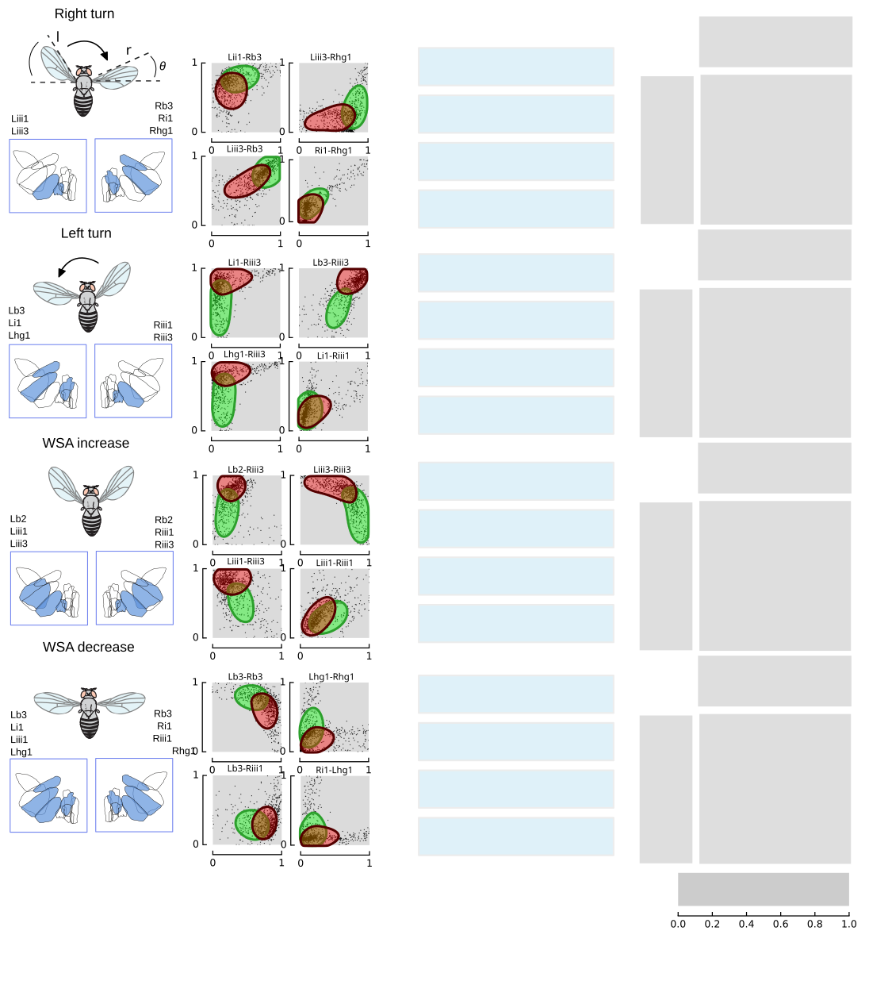

In [22]:
#lpf.make_scatter_plots(flylist[6])#,layout.axes_groups)

#layout = fifi.FigureLayout('layouts/scatter_anc_contour_layout.svg',make_mplfigures = True)
layout = fifi.FigureLayout('layouts/paper_figure_4_v5.svg',make_mplfigures = True)




c_l = layout.pathspecs['lb-nu'].mplkwargs()['edgecolor']
c_r = layout.pathspecs['rb-nu'].mplkwargs()['edgecolor']


#make_scatter_plots(flylist[6],layout.axes_groups['none']['scatter_mtrx'])



ax2 = layout.axes['Lb3_Rb3']
scatter(flylist[6], ('Lb3'),('Rb3'), ax2)
#plot_sector(flylist,('left','b3'),('right','b3'),'nb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
ax2.set_xbound(0,1),ax2.set_ybound(0,1)#,ax2.set_xlabel('left b3',color = c_l),ax2.set_ylabel('right b3',color = c_r)
ax2.set_xticks([0,1])
ax2.set_yticks([0,1])


ax3 = layout.axes['Liii1_Rb3']
scatter(flylist[6], ('Liii1'),('Rb3'), ax3)
#plot_sector(flylist,('left','iii1'),('right','b3'),'nb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','iii1'),('right','b3'),'rb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','iii1'),('right','b3'),'lb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
ax3.set_xbound(0,1),ax3.set_ybound(0,1)#,ax3.set_xlabel('left b3',color = c_l),ax3.set_ylabel('right b3',color = c_r)
ax3.set_xticks([0,1])
ax3.set_yticks([0,1])

ax4 = layout.axes['Liii3_Rhg1']
scatter(flylist[6], ('Liii3'),('Rhg1'), ax4)
#plot_sector(flylist,('left','iii3'),('right','hg1'),'nb-nu',ax4,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','iii3'),('right','hg1'),'rb-nu',ax4,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','iii3'),('right','hg1'),'lb-nu',ax4,layout.pathspecs,mode = 'kde',contours = True)
ax4.set_xbound(0,1),ax4.set_ybound(0,1)#,ax4.set_xlabel('left b3',color = c_l),ax4.set_ylabel('right b3',color = c_r)
ax4.set_xticks([0,1])
ax4.set_yticks([0,1])

ax5 = layout.axes['Liii3_Rb3']
scatter(flylist[6], ('Liii3'),('Rb3'), ax5)
#plot_sector(flylist,('left','iii3'),('right','b3'),'nb-nu',ax5,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','iii3'),('right','b3'),'rb-nu',ax5,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','iii3'),('right','b3'),'lb-nu',ax5,layout.pathspecs,mode = 'kde',contours = True)
ax5.set_xbound(0,1),ax5.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax5.set_ylabel('right b3',color = c_r)
ax5.set_xticks([0,1])
ax5.set_yticks([0,1])

ax6 = layout.axes['Ri1_Rhg1']
scatter(flylist[6], ('Ri1'),('Rhg1'), ax6)
#plot_sector(flylist,('right','i1'),('right','hg1'),'nb-nu',ax6,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('right','i1'),('right','hg1'),'rb-nu',ax6,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('right','i1'),('right','hg1'),'lb-nu',ax6,layout.pathspecs,mode = 'kde',contours = True)
ax6.set_xbound(0,1),ax5.set_ybound(0,1)#,ax6.set_xlabel('left b3',color = c_l),ax6.set_ylabel('right b3',color = c_r)
ax6.set_xticks([0,1])
ax6.set_yticks([0,1])

ax7 = layout.axes['Li1_Riii3']
scatter(flylist[6], ('Li1'),('Riii3'), ax7)
#plot_sector(flylist,('left','i1'),('right','iii3'),'nb-nu',ax7,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','i1'),('right','iii3'),'rb-nu',ax7,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','i1'),('right','iii3'),'lb-nu',ax7,layout.pathspecs,mode = 'kde',contours = True)
ax7.set_xbound(0,1),ax7.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax7.set_xticks([0,1])
ax7.set_yticks([0,1])

ax8 = layout.axes['Lb3_Riii3']
scatter(flylist[6], ('Lb3'),('Riii3'), ax8)
#plot_sector(flylist,('left','b3'),('right','iii3'),'nb-nu',ax8,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','b3'),('right','iii3'),'rb-nu',ax8,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','b3'),('right','iii3'),'lb-nu',ax8,layout.pathspecs,mode = 'kde',contours = True)
ax8.set_xbound(0,1),ax8.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax8.set_xticks([0,1])
ax8.set_yticks([0,1])


ax9 = layout.axes['Lhg1_Riii3']
scatter(flylist[6], ('Lhg1'),('Riii3'), ax9)
#plot_sector(flylist,('left','hg1'),('right','iii3'),'nb-nu',ax9,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','hg1'),('right','iii3'),'rb-nu',ax9,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','hg1'),('right','iii3'),'lb-nu',ax9,layout.pathspecs,mode = 'kde',contours = True)
ax9.set_xbound(0,1),ax9.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax9.set_xticks([0,1])
ax9.set_yticks([0,1])

ax10 = layout.axes['Li1_Riii1']
scatter(flylist[6], ('Li1'),('Riii1'), ax10)
#plot_sector(flylist,('right','i1'),('right','iii1'),'nb-nu',ax10,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','i1'),('right','iii1'),'rb-nu',ax10,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','i1'),('right','iii1'),'lb-nu',ax10,layout.pathspecs,mode = 'kde',contours = True)
ax10.set_xbound(0,1),ax10.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax10.set_xticks([0,1])
ax10.set_yticks([0,1])


ax11 = layout.axes['Lb2_Riii3']
scatter(flylist[6], ('Lb2'),('Riii3'), ax11)
#plot_sector(flylist,('left','b2'),('right','iii3'),'nb-nu',ax11,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','b2'),('right','iii3'),'rb-nu',ax11,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','b2'),('right','iii3'),'lb-nu',ax11,layout.pathspecs,mode = 'kde',contours = True)
ax11.set_xbound(0,1),ax11.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax11.set_xticks([0,1])
ax11.set_yticks([0,1])

ax12 = layout.axes['Liii3_Riii3']
scatter(flylist[6], ('Liii3'),('Riii3'), ax12)
#plot_sector(flylist,('left','iii3'),('right','iii3'),'nb-nu',ax12,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','iii3'),('right','iii3'),'rb-nu',ax12,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','iii3'),('right','iii3'),'lb-nu',ax12,layout.pathspecs,mode = 'kde',contours = True)
ax12.set_xbound(0,1),ax12.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax12.set_xticks([0,1])
ax12.set_yticks([0,1])

ax13 = layout.axes['Liii1_Riii3']
scatter(flylist[6], ('Liii1'),('Riii3'), ax13)
#plot_sector(flylist,('left','iii1'),('right','iii3'),'nb-nu',ax13,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','iii1'),('right','iii3'),'rb-nu',ax13,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','iii1'),('right','iii3'),'lb-nu',ax13,layout.pathspecs,mode = 'kde',contours = True)
ax13.set_xbound(0,1),ax13.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax13.set_xticks([0,1])
ax13.set_yticks([0,1])

ax14 = layout.axes['Liii1_Riii1']
scatter(flylist[6], ('Liii1'),('Riii1'), ax14)
#plot_sector(flylist,('left','iii1'),('right','iii1'),'nb-nu',ax14,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','iii1'),('right','iii1'),'rb-nu',ax14,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','iii1'),('right','iii1'),'lb-nu',ax14,layout.pathspecs,mode = 'kde',contours = True)
ax14.set_xbound(0,1),ax14.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax14.set_xticks([0,1])
ax14.set_yticks([0,1])


ax15 = layout.axes['Lhg1_Rhg1']
scatter(flylist[6], ('Lhg1'),('Rhg1'), ax15)
#plot_sector(flylist,('left','hg1'),('right','hg1'),'nb-nu',ax15,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','hg1'),('right','hg1'),'rb-nu',ax15,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','hg1'),('right','hg1'),'lb-nu',ax15,layout.pathspecs,mode = 'kde',contours = True)
ax15.set_xbound(0,1),ax15.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax15.set_xticks([0,1])
ax15.set_yticks([0,1])

ax16 = layout.axes['Lb3_Riii1']
scatter(flylist[6], ('Lb3'),('Riii1'), ax16)
#plot_sector(flylist,('left','b3'),('right','iii1'),'nb-nu',ax16,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','b3'),('right','iii1'),'rb-nu',ax16,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','b3'),('right','iii1'),'lb-nu',ax16,layout.pathspecs,mode = 'kde',contours = True)
ax16.set_xbound(0,1),ax16.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax16.set_xticks([0,1])
ax16.set_yticks([0,1])

ax17 = layout.axes['Lhg1_Ri1']
scatter(flylist[6], ('Lhg1'),('Ri1'), ax17)
#plot_sector(flylist,('left','hg1'),('right','i1'),'nb-nu',ax17,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','hg1'),('right','i1'),'rb-nu',ax17,layout.pathspecs,mode = 'kde',contours = True)
plot_sector(flylist,('left','hg1'),('right','i1'),'lb-nu',ax17,layout.pathspecs,mode = 'kde',contours = True)
ax17.set_xbound(0,1),ax17.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
ax17.set_xticks([0,1])
ax17.set_yticks([0,1])




#ax18 = layout.axes['Lhg1_Ri1']
#scatter(flylist[6], ('Lhg1'),('Ri1'), ax18)
#plot_sector(flylist,('left','hg1'),('right','i1'),'nb-nu',ax17,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'rb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','b3'),'lb-nu',ax2,layout.pathspecs,mode = 'kde',contours = True)
#ax17.set_xbound(0,1),ax18.set_ybound(0,1)#,ax5.set_xlabel('left b3',color = c_l),ax7.set_ylabel('right b3',color = c_r)
#ax17.set_xticks([0,1])
#ax17.set_yticks([0,1])






'''
ax3 = layout.axes_groups['none']['expanded_inset']['Liii3_Riii3']
plot_sector(flylist,('left','iii3'),('right','iii3'),'nb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','iii3'),('right','iii3'),'rb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','iii3'),('right','iii3'),'lb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
ax3.set_xbound(0,1),ax3.set_ybound(0,1),ax3.set_xlabel('left iii3',color = c_l),ax3.set_ylabel('right iii3',color = c_r)

ax4 = layout.axes_groups['none']['expanded_inset']['Lb3_Riii3']
plot_sector(flylist,('left','b3'),('right','iii3'),'nb-nu',ax4,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','iii3'),'rb-nu',ax4,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','b3'),('right','iii3'),'lb-nu',ax4,layout.pathspecs,mode = 'kde',contours = True)
ax4.set_xbound(0,1),ax4.set_ybound(0,1),ax4.set_xlabel('left b3',color = c_l),ax4.set_ylabel('right iii3',color = c_r)

ax5 = layout.axes_groups['none']['expanded_inset']['Ri1_Lhg1']
plot_sector(flylist,('left','hg1'),('right','i1'),'nb-nu',ax5,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','hg1'),('right','i1'),'rb-nu',ax5,layout.pathspecs,mode = 'kde',contours = True)
#plot_sector(flylist,('left','hg1'),('right','i1'),'lb-nu',ax5,layout.pathspecs,mode = 'kde',contours = True)
ax5.set_xbound(0,1),ax5.set_ybound(0,1),ax5.set_xlabel('left hg1',color = c_l),ax5.set_ylabel('right i1',color = c_r)
'''

fifi.mpl_functions.set_spines(layout)
layout.save('figure_05_v2.svg')
plt.close('all')
display(SVG('figure_05_v2.svg'))

In [22]:
#Normalized Data
#normalized = (x-min(x))/(max(x)-min(x))

def normd (muscle_data):
    x = muscle_data
    normalized = (x-min(x))/(max(x)-min(x))
    return normalized

In [ ]:
print(2)

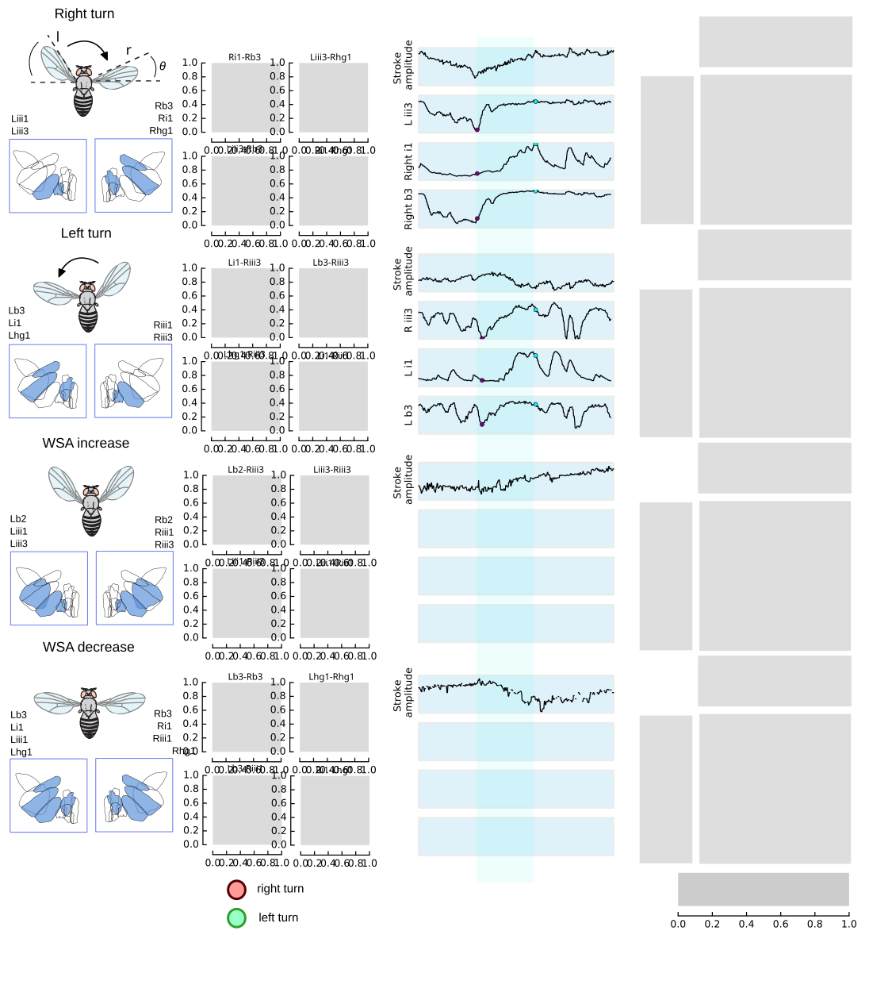

In [22]:
### now do saccade portion to be incorporated in later




from matplotlib.animation import FuncAnimation

import figurefirst as fifi

#layout = fifi.FigureLayout('paper_figure_1_v2.svg',make_mplfigures = True)
layout = fifi.FigureLayout('layouts/paper_figure_4_v5.svg',make_mplfigures = True)

#layout.axes['yaw_left'].plot(time, mean_WBA) #,'o',alpha = 0.2)
#layout.axes['yaw_left'].fill_between(time, (mean_WBA-error), (mean_WBA + error),alpha = 0.1)

#layout.axes['yaw_right'].plot(time, mean_WBA_turn_right) #,'o',alpha = 0.2)
#layout.axes['yaw_right'].fill_between(time, (mean_WBA_turn_right-error_turn_right), (mean_WBA_turn_right + error_turn_right),alpha = 0.1)


fly = flylist[6]
snum = 1  #5

#l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]


times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


###check normed signals method 


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]

'''
layout.axes['l_wsa'].plot(times,l_deg,clip_on = False,color = 'k')
layout.axes['l_wsa'].set_xbound(0,times[-1])
layout.axes['l_wsa'].set_ylabel('left \n amplitude')
layout.axes['l_wsa'].patch.set_alpha(0.0)
layout.axes['l_wsa'].set_ybound(20,40)
layout.axes['l_wsa'].set_yticks([20, 30, 40])
#layout.axes['l_wsa'].set_ybound(-15,15)
#layout.axes['l_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)

layout.axes['r_wsa'].plot(times,r_deg,clip_on = False,color = 'k')
layout.axes['r_wsa'].set_xbound(0,times[-1])
layout.axes['r_wsa'].set_ylabel('right \n amplitude')
layout.axes['r_wsa'].patch.set_alpha(0.0)
layout.axes['r_wsa'].set_ybound(20,40)
layout.axes['r_wsa'].set_yticks([20, 30, 40])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)

'''

layout.axes['lmr_rt'].plot(times,lmr,clip_on = False,color = 'k')
layout.axes['lmr_rt'].set_xbound(0,times[-1])
layout.axes['lmr_rt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_rt'].patch.set_alpha(0.0)
layout.axes['lmr_rt'].set_ybound(-20,20)
layout.axes['lmr_rt'].set_yticks([-15, 0, 15])

layout.axes['liii1_rt'].plot(times,iii3l,clip_on = False,color = 'k')
layout.axes['liii1_rt'].set_xbound(0,times[-1])
layout.axes['liii1_rt'].set_ylabel('L iii3')
layout.axes['liii1_rt'].plot(times[120],iii3l[120],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
#layout.axes['liii1_rt'].plot(times[120],iii3l[120],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].plot(times[240],iii3l[240],'cyan', marker='o', markersize=4)#, 'o') 



layout.axes['ri1_rt'].plot(times,i1r,clip_on = False,color = 'k')
layout.axes['ri1_rt'].set_xbound(0,times[-1])
layout.axes['ri1_rt'].set_ylabel('Right i1')
layout.axes['ri1_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['ri1_rt'].plot(times[120],i1r[120],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['ri1_rt'].plot(times[240],i1r[240],'cyan', marker='o', markersize=4)#, 'o') 



layout.axes['rb3_rt'].plot(times,b3r,clip_on = False,color = 'k')
layout.axes['rb3_rt'].set_xbound(0,times[-1])
layout.axes['rb3_rt'].set_ylabel('Right b3')
layout.axes['rb3_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['rb3_rt'].plot(times[120],b3r[120],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['rb3_rt'].plot(times[240],b3r[240],'cyan', marker='o', markersize=4)#, 'o') 



#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)


##write the clips out here and use the derivative to get the signals 



## plot each segment

#---------------------------------------------------------------------------------------


fly = flylist[6]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]



layout.axes['lmr_lt'].plot(times,lmr,clip_on = False,color = 'k')
layout.axes['lmr_lt'].set_xbound(0,times[-1])
layout.axes['lmr_lt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_lt'].patch.set_alpha(0.0)
layout.axes['lmr_lt'].set_ybound(-20,20)
layout.axes['lmr_lt'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)


layout.axes['riii3_lt'].plot(times,iii3r,clip_on = False,color = 'k')
layout.axes['riii3_lt'].set_xbound(0,times[-1])
layout.axes['riii3_lt'].set_ylabel('R iii3')
layout.axes['riii3_lt'].patch.set_alpha(0.0)
layout.axes['riii3_lt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['riii3_lt'].plot(times[130],iii3r[130],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['riii3_lt'].plot(times[240],iii3r[240],'cyan', marker='o', markersize=4)#, 'o') 


layout.axes['li1_lt'].plot(times,i1l,clip_on = False,color = 'k')
layout.axes['li1_lt'].set_xbound(0,times[-1])
layout.axes['li1_lt'].set_ylabel('L i1')
layout.axes['li1_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['li1_lt'].plot(times[130],i1l[130],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['li1_lt'].plot(times[240],i1l[240],'cyan', marker='o', markersize=4)#, 'o') 

layout.axes['lb3_lt'].plot(times,b3l,clip_on = False,color = 'k')
layout.axes['lb3_lt'].set_xbound(0,times[-1])
layout.axes['lb3_lt'].set_ylabel('L b3')
layout.axes['lb3_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lb3_lt'].plot(times[130],b3l[130],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_lt'].plot(times[240],b3l[240],'cyan', marker='o', markersize=4)#, 'o') 






#---------------------------------------------------------------------------------------




fly = flylist[3]
snum = 1  #5


l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]


times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)

layout.axes['lpr_WSAi'].plot(times,lpr,clip_on = False,color = 'k')
layout.axes['lpr_WSAi'].set_xbound(0,times[-1])
layout.axes['lpr_WSAi'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAi'].patch.set_alpha(0.0)
#layout.axes['lpr_WSAi'].set_ybound(-20,20)
#layout.axes['lpr_WSAi'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)



#---------------------------------------------------------------------------------------

fly = flylist[1]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)



layout.axes['lpr_WSAd'].plot(times,lpr,clip_on = False,color = 'k')
layout.axes['lpr_WSAd'].set_xbound(0,times[-1])
layout.axes['lpr_WSAd'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAd'].patch.set_alpha(0.0)
#layout.axes['lpr_WSAd'].set_ybound(-20,20)
#layout.axes['lpr_WSAd'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)




fifi.mpl_functions.set_spines(layout)
layout.save('figure_05_v3.svg')
plt.close('all')
display(SVG('figure_05_v3.svg'))



### cool color scheme 


In [23]:
len(times)

395

In [47]:
times[394]

7.8799999999999999

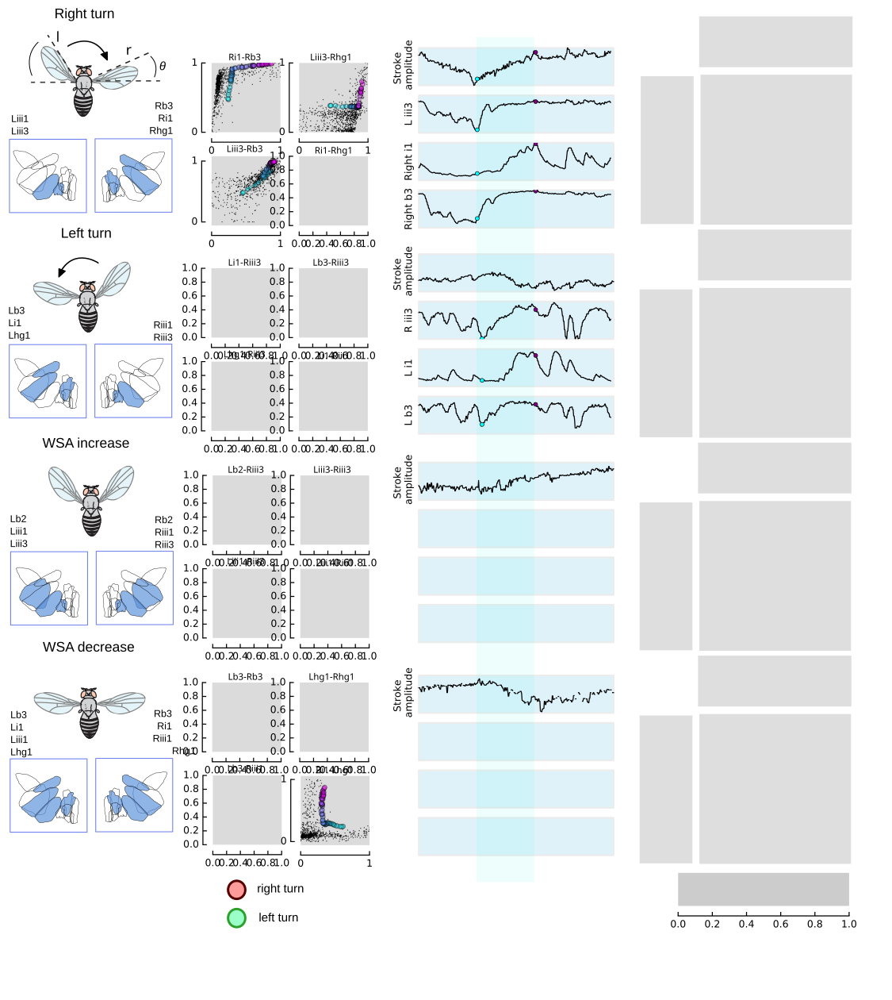

In [121]:
### now do saccade portion to be incorporated in later




from matplotlib.animation import FuncAnimation

import figurefirst as fifi

#layout = fifi.FigureLayout('paper_figure_1_v2.svg',make_mplfigures = True)
layout = fifi.FigureLayout('layouts/paper_figure_4_v5.svg',make_mplfigures = True)

#layout.axes['yaw_left'].plot(time, mean_WBA) #,'o',alpha = 0.2)
#layout.axes['yaw_left'].fill_between(time, (mean_WBA-error), (mean_WBA + error),alpha = 0.1)

#layout.axes['yaw_right'].plot(time, mean_WBA_turn_right) #,'o',alpha = 0.2)
#layout.axes['yaw_right'].fill_between(time, (mean_WBA_turn_right-error_turn_right), (mean_WBA_turn_right + error_turn_right),alpha = 0.1)

import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np; np.random.seed(0)
import pandas as pd






fly = flylist[6]
snum = 1  #5

#l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]


times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


###check normed signals method 


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]

'''
layout.axes['l_wsa'].plot(times,l_deg,clip_on = False,color = 'k')
layout.axes['l_wsa'].set_xbound(0,times[-1])
layout.axes['l_wsa'].set_ylabel('left \n amplitude')
layout.axes['l_wsa'].patch.set_alpha(0.0)
layout.axes['l_wsa'].set_ybound(20,40)
layout.axes['l_wsa'].set_yticks([20, 30, 40])
#layout.axes['l_wsa'].set_ybound(-15,15)
#layout.axes['l_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)

layout.axes['r_wsa'].plot(times,r_deg,clip_on = False,color = 'k')
layout.axes['r_wsa'].set_xbound(0,times[-1])
layout.axes['r_wsa'].set_ylabel('right \n amplitude')
layout.axes['r_wsa'].patch.set_alpha(0.0)
layout.axes['r_wsa'].set_ybound(20,40)
layout.axes['r_wsa'].set_yticks([20, 30, 40])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)

'''

layout.axes['lmr_rt'].plot(times,lmr,clip_on = False,color = 'k')
layout.axes['lmr_rt'].set_xbound(0,times[-1])
layout.axes['lmr_rt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_rt'].patch.set_alpha(0.0)
layout.axes['lmr_rt'].set_ybound(-20,20)
layout.axes['lmr_rt'].set_yticks([-15, 0, 15])
layout.axes['lmr_rt'].plot(times[120],lmr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lmr_rt'].plot(times[240],lmr[240],'purple', marker='o', markersize=4)#, 'o') 



layout.axes['liii1_rt'].plot(times,iii3l,clip_on = False,color = 'k')
layout.axes['liii1_rt'].set_xbound(0,times[-1])
layout.axes['liii1_rt'].set_ylabel('L iii3')
layout.axes['liii1_rt'].plot(times[120],iii3l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
#layout.axes['liii1_rt'].plot(times[120],iii3l[120],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].plot(times[240],iii3l[240],'purple', marker='o', markersize=4)#, 'o') 

#x = list(pitch_down_new_df['muscles'])
c_r = times[120:240]
Min = times[119]
Max = times[241]             
x = i1r[120:240]
y = b3r[120:240]
df= pd.DataFrame({"x":x,"y":y,"c":c_r})
cmap = plt.cm.cool
norm = matplotlib.colors.Normalize(vmin=Min, vmax=Max)

ax1 = layout.axes['Liii1_Rb3']
scatter(flylist[6], ('Ri1'),('Rb3'), ax1)
c = ax1.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
#plot_sector(flylist,('left','iii1'),('right','b3'),'nb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
########layout.axes['Liii1_Rb3'].plot(df.x, df.y, color=cmap(norm(df.c.values)), marker = 'o', markersize=2)
#plot_sector(flylist,('left','iii1'),('right','b3'),'lb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
layout.axes['Liii1_Rb3'].set_xbound(0,1),layout.axes['Liii1_Rb3'].set_ybound(0,1)#,ax3.set_xlabel('left b3',color = c_l),ax3.set_ylabel('right b3',color = c_r)
layout.axes['Liii1_Rb3'].set_xticks([0,1])
layout.axes['Liii1_Rb3'].set_yticks([0,1])                

x = iii3l[120:240]
y = hg1r[120:240]
ax2 = layout.axes['Liii3_Rhg1']
scatter(flylist[6], ('Liii3'),('Rhg1'), ax2)
c = ax2.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax2.set_xbound(0,1),ax2.set_ybound(0,1)
ax2.set_xticks([0,1])
ax2.set_yticks([0,1])                
                
x = iii3l[120:240]
y = b3r[120:240]
ax3 = layout.axes['Liii3_Rb3']
scatter(flylist[6], ('Liii3'),('Rb3'), ax3)
c = ax3.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax3.set_xbound(0,1),ax2.set_ybound(0,1)
ax3.set_xticks([0,1])
ax3.set_yticks([0,1])  


x = hg1l[120:240]
y = i1r[120:240]
ax4 = layout.axes['Lhg1_Ri1']
scatter(flylist[6], ('Lhg1'),('Ri1'), ax4)
c = ax4.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax4.set_xbound(0,1),ax2.set_ybound(0,1)
ax4.set_xticks([0,1])
ax4.set_yticks([0,1])  



            

layout.axes['ri1_rt'].plot(times,i1r,clip_on = False,color = 'k')
layout.axes['ri1_rt'].set_xbound(0,times[-1])
layout.axes['ri1_rt'].set_ylabel('Right i1')
layout.axes['ri1_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['ri1_rt'].plot(times[120],i1r[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['ri1_rt'].plot(times[240],i1r[240],'purple', marker='o', markersize=4)#, 'o') 



layout.axes['rb3_rt'].plot(times,b3r,clip_on = False,color = 'k')
layout.axes['rb3_rt'].set_xbound(0,times[-1])
layout.axes['rb3_rt'].set_ylabel('Right b3')
layout.axes['rb3_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['rb3_rt'].plot(times[120],b3r[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['rb3_rt'].plot(times[240],b3r[240],'purple', marker='o', markersize=4)#, 'o') 



#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)


##write the clips out here and use the derivative to get the signals 



## plot each segment




fly = flylist[6]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]



layout.axes['lmr_lt'].plot(times,lmr,clip_on = False,color = 'k')
layout.axes['lmr_lt'].set_xbound(0,times[-1])
layout.axes['lmr_lt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_lt'].patch.set_alpha(0.0)
layout.axes['lmr_lt'].set_ybound(-20,20)
layout.axes['lmr_lt'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)


layout.axes['riii3_lt'].plot(times,iii3r,clip_on = False,color = 'k')
layout.axes['riii3_lt'].set_xbound(0,times[-1])
layout.axes['riii3_lt'].set_ylabel('R iii3')
layout.axes['riii3_lt'].patch.set_alpha(0.0)
layout.axes['riii3_lt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['riii3_lt'].plot(times[130],iii3r[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['riii3_lt'].plot(times[240],iii3r[240],'purple', marker='o', markersize=4)#, 'o') 


layout.axes['li1_lt'].plot(times,i1l,clip_on = False,color = 'k')
layout.axes['li1_lt'].set_xbound(0,times[-1])
layout.axes['li1_lt'].set_ylabel('L i1')
layout.axes['li1_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['li1_lt'].plot(times[130],i1l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['li1_lt'].plot(times[240],i1l[240],'purple', marker='o', markersize=4)#, 'o') 

layout.axes['lb3_lt'].plot(times,b3l,clip_on = False,color = 'k')
layout.axes['lb3_lt'].set_xbound(0,times[-1])
layout.axes['lb3_lt'].set_ylabel('L b3')
layout.axes['lb3_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lb3_lt'].plot(times[130],b3l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_lt'].plot(times[240],b3l[240],'purple', marker='o', markersize=4)#, 'o') 











fly = flylist[3]
snum = 1  #5


l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]


times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)

layout.axes['lpr_WSAi'].plot(times,lpr,clip_on = False,color = 'k')
layout.axes['lpr_WSAi'].set_xbound(0,times[-1])
layout.axes['lpr_WSAi'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAi'].patch.set_alpha(0.0)
#layout.axes['lpr_WSAi'].set_ybound(-20,20)
#layout.axes['lpr_WSAi'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)



fly = flylist[1]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)



layout.axes['lpr_WSAd'].plot(times,lpr,clip_on = False,color = 'k')
layout.axes['lpr_WSAd'].set_xbound(0,times[-1])
layout.axes['lpr_WSAd'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAd'].patch.set_alpha(0.0)
#layout.axes['lpr_WSAd'].set_ybound(-20,20)
#layout.axes['lpr_WSAd'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)




fifi.mpl_functions.set_spines(layout)
layout.save('figure_05_v4.svg')
plt.close('all')
display(SVG('figure_05_v4.svg'))





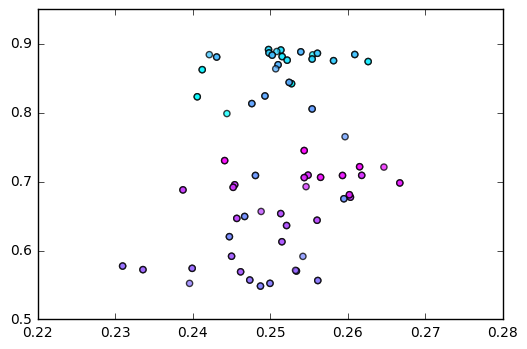

In [108]:
### cool color scheme 

import numpy as np
import matplotlib.pyplot as plt


x = iii1l[120:240]
y = b3r[120:240]
colors = times[120:240]
fig = plt.figure()
ax = fig.add_subplot(111)
c = ax.scatter(x, y, c=colors, cmap='cool', alpha=0.75)


'''
c_r = times[120:240]
Min = times[119]
Max = times[241]             
x = iii1l[120:240]
y = b3r[120:240]

df= pd.DataFrame({"x":x,"y":y,"c":c_r})
cmap = plt.cm.cool
norm = matplotlib.colors.Normalize(vmin=Min, vmax=Max)

print(len(x))

print(len(y))

print(len(c_r))

'''


#plt.plot(df.x, df.y, color=cmap(norm(df.c.values)), marker = 'o', markersize=2)
plt.show()

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:28: RuntimeWarning: invalid value encountered in power


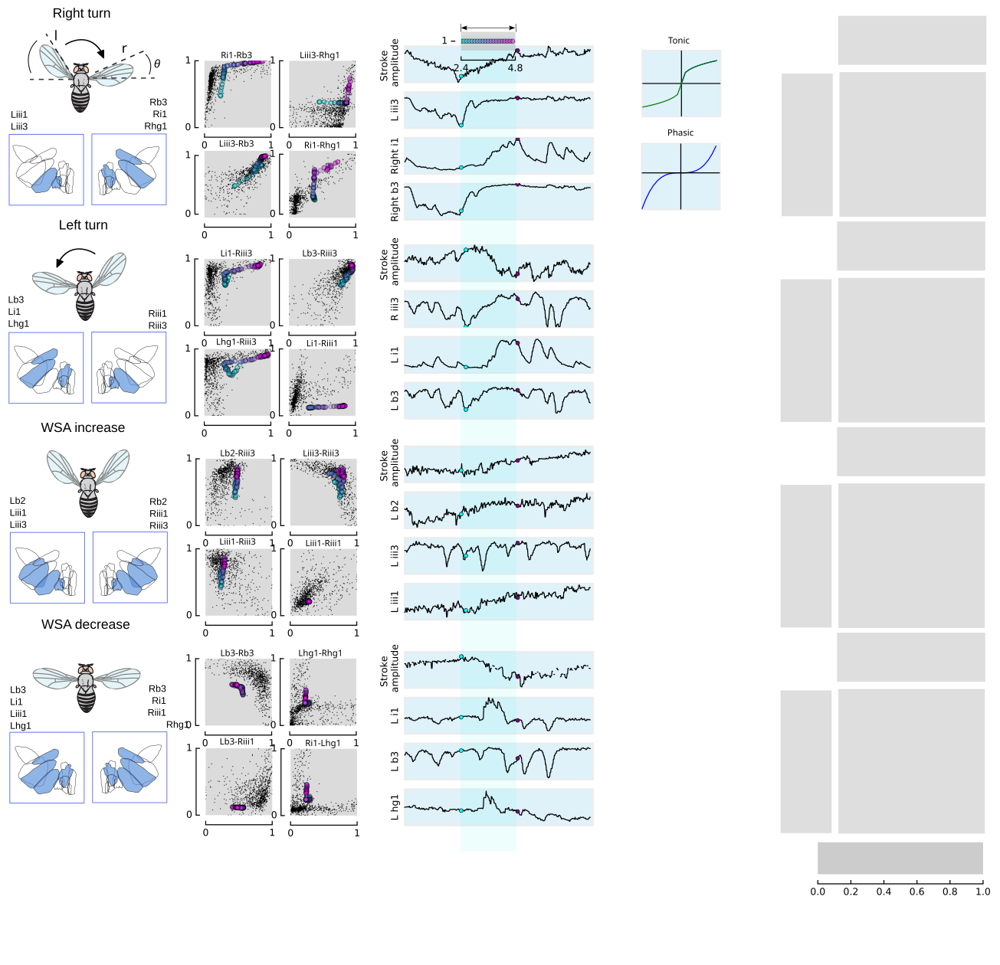

In [64]:
### now do saccade portion to be incorporated in later




from matplotlib.animation import FuncAnimation

import figurefirst as fifi

#layout = fifi.FigureLayout('paper_figure_1_v2.svg',make_mplfigures = True)
layout = fifi.FigureLayout('layouts/paper_figure_4_v6.svg',make_mplfigures = True)

#layout.axes['yaw_left'].plot(time, mean_WBA) #,'o',alpha = 0.2)
#layout.axes['yaw_left'].fill_between(time, (mean_WBA-error), (mean_WBA + error),alpha = 0.1)

#layout.axes['yaw_right'].plot(time, mean_WBA_turn_right) #,'o',alpha = 0.2)
#layout.axes['yaw_right'].fill_between(time, (mean_WBA_turn_right-error_turn_right), (mean_WBA_turn_right + error_turn_right),alpha = 0.1)

import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np; np.random.seed(0)
import pandas as pd



x = np.arange(-10,10)
layout.axes['phasic'].plot(x, x**3)
layout.axes['tonic'].plot(x, x** (1. / 3))
layout.axes['phasic'].set_xbound(-10, 10)
layout.axes['tonic'].set_xbound(-10, 10)
layout.axes['tonic'].axhline(y=0, color='k')
layout.axes['tonic'].axvline(x=0, color='k')
layout.axes['phasic'].axhline(y=0, color='k')
layout.axes['phasic'].axvline(x=0, color='k')
#layout.axes['phasic'].set_ybound(-10, 10)
layout.axes['tonic'].set_ybound([-3, 3])
layout.axes['tonic'].plot(x, np.cbrt(x))




fly = flylist[6]
snum = 1  #5

#l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]

times = np.arange(len(x))*0.02
colors = times[120:240]


x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


###check normed signals method 


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]

'''
layout.axes['l_wsa'].plot(times,l_deg,clip_on = False,color = 'k')
layout.axes['l_wsa'].set_xbound(0,times[-1])
layout.axes['l_wsa'].set_ylabel('left \n amplitude')
layout.axes['l_wsa'].patch.set_alpha(0.0)
layout.axes['l_wsa'].set_ybound(20,40)
layout.axes['l_wsa'].set_yticks([20, 30, 40])
#layout.axes['l_wsa'].set_ybound(-15,15)
#layout.axes['l_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)

layout.axes['r_wsa'].plot(times,r_deg,clip_on = False,color = 'k')
layout.axes['r_wsa'].set_xbound(0,times[-1])
layout.axes['r_wsa'].set_ylabel('right \n amplitude')
layout.axes['r_wsa'].patch.set_alpha(0.0)
layout.axes['r_wsa'].set_ybound(20,40)
layout.axes['r_wsa'].set_yticks([20, 30, 40])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)

'''

layout.axes['lmr_rt'].plot(times,lmr,clip_on = False,color = 'k')
layout.axes['lmr_rt'].set_xbound(0,times[-1])
layout.axes['lmr_rt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_rt'].patch.set_alpha(0.0)
layout.axes['lmr_rt'].set_ybound(-20,20)
layout.axes['lmr_rt'].set_yticks([-15, 0, 15])
layout.axes['lmr_rt'].plot(times[120],lmr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lmr_rt'].plot(times[240],lmr[240],'purple', marker='o', markersize=4)#, 'o') 
#ax17.set_xbound(times[120],times[240]),ax17.set_ybound(0.8,1.2)
layout.axes['lmr_rt'].set_xticks([times[120],times[240]])


layout.axes['liii1_rt'].plot(times,iii3l,clip_on = False,color = 'k')
layout.axes['liii1_rt'].set_xbound(0,times[-1])
layout.axes['liii1_rt'].set_ylabel('L iii3')
layout.axes['liii1_rt'].plot(times[120],iii3l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
#layout.axes['liii1_rt'].plot(times[120],iii3l[120],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].plot(times[240],iii3l[240],'purple', marker='o', markersize=4)#, 'o') 

#x = list(pitch_down_new_df['muscles'])
c_r = times[120:240]
Min = times[119]
Max = times[241]             
x = i1r[120:240]
y = b3r[120:240]
df= pd.DataFrame({"x":x,"y":y,"c":c_r})
cmap = plt.cm.cool
norm = matplotlib.colors.Normalize(vmin=Min, vmax=Max)

ax1 = layout.axes['Liii1_Rb3']
scatter(flylist[6], ('Ri1'),('Rb3'), ax1)
c = ax1.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
#plot_sector(flylist,('left','iii1'),('right','b3'),'nb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
########layout.axes['Liii1_Rb3'].plot(df.x, df.y, color=cmap(norm(df.c.values)), marker = 'o', markersize=2)
#plot_sector(flylist,('left','iii1'),('right','b3'),'lb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
layout.axes['Liii1_Rb3'].set_xbound(0,1),layout.axes['Liii1_Rb3'].set_ybound(0,1)#,ax3.set_xlabel('left b3',color = c_l),ax3.set_ylabel('right b3',color = c_r)
layout.axes['Liii1_Rb3'].set_xticks([0,1])
layout.axes['Liii1_Rb3'].set_yticks([0,1])                

x = iii3l[120:240]
y = hg1r[120:240]
ax2 = layout.axes['Liii3_Rhg1']
scatter(flylist[6], ('Liii3'),('Rhg1'), ax2)
c = ax2.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax2.set_xbound(0,1),ax2.set_ybound(0,1)
ax2.set_xticks([0,1])
ax2.set_yticks([0,1])                
                
x = iii3l[120:240]
y = b3r[120:240]
ax3 = layout.axes['Liii3_Rb3']
scatter(flylist[6], ('Liii3'),('Rb3'), ax3)
c = ax3.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax3.set_xbound(0,1),ax2.set_ybound(0,1)
ax3.set_xticks([0,1])
ax3.set_yticks([0,1])  


x = hg1r[120:240]
y = i1r[120:240]
ax4 = layout.axes['Ri1_Rhg1']
scatter(flylist[6], ('Ri1'),('Rhg1'), ax4)
c = ax4.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax4.set_xbound(0,1),ax2.set_ybound(0,1)
ax4.set_xticks([0,1])
ax4.set_yticks([0,1])  



            

layout.axes['ri1_rt'].plot(times,i1r,clip_on = False,color = 'k')
layout.axes['ri1_rt'].set_xbound(0,times[-1])
layout.axes['ri1_rt'].set_ylabel('Right i1')
layout.axes['ri1_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['ri1_rt'].plot(times[120],i1r[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['ri1_rt'].plot(times[240],i1r[240],'purple', marker='o', markersize=4)#, 'o') 



layout.axes['rb3_rt'].plot(times,b3r,clip_on = False,color = 'k')
layout.axes['rb3_rt'].set_xbound(0,times[-1])
layout.axes['rb3_rt'].set_ylabel('Right b3')
layout.axes['rb3_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['rb3_rt'].plot(times[120],b3r[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['rb3_rt'].plot(times[240],b3r[240],'purple', marker='o', markersize=4)#, 'o') 



#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)


##write the clips out here and use the derivative to get the signals 



## plot each segment

#----------------------------------------------------------------------


fly = flylist[6]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]



layout.axes['lmr_lt'].plot(times,lmr,clip_on = False,color = 'k')
layout.axes['lmr_lt'].set_xbound(0,times[-1])
layout.axes['lmr_lt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_lt'].patch.set_alpha(0.0)
layout.axes['lmr_lt'].set_ybound(-20,20)
layout.axes['lmr_lt'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lmr_lt'].plot(times[130],lmr[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lmr_lt'].plot(times[240],lmr[240],'purple', marker='o', markersize=4)#, 'o') 


x = i1l[120:240]
y = iii3r[120:240]
ax5 = layout.axes['Li1_Riii3']
scatter(flylist[6], ('Li1'),('Riii3'), ax5)
c = ax5.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax5.set_xbound(0,1),ax5.set_ybound(0,1)
ax5.set_xticks([0,1])
ax5.set_yticks([0,1])                
                


x = b3l[120:240]
y = iii3r[120:240]
ax6 = layout.axes['Lb3_Riii3']
scatter(flylist[6], ('Lb3'),('Riii3'), ax6)
c = ax6.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax6.set_xbound(0,1),ax6.set_ybound(0,1)
ax6.set_xticks([0,1])
ax6.set_yticks([0,1])                
                               
                
x = hg1l[120:240]
y = iii3r[120:240]
ax7 = layout.axes['Lhg1_Riii3']
scatter(flylist[6], ('Lhg1'),('Riii3'), ax7)
c = ax7.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax7.set_xbound(0,1),ax7.set_ybound(0,1)
ax7.set_xticks([0,1])
ax7.set_yticks([0,1])  


x = i1l[120:240]
y = iii1r[120:240]
ax8 = layout.axes['Li1_Riii1']
scatter(flylist[6], ('Li1'),('Riii1'), ax8)
c = ax8.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax8.set_xbound(0,1),ax8.set_ybound(0,1)
ax8.set_xticks([0,1])
ax8.set_yticks([0,1])  



layout.axes['riii3_lt'].plot(times,iii3r,clip_on = False,color = 'k')
layout.axes['riii3_lt'].set_xbound(0,times[-1])
layout.axes['riii3_lt'].set_ylabel('R iii3')
layout.axes['riii3_lt'].patch.set_alpha(0.0)
layout.axes['riii3_lt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['riii3_lt'].plot(times[130],iii3r[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['riii3_lt'].plot(times[240],iii3r[240],'purple', marker='o', markersize=4)#, 'o') 


layout.axes['li1_lt'].plot(times,i1l,clip_on = False,color = 'k')
layout.axes['li1_lt'].set_xbound(0,times[-1])
layout.axes['li1_lt'].set_ylabel('L i1')
layout.axes['li1_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['li1_lt'].plot(times[130],i1l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['li1_lt'].plot(times[240],i1l[240],'purple', marker='o', markersize=4)#, 'o') 

layout.axes['lb3_lt'].plot(times,b3l,clip_on = False,color = 'k')
layout.axes['lb3_lt'].set_xbound(0,times[-1])
layout.axes['lb3_lt'].set_ylabel('L b3')
layout.axes['lb3_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lb3_lt'].plot(times[130],b3l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_lt'].plot(times[240],b3l[240],'purple', marker='o', markersize=4)#, 'o') 





#____________________________________________________________________





fly = flylist[3]
snum = 1  #5


l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]

times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)

layout.axes['lpr_WSAi'].plot(times,lpr,clip_on = False,color = 'k')
layout.axes['lpr_WSAi'].set_xbound(0,times[-1])
layout.axes['lpr_WSAi'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAi'].patch.set_alpha(0.0)
#layout.axes['lpr_WSAi'].set_ybound(-20,20)
#layout.axes['lpr_WSAi'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lpr_WSAi'].plot(times[120],lpr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lpr_WSAi'].plot(times[240],lpr[240],'purple', marker='o', markersize=4)#, 'o') 




x = b2l[120:240]
y = iii3r[120:240]
ax9 = layout.axes['Lb2_Riii3']
scatter(flylist[6], ('Lb2'),('Riii3'), ax9)
c = ax9.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax9.set_xbound(0,1),ax9.set_ybound(0,1)
ax9.set_xticks([0,1])
ax9.set_yticks([0,1])                
                


x = iii3l[120:240]
y = iii3r[120:240]
ax10 = layout.axes['Liii3_Riii3']
scatter(flylist[6], ('Liii3'),('Riii3'), ax10)
c = ax10.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax10.set_xbound(0,1),ax10.set_ybound(0,1)
ax10.set_xticks([0,1])
ax10.set_yticks([0,1])                
                               
                
x = iii1l[120:240]
y = iii3r[120:240]
ax11 = layout.axes['Liii1_Riii3']
scatter(flylist[6], ('Liii1'),('Riii3'), ax11)
c = ax11.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax11.set_xbound(0,1),ax11.set_ybound(0,1)
ax11.set_xticks([0,1])
ax11.set_yticks([0,1])  


x = iii1l[120:240]
y = iii1r[120:240]
ax12 = layout.axes['Liii1_Riii1']
scatter(flylist[6], ('Liii1'),('Riii1'), ax12)
c = ax12.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax12.set_xbound(0,1),ax12.set_ybound(0,1)
ax12.set_xticks([0,1])
ax12.set_yticks([0,1])  



layout.axes['lb2_WSAi'].plot(times,b2l,clip_on = False,color = 'k')
layout.axes['lb2_WSAi'].set_xbound(0,times[-1])
layout.axes['lb2_WSAi'].set_ylabel('L b2')
layout.axes['lb2_WSAi'].patch.set_alpha(0.0)
layout.axes['lb2_WSAi'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['lb2_WSAi'].plot(times[120],b2l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb2_WSAi'].plot(times[240],b2l[240],'purple', marker='o', markersize=4)#, 'o') 


layout.axes['liii3_WSAi'].plot(times,iii3l,clip_on = False,color = 'k')
layout.axes['liii3_WSAi'].set_xbound(0,times[-1])
layout.axes['liii3_WSAi'].set_ylabel('L iii3')
layout.axes['liii3_WSAi'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['liii3_WSAi'].plot(times[130],iii3l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii3_WSAi'].plot(times[240],iii3l[240],'purple', marker='o', markersize=4)#, 'o') 

layout.axes['liii1_WSAi'].plot(times,iii1l,clip_on = False,color = 'k')
layout.axes['liii1_WSAi'].set_xbound(0,times[-1])
layout.axes['liii1_WSAi'].set_ylabel('L iii1')
layout.axes['liii1_WSAi'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['liii1_WSAi'].plot(times[130],iii1l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_WSAi'].plot(times[240],iii1l[240],'purple', marker='o', markersize=4)#, 'o') 









#____________________________________________________________________________

fly = flylist[1]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)

b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]


layout.axes['lpr_WSAd'].plot(times,lpr,clip_on = False,color = 'k')
layout.axes['lpr_WSAd'].set_xbound(0,times[-1])
layout.axes['lpr_WSAd'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAd'].patch.set_alpha(0.0)
#layout.axes['lpr_WSAd'].set_ybound(-20,20)
#layout.axes['lpr_WSAd'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lpr_WSAd'].plot(times[120],lpr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lpr_WSAd'].plot(times[240],lpr[240],'purple', marker='o', markersize=4)#, 'o') 




x = b3l[120:240]
y = b3r[120:240]
ax13 = layout.axes['Lb3_Rb3']
scatter(flylist[6], ('Lb3'),('Rb3'), ax13)
c = ax13.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax13.set_xbound(0,1),ax13.set_ybound(0,1)
ax13.set_xticks([0,1])
ax13.set_yticks([0,1])                
                


x = hg1l[120:240]
y = hg1r[120:240]
ax14 = layout.axes['Lhg1_Rhg1']
scatter(flylist[6], ('Lhg1'),('Rhg1'), ax14)
c = ax14.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax14.set_xbound(0,1),ax14.set_ybound(0,1)
ax14.set_xticks([0,1])
ax14.set_yticks([0,1])                
                               
                
x = b3l[120:240]
y = iii1r[120:240]
ax15 = layout.axes['Lb3_Riii1']
scatter(flylist[6], ('Lb3'),('Riii1'), ax15)
c = ax15.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax15.set_xbound(0,1),ax15.set_ybound(0,1)
ax15.set_xticks([0,1])
ax15.set_yticks([0,1])  


x = hg1l[120:240]
y = i1r[120:240]
ax16 = layout.axes['Lhg1_Ri1']
scatter(flylist[6], ('Lhg1'),('Ri1'), ax16)
c = ax16.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax16.set_xbound(0,1),ax16.set_ybound(0,1)
ax16.set_xticks([0,1])
ax16.set_yticks([0,1])  


x = times[120:240]
y = np.ones(20)
ax17 = layout.axes['cmap_legend']
x_prime = x[::6]
colors = x_prime
c = ax17.scatter(x_prime, y, c=colors, cmap='cool', alpha=0.45)
ax17.set_xbound(times[120],times[240]),ax17.set_ybound(0.8,1.2)
ax17.set_xticks([times[120],times[240]])
#ax17.set_xticks([])
#ax17.tick_params(axis=u'none', which=u'none',length=0)
ax17.set_yticks([1])  



layout.axes['li1_WSAd'].plot(times,i1l,clip_on = False,color = 'k')
layout.axes['li1_WSAd'].set_xbound(0,times[-1])
layout.axes['li1_WSAd'].set_ylabel('L i1')
layout.axes['li1_WSAd'].patch.set_alpha(0.0)
layout.axes['li1_WSAd'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['li1_WSAd'].plot(times[120],i1l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['li1_WSAd'].plot(times[240],i1l[240],'purple', marker='o', markersize=4)#, 'o') 


layout.axes['lb3_WSAd'].plot(times,b3l,clip_on = False,color = 'k')
layout.axes['lb3_WSAd'].set_xbound(0,times[-1])
layout.axes['lb3_WSAd'].set_ylabel('L b3')
layout.axes['lb3_WSAd'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lb3_WSAd'].plot(times[120],b3l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_WSAd'].plot(times[240],b3l[240],'purple', marker='o', markersize=4)#, 'o') 

layout.axes['lhg1_WSAd'].plot(times,hg1l,clip_on = False,color = 'k')
layout.axes['lhg1_WSAd'].set_xbound(0,times[-1])
layout.axes['lhg1_WSAd'].set_ylabel('L hg1')
layout.axes['lhg1_WSAd'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lhg1_WSAd'].plot(times[120],hg1l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lhg1_WSAd'].plot(times[240],hg1l[240],'purple', marker='o', markersize=4)#, 'o') 









fifi.mpl_functions.set_spines(layout)
layout.save('figure_05_v6_.svg')
plt.close('all')
display(SVG('figure_05_v6_.svg'))




In [ ]:
yaw_right
yaw_left
pitch_up
pitch_down
roll_cw
roll_ccw


In [52]:
yaw_left = multi_fly_df.loc[multi_fly_df['stimulus']== 'yaw_left, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
yaw_right = multi_fly_df.loc[multi_fly_df['stimulus']== 'yaw_right, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
pitch_up = multi_fly_df.loc[multi_fly_df['stimulus']== 'pitch_up_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
pitch_down = multi_fly_df.loc[multi_fly_df['stimulus']== 'pitch_down_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
roll_cw = multi_fly_df.loc[multi_fly_df['stimulus']== 'roll_clockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
roll_ccw = multi_fly_df.loc[multi_fly_df['stimulus']== 'roll_counterclockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']



In [53]:
yaw_left_a = yaw_left.loc[yaw_left['experimental_condition']== 'condition=test']
yaw_right_a = yaw_right.loc[yaw_right['experimental_condition']== 'condition=test']
pitch_up_a = pitch_up.loc[pitch_up['experimental_condition']== 'condition=test']
pitch_down_a = pitch_down.loc[pitch_down['experimental_condition']== 'condition=test']
roll_cw_a = roll_cw.loc[roll_cw['experimental_condition']== 'condition=test']
roll_ccw_a = roll_ccw.loc[roll_ccw['experimental_condition']== 'condition=test']




In [54]:

####Yaw right

repeats = range(3)
i = 0

db1l = pd.DataFrame()
db1r= pd.DataFrame()
db2l=pd.DataFrame()
db2r=pd.DataFrame()
db3l=pd.DataFrame()
db3r=pd.DataFrame()
di1l=pd.DataFrame()
di1r=pd.DataFrame()
di2l=pd.DataFrame()
di2r=pd.DataFrame()
diii1l= pd.DataFrame()
diii1r=pd.DataFrame()
diii3l=pd.DataFrame()
diii3r=pd.DataFrame()
dhg1l=pd.DataFrame()
dhg1r=pd.DataFrame()
dhg2l=pd.DataFrame()
dhg2r=pd.DataFrame()
dhg3l=pd.DataFrame()
dhg3r=pd.DataFrame()
dhg4l=pd.DataFrame()
dhg4r=pd.DataFrame()
dlmr= pd.DataFrame()

for fly in flylist:
    for snum in repeats:
        
        l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
        r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
        x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
        idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
        
        b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
        b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

        b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
        b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

        b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
        b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

        i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
        i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

        i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
        i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

        iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
        iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

        iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
        iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

        hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
        hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

        hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
        hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

        hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
        hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

        hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
        hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]
        
        lmr_prime = np.rad2deg((l-r)/10 *2*np.pi)
        
        
        db1l[i] = b1l
        db1r[i]= b1r
        db2l[i]=b2l
        db2r[i]=b2r
        db3l[i]=b3l
        db3r[i]=b3r
        di1l[i]=i1l
        di1r[i]=i1r
        di2l[i]=i2l
        di2r[i]=i2r
        diii1l[i]= iii1l
        diii1r[i]=iii1r
        diii3l[i]=iii3l
        diii3r[i]=iii3r
        dhg1l[i]=hg1l
        dhg1r[i]=hg1r
        dhg2l[i]=hg2l
        dhg2r[i]=hg2r
        dhg3l[i]=hg3l
        dhg3r[i]=hg3r
        dhg4l[i]=hg4l
        dhg4r[i]=hg4r
        dlmr[i] = lmr_prime
        
        i+= 1

db1l = db1l.fillna(0)
db1r= db1r.fillna(0)
db2l=db2l.fillna(0)
db2r=db2r.fillna(0)
db3l=db3l.fillna(0)
db3r=db3r.fillna(0)
di1l=di1l.fillna(0)
di1r=di1r.fillna(0)
di2l=di2l.fillna(0)
di2r=di2r.fillna(0)
diii1l= diii1l.fillna(0)
diii1r=diii1r.fillna(0)
diii3l=diii3l.fillna(0)
diii3r=diii3r.fillna(0)
dhg1l=dhg1l.fillna(0)
dhg1r=dhg1r.fillna(0)
dhg2l=dhg2l.fillna(0)
dhg2r=dhg2r.fillna(0)
dhg3l=dhg3l.fillna(0)
dhg3r=dhg3r.fillna(0)
dhg4l=dhg4l.fillna(0)
dhg4r=dhg4r.fillna(0)
dlmr= dlmr.fillna(0)

yaw_right_db1l = db1l.mean(axis = 1)
yaw_right_db1r= db1r.mean(axis = 1)
yaw_right_db2l=db2l.mean(axis = 1)
yaw_right_db2r=db2r.mean(axis = 1)
yaw_right_db3l=db3l.mean(axis = 1)
yaw_right_db3r=db3r.mean(axis = 1)
yaw_right_di1l=di1l.mean(axis = 1)
yaw_right_di1r=di1r.mean(axis = 1)
yaw_right_di2l=di2l.mean(axis = 1)
yaw_right_di2r=di2r.mean(axis = 1)
yaw_right_diii1l= diii1l.mean(axis = 1)
yaw_right_diii1r=diii1r.mean(axis = 1)
yaw_right_diii3l=diii3l.mean(axis = 1)
yaw_right_diii3r=diii3r.mean(axis = 1)
yaw_right_dhg1l=dhg1l.mean(axis = 1)
yaw_right_dhg1r=dhg1r.mean(axis = 1)
yaw_right_dhg2l=dhg2l.mean(axis = 1)
yaw_right_dhg2r=dhg2r.mean(axis = 1)
yaw_right_dhg3l=dhg3l.mean(axis = 1)
yaw_right_dhg3r=dhg3r.mean(axis = 1)
yaw_right_dhg4l=dhg4l.mean(axis = 1)
yaw_right_dhg4r=dhg4r.mean(axis = 1)
yaw_right_dlmr= dlmr.mean(axis=1)

yaw_right_db1l_er = db1l.std(axis = 1)
yaw_right_db1r_er= db1r.std(axis = 1)
yaw_right_db2l_er=db2l.std(axis = 1)
yaw_right_db2r_er=db2r.std(axis = 1)
yaw_right_db3l_er=db3l.std(axis = 1)
yaw_right_db3r_er=db3r.std(axis = 1)
yaw_right_di1l_er=di1l.std(axis = 1)
yaw_right_di1r_er=di1r.std(axis = 1)
yaw_right_di2l_er=di2l.std(axis = 1)
yaw_right_di2r_er=di2r.std(axis = 1)
yaw_right_diii1l_er= diii1l.std(axis = 1)
yaw_right_diii1r_er=diii1r.std(axis = 1)
yaw_right_diii3l_er=diii3l.std(axis = 1)
yaw_right_diii3r_er=diii3r.std(axis = 1)
yaw_right_dhg1l_er=dhg1l.std(axis = 1)
yaw_right_dhg1r_er=dhg1r.std(axis = 1)
yaw_right_dhg2l_er=dhg2l.std(axis = 1)
yaw_right_dhg2r_er=dhg2r.std(axis = 1)
yaw_right_dhg3l_er=dhg3l.std(axis = 1)
yaw_right_dhg3r_er=dhg3r.std(axis = 1)
yaw_right_dhg4l_er=dhg4l.std(axis = 1)
yaw_right_dhg4r_er=dhg4r.std(axis = 1)
yaw_right_dlmr_er= dlmr.std(axis=1)


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:6: RuntimeWarning: invalid value encountered in divide


In [57]:
yaw_right_dhg4r_er.head()

0    0.229175
1    0.224203
2    0.226475
3    0.227547
4    0.226930
dtype: float64

In [55]:

####Yaw left

repeats = range(3)
i = 0

db1l = pd.DataFrame()
db1r= pd.DataFrame()
db2l=pd.DataFrame()
db2r=pd.DataFrame()
db3l=pd.DataFrame()
db3r=pd.DataFrame()
di1l=pd.DataFrame()
di1r=pd.DataFrame()
di2l=pd.DataFrame()
di2r=pd.DataFrame()
diii1l= pd.DataFrame()
diii1r=pd.DataFrame()
diii3l=pd.DataFrame()
diii3r=pd.DataFrame()
dhg1l=pd.DataFrame()
dhg1r=pd.DataFrame()
dhg2l=pd.DataFrame()
dhg2r=pd.DataFrame()
dhg3l=pd.DataFrame()
dhg3r=pd.DataFrame()
dhg4l=pd.DataFrame()
dhg4r=pd.DataFrame()
dlmr= pd.DataFrame()

for fly in flylist:
    for snum in repeats:
        
        l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
        r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
        x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
        idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
        
        b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
        b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

        b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
        b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

        b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
        b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

        i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
        i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

        i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
        i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

        iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
        iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

        iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
        iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

        hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
        hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

        hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
        hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

        hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
        hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

        hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
        hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]
        
        lmr_prime = np.rad2deg((l-r)/10 *2*np.pi)
        
        
        db1l[i] = b1l
        db1r[i]= b1r
        db2l[i]=b2l
        db2r[i]=b2r
        db3l[i]=b3l
        db3r[i]=b3r
        di1l[i]=i1l
        di1r[i]=i1r
        di2l[i]=i2l
        di2r[i]=i2r
        diii1l[i]= iii1l
        diii1r[i]=iii1r
        diii3l[i]=iii3l
        diii3r[i]=iii3r
        dhg1l[i]=hg1l
        dhg1r[i]=hg1r
        dhg2l[i]=hg2l
        dhg2r[i]=hg2r
        dhg3l[i]=hg3l
        dhg3r[i]=hg3r
        dhg4l[i]=hg4l
        dhg4r[i]=hg4r
        dlmr[i] = lmr_prime
        
        i+= 1

db1l = db1l.fillna(0)
db1r= db1r.fillna(0)
db2l=db2l.fillna(0)
db2r=db2r.fillna(0)
db3l=db3l.fillna(0)
db3r=db3r.fillna(0)
di1l=di1l.fillna(0)
di1r=di1r.fillna(0)
di2l=di2l.fillna(0)
di2r=di2r.fillna(0)
diii1l= diii1l.fillna(0)
diii1r=diii1r.fillna(0)
diii3l=diii3l.fillna(0)
diii3r=diii3r.fillna(0)
dhg1l=dhg1l.fillna(0)
dhg1r=dhg1r.fillna(0)
dhg2l=dhg2l.fillna(0)
dhg2r=dhg2r.fillna(0)
dhg3l=dhg3l.fillna(0)
dhg3r=dhg3r.fillna(0)
dhg4l=dhg4l.fillna(0)
dhg4r=dhg4r.fillna(0)
dlmr= dlmr.fillna(0)

yaw_left_db1l = db1l.mean(axis = 1)
yaw_left_db1r= db1r.mean(axis = 1)
yaw_left_db2l=db2l.mean(axis = 1)
yaw_left_db2r=db2r.mean(axis = 1)
yaw_left_db3l=db3l.mean(axis = 1)
yaw_left_db3r=db3r.mean(axis = 1)
yaw_left_di1l=di1l.mean(axis = 1)
yaw_left_di1r=di1r.mean(axis = 1)
yaw_left_di2l=di2l.mean(axis = 1)
yaw_left_di2r=di2r.mean(axis = 1)
yaw_left_diii1l= diii1l.mean(axis = 1)
yaw_left_diii1r=diii1r.mean(axis = 1)
yaw_left_diii3l=diii3l.mean(axis = 1)
yaw_left_diii3r=diii3r.mean(axis = 1)
yaw_left_dhg1l=dhg1l.mean(axis = 1)
yaw_left_dhg1r=dhg1r.mean(axis = 1)
yaw_left_dhg2l=dhg2l.mean(axis = 1)
yaw_left_dhg2r=dhg2r.mean(axis = 1)
yaw_left_dhg3l=dhg3l.mean(axis = 1)
yaw_left_dhg3r=dhg3r.mean(axis = 1)
yaw_left_dhg4l=dhg4l.mean(axis = 1)
yaw_left_dhg4r=dhg4r.mean(axis = 1)
yaw_left_dlmr= dlmr.mean(axis=1)


yaw_left_db1l_er = db1l.std(axis = 1)
yaw_left_db1r_er= db1r.std(axis = 1)
yaw_left_db2l_er=db2l.std(axis = 1)
yaw_left_db2r_er=db2r.std(axis = 1)
yaw_left_db3l_er=db3l.std(axis = 1)
yaw_left_db3r_er=db3r.std(axis = 1)
yaw_left_di1l_er=di1l.std(axis = 1)
yaw_left_di1r_er=di1r.std(axis = 1)
yaw_left_di2l_er=di2l.std(axis = 1)
yaw_left_di2r_er=di2r.std(axis = 1)
yaw_left_diii1l_er= diii1l.std(axis = 1)
yaw_left_diii1r_er=diii1r.std(axis = 1)
yaw_left_diii3l_er=diii3l.std(axis = 1)
yaw_left_diii3r_er=diii3r.std(axis = 1)
yaw_left_dhg1l_er=dhg1l.std(axis = 1)
yaw_left_dhg1r_er=dhg1r.std(axis = 1)
yaw_left_dhg2l_er=dhg2l.std(axis = 1)
yaw_left_dhg2r_er=dhg2r.std(axis = 1)
yaw_left_dhg3l_er=dhg3l.std(axis = 1)
yaw_left_dhg3r_er=dhg3r.std(axis = 1)
yaw_left_dhg4l_er=dhg4l.std(axis = 1)
yaw_left_dhg4r_er=dhg4r.std(axis = 1)
yaw_left_dlmr_er= dlmr.std(axis=1)


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:6: RuntimeWarning: invalid value encountered in divide


In [56]:
l = fly.block_data['left', 'amp', 'ol_blocks, g_x=0, g_y=4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'ol_blocks, g_x=0, g_y=4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'ol_blocks, g_x=0, g_y=4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'ol_blocks, g_x=0, g_y=4 b_x=0, b_y=0'][snum]

IndexError: index 2 is out of bounds for axis 0 with size 2

In [ ]:
fly.block_data['left', 'amp', 'ol_blocks, g_x=0, g_y=4 b_x=0, b_y=0'][snum]

In [ ]:

####WSA increase

repeats = range(3)
i = 0

db1l = pd.DataFrame()
db1r= pd.DataFrame()
db2l=pd.DataFrame()
db2r=pd.DataFrame()
db3l=pd.DataFrame()
db3r=pd.DataFrame()
di1l=pd.DataFrame()
di1r=pd.DataFrame()
di2l=pd.DataFrame()
di2r=pd.DataFrame()
diii1l= pd.DataFrame()
diii1r=pd.DataFrame()
diii3l=pd.DataFrame()
diii3r=pd.DataFrame()
dhg1l=pd.DataFrame()
dhg1r=pd.DataFrame()
dhg2l=pd.DataFrame()
dhg2r=pd.DataFrame()
dhg3l=pd.DataFrame()
dhg3r=pd.DataFrame()
dhg4l=pd.DataFrame()
dhg4r=pd.DataFrame()
dlmr= pd.DataFrame()

for fly in flylist:
    for snum in repeats:
        
        #l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
        #r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
        #x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
        #idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
        
        #ol_blocks, g_x=0, g_y=4 b_x=0, b_y=0
        
        l = fly.block_data['left', 'amp', 'ol_blocks, g_x=0, g_y=-4 b_x=0, b_y=0'][snum]
        r = fly.block_data['right', 'amp', 'ol_blocks, g_x=0, g_y=-4 b_x=0, b_y=0'][snum]
        x = fly.block_data['common', 'x_pos', 'ol_blocks, g_x=0, g_y=-4 b_x=0, b_y=0'][snum]
        idxs = fly.block_data['common','idx', 'ol_blocks, g_x=0, g_y=-4 b_x=0, b_y=0'][snum]
        
        
        b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
        b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

        b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
        b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

        b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
        b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

        i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
        i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

        i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
        i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

        iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
        iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

        iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
        iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

        hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
        hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

        hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
        hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

        hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
        hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

        hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
        hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]
        
        lmr_prime = np.rad2deg((l+r)/10 *2*np.pi)
        
        db1l[i] = b1l
        db1r[i]= b1r
        db2l[i]=b2l
        db2r[i]=b2r
        db3l[i]=b3l
        db3r[i]=b3r
        di1l[i]=i1l
        di1r[i]=i1r
        di2l[i]=i2l
        di2r[i]=i2r
        diii1l[i]= iii1l
        diii1r[i]=iii1r
        diii3l[i]=iii3l
        diii3r[i]=iii3r
        dhg1l[i]=hg1l
        dhg1r[i]=hg1r
        dhg2l[i]=hg2l
        dhg2r[i]=hg2r
        dhg3l[i]=hg3l
        dhg3r[i]=hg3r
        dhg4l[i]=hg4l
        dhg4r[i]=hg4r
        dlmr[i] = lmr_prime
        
        i+= 1

db1l = db1l.fillna(0)
db1r= db1r.fillna(0)
db2l=db2l.fillna(0)
db2r=db2r.fillna(0)
db3l=db3l.fillna(0)
db3r=db3r.fillna(0)
di1l=di1l.fillna(0)
di1r=di1r.fillna(0)
di2l=di2l.fillna(0)
di2r=di2r.fillna(0)
diii1l= diii1l.fillna(0)
diii1r=diii1r.fillna(0)
diii3l=diii3l.fillna(0)
diii3r=diii3r.fillna(0)
dhg1l=dhg1l.fillna(0)
dhg1r=dhg1r.fillna(0)
dhg2l=dhg2l.fillna(0)
dhg2r=dhg2r.fillna(0)
dhg3l=dhg3l.fillna(0)
dhg3r=dhg3r.fillna(0)
dhg4l=dhg4l.fillna(0)
dhg4r=dhg4r.fillna(0)
dlmr= dlmr.fillna(0)

WSAi_db1l = db1l.mean(axis = 1)
WSAi_db1r= db1r.mean(axis = 1)
WSAi_db2l=db2l.mean(axis = 1)
WSAi_db2r=db2r.mean(axis = 1)
WSAi_db3l=db3l.mean(axis = 1)
WSAi_db3r=db3r.mean(axis = 1)
WSAi_di1l=di1l.mean(axis = 1)
WSAi_di1r=di1r.mean(axis = 1)
WSAi_di2l=di2l.mean(axis = 1)
WSAi_di2r=di2r.mean(axis = 1)
WSAi_diii1l= diii1l.mean(axis = 1)
WSAi_diii1r=diii1r.mean(axis = 1)
WSAi_diii3l=diii3l.mean(axis = 1)
WSAi_diii3r=diii3r.mean(axis = 1)
WSAi_dhg1l=dhg1l.mean(axis = 1)
WSAi_dhg1r=dhg1r.mean(axis = 1)
WSAi_dhg2l=dhg2l.mean(axis = 1)
WSAi_dhg2r=dhg2r.mean(axis = 1)
WSAi_dhg3l=dhg3l.mean(axis = 1)
WSAi_dhg3r=dhg3r.mean(axis = 1)
WSAi_dhg4l=dhg4l.mean(axis = 1)
WSAi_dhg4r=dhg4r.mean(axis = 1)
WSAi_dlmr= dlmr.mean(axis=1)


WSAi_db1l_er = db1l.std(axis = 1)
WSAi_db1r_er= db1r.std(axis = 1)
WSAi_db2l_er=db2l.std(axis = 1)
WSAi_db2r_er=db2r.std(axis = 1)
WSAi_db3l_er=db3l.std(axis = 1)
WSAi_db3r_er=db3r.std(axis = 1)
WSAi_di1l_er=di1l.std(axis = 1)
WSAi_di1r_er=di1r.std(axis = 1)
WSAi_di2l_er=di2l.std(axis = 1)
WSAi_di2r_er=di2r.std(axis = 1)
WSAi_diii1l_er= diii1l.std(axis = 1)
WSAi_diii1r_er=diii1r.std(axis = 1)
WSAi_diii3l_er=diii3l.std(axis = 1)
WSAi_diii3r_er=diii3r.std(axis = 1)
WSAi_dhg1l_er=dhg1l.std(axis = 1)
WSAi_dhg1r_er=dhg1r.std(axis = 1)
WSAi_dhg2l_er=dhg2l.std(axis = 1)
WSAi_dhg2r_er=dhg2r.std(axis = 1)
WSAi_dhg3l_er=dhg3l.std(axis = 1)
WSAi_dhg3r_er=dhg3r.std(axis = 1)
WSAi_dhg4l_er=dhg4l.std(axis = 1)
WSAi_dhg4r_er=dhg4r.std(axis = 1)
WSAi_dlmr_er= dlmr.std(axis=1)

In [ ]:
####WSA decrease

repeats = range(1)
i = 0

db1l = pd.DataFrame()
db1r= pd.DataFrame()
db2l=pd.DataFrame()
db2r=pd.DataFrame()
db3l=pd.DataFrame()
db3r=pd.DataFrame()
di1l=pd.DataFrame()
di1r=pd.DataFrame()
di2l=pd.DataFrame()
di2r=pd.DataFrame()
diii1l= pd.DataFrame()
diii1r=pd.DataFrame()
diii3l=pd.DataFrame()
diii3r=pd.DataFrame()
dhg1l=pd.DataFrame()
dhg1r=pd.DataFrame()
dhg2l=pd.DataFrame()
dhg2r=pd.DataFrame()
dhg3l=pd.DataFrame()
dhg3r=pd.DataFrame()
dhg4l=pd.DataFrame()
dhg4r=pd.DataFrame()
dlmr= pd.DataFrame()

for fly in flylist:
    for snum in repeats:
        
        #l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
        #r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
        #x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
        #idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
        
        #ol_blocks, g_x=0, g_y=4 b_x=0, b_y=0
        
        l = fly.block_data['left', 'amp', 'ol_blocks, g_x=0, g_y=4 b_x=0, b_y=0'][snum]
        r = fly.block_data['right', 'amp', 'ol_blocks, g_x=0, g_y=4 b_x=0, b_y=0'][snum]
        x = fly.block_data['common', 'x_pos', 'ol_blocks, g_x=0, g_y=4 b_x=0, b_y=0'][snum]
        idxs = fly.block_data['common','idx', 'ol_blocks, g_x=0, g_y=4 b_x=0, b_y=0'][snum]
        
        
        b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
        b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

        b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
        b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

        b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
        b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

        i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
        i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

        i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
        i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

        iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
        iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

        iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
        iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

        hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
        hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

        hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
        hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

        hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
        hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

        hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
        hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]
        
        lmr_prime = np.rad2deg((l+r)/10 *2*np.pi)
        
        
        db1l[i] = b1l
        db1r[i]= b1r
        db2l[i]=b2l
        db2r[i]=b2r
        db3l[i]=b3l
        db3r[i]=b3r
        di1l[i]=i1l
        di1r[i]=i1r
        di2l[i]=i2l
        di2r[i]=i2r
        diii1l[i]= iii1l
        diii1r[i]=iii1r
        diii3l[i]=iii3l
        diii3r[i]=iii3r
        dhg1l[i]=hg1l
        dhg1r[i]=hg1r
        dhg2l[i]=hg2l
        dhg2r[i]=hg2r
        dhg3l[i]=hg3l
        dhg3r[i]=hg3r
        dhg4l[i]=hg4l
        dhg4r[i]=hg4r
        dlmr[i] = lmr_prime
        
        i+= 1

db1l = db1l.fillna(0)
db1r= db1r.fillna(0)
db2l=db2l.fillna(0)
db2r=db2r.fillna(0)
db3l=db3l.fillna(0)
db3r=db3r.fillna(0)
di1l=di1l.fillna(0)
di1r=di1r.fillna(0)
di2l=di2l.fillna(0)
di2r=di2r.fillna(0)
diii1l= diii1l.fillna(0)
diii1r=diii1r.fillna(0)
diii3l=diii3l.fillna(0)
diii3r=diii3r.fillna(0)
dhg1l=dhg1l.fillna(0)
dhg1r=dhg1r.fillna(0)
dhg2l=dhg2l.fillna(0)
dhg2r=dhg2r.fillna(0)
dhg3l=dhg3l.fillna(0)
dhg3r=dhg3r.fillna(0)
dhg4l=dhg4l.fillna(0)
dhg4r=dhg4r.fillna(0)
dlmr= dlmr.fillna(0)

WSAd_db1l = db1l.mean(axis = 1)
WSAd_db1r= db1r.mean(axis = 1)
WSAd_db2l=db2l.mean(axis = 1)
WSAd_db2r=db2r.mean(axis = 1)
WSAd_db3l=db3l.mean(axis = 1)
WSAd_db3r=db3r.mean(axis = 1)
WSAd_di1l=di1l.mean(axis = 1)
WSAd_di1r=di1r.mean(axis = 1)
WSAd_di2l=di2l.mean(axis = 1)
WSAd_di2r=di2r.mean(axis = 1)
WSAd_diii1l= diii1l.mean(axis = 1)
WSAd_diii1r=diii1r.mean(axis = 1)
WSAd_diii3l=diii3l.mean(axis = 1)
WSAd_diii3r=diii3r.mean(axis = 1)
WSAd_dhg1l=dhg1l.mean(axis = 1)
WSAd_dhg1r=dhg1r.mean(axis = 1)
WSAd_dhg2l=dhg2l.mean(axis = 1)
WSAd_dhg2r=dhg2r.mean(axis = 1)
WSAd_dhg3l=dhg3l.mean(axis = 1)
WSAd_dhg3r=dhg3r.mean(axis = 1)
WSAd_dhg4l=dhg4l.mean(axis = 1)
WSAd_dhg4r=dhg4r.mean(axis = 1)
WSAd_dlmr= dlmr.mean(axis=1)

WSAd_db1l_er = db1l.std(axis = 1)
WSAd_db1r_er= db1r.std(axis = 1)
WSAd_db2l_er=db2l.std(axis = 1)
WSAd_db2r_er=db2r.std(axis = 1)
WSAd_db3l_er=db3l.std(axis = 1)
WSAd_db3r_er=db3r.std(axis = 1)
WSAd_di1l_er=di1l.std(axis = 1)
WSAd_di1r_er=di1r.std(axis = 1)
WSAd_di2l_er=di2l.std(axis = 1)
WSAd_di2r_er=di2r.std(axis = 1)
WSAd_diii1l_er= diii1l.std(axis = 1)
WSAd_diii1r_er=diii1r.std(axis = 1)
WSAd_diii3l_er=diii3l.std(axis = 1)
WSAd_diii3r_er=diii3r.std(axis = 1)
WSAd_dhg1l_er=dhg1l.std(axis = 1)
WSAd_dhg1r_er=dhg1r.std(axis = 1)
WSAd_dhg2l_er=dhg2l.std(axis = 1)
WSAd_dhg2r_er=dhg2r.std(axis = 1)
WSAd_dhg3l_er=dhg3l.std(axis = 1)
WSAd_dhg3r_er=dhg3r.std(axis = 1)
WSAd_dhg4l_er=dhg4l.std(axis = 1)
WSAd_dhg4r_er=dhg4r.std(axis = 1)
WSAd_dlmr_er= dlmr.std(axis=1)

In [ ]:
#### sort via data frames


In [ ]:
#yaw_left = multi_fly_df.loc[multi_fly_df['stimulus']== 'yaw_left, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
#yaw_right = multi_fly_df.loc[multi_fly_df['stimulus']== 'yaw_right, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
#pitch_up = multi_fly_df.loc[multi_fly_df['stimulus']== 'pitch_up_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
#pitch_down = multi_fly_df.loc[multi_fly_df['stimulus']== 'pitch_down_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
#roll_cw = multi_fly_df.loc[multi_fly_df['stimulus']== 'roll_clockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
#roll_ccw = multi_fly_df.loc[multi_fly_df['stimulus']== 'roll_counterclockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']

WSAd_df= multi_fly_df.loc[multi_fly_df['stimulus']== 'ol_blocks, g_x=0, g_y=4 b_x=0, b_y=0']
WSAi_df= multi_fly_df.loc[multi_fly_df['stimulus']== 'ol_blocks, g_x=0, g_y=-4 b_x=0, b_y=0']
yaw_right = multi_fly_df.loc[multi_fly_df['stimulus']== 'cl_blocks, g_x=1, g_y=0 b_x=0, b_y=0']
yaw_left = multi_fly_df.loc[multi_fly_df['stimulus']== 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0']


#idxs = fly.block_data['common','idx', 'ol_blocks, g_x=0, g_y=4 b_x=0, b_y=0'][snum]

In [ ]:

####Yaw right

repeats = range(3)
i = 0

db1l = pd.DataFrame()
db1r= pd.DataFrame()
db2l=pd.DataFrame()
db2r=pd.DataFrame()
db3l=pd.DataFrame()
db3r=pd.DataFrame()
di1l=pd.DataFrame()
di1r=pd.DataFrame()
di2l=pd.DataFrame()
di2r=pd.DataFrame()
diii1l= pd.DataFrame()
diii1r=pd.DataFrame()
diii3l=pd.DataFrame()
diii3r=pd.DataFrame()
dhg1l=pd.DataFrame()
dhg1r=pd.DataFrame()
dhg2l=pd.DataFrame()
dhg2r=pd.DataFrame()
dhg3l=pd.DataFrame()
dhg3r=pd.DataFrame()
dhg4l=pd.DataFrame()
dhg4r=pd.DataFrame()
dlmr= pd.DataFrame()

for fly in flylist:
    for snum in repeats:
        
        
        
        l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
        r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
        x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
        idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
        
        b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
        b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

        b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
        b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

        b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
        b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

        i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
        i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

        i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
        i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

        iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
        iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

        iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
        iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

        hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
        hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

        hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
        hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

        hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
        hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

        hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
        hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]
        
        lmr_prime = np.rad2deg((l-r)/10 *2*np.pi)
        
        
        db1l[i] = b1l
        db1r[i]= b1r
        db2l[i]=b2l
        db2r[i]=b2r
        db3l[i]=b3l
        db3r[i]=b3r
        di1l[i]=i1l
        di1r[i]=i1r
        di2l[i]=i2l
        di2r[i]=i2r
        diii1l[i]= iii1l
        diii1r[i]=iii1r
        diii3l[i]=iii3l
        diii3r[i]=iii3r
        dhg1l[i]=hg1l
        dhg1r[i]=hg1r
        dhg2l[i]=hg2l
        dhg2r[i]=hg2r
        dhg3l[i]=hg3l
        dhg3r[i]=hg3r
        dhg4l[i]=hg4l
        dhg4r[i]=hg4r
        dlmr[i] = lmr_prime
        
        i+= 1

db1l = db1l.fillna(0)
db1r= db1r.fillna(0)
db2l=db2l.fillna(0)
db2r=db2r.fillna(0)
db3l=db3l.fillna(0)
db3r=db3r.fillna(0)
di1l=di1l.fillna(0)
di1r=di1r.fillna(0)
di2l=di2l.fillna(0)
di2r=di2r.fillna(0)
diii1l= diii1l.fillna(0)
diii1r=diii1r.fillna(0)
diii3l=diii3l.fillna(0)
diii3r=diii3r.fillna(0)
dhg1l=dhg1l.fillna(0)
dhg1r=dhg1r.fillna(0)
dhg2l=dhg2l.fillna(0)
dhg2r=dhg2r.fillna(0)
dhg3l=dhg3l.fillna(0)
dhg3r=dhg3r.fillna(0)
dhg4l=dhg4l.fillna(0)
dhg4r=dhg4r.fillna(0)
dlmr= dlmr.fillna(0)

yaw_right_db1l = db1l.mean(axis = 1)
yaw_right_db1r= db1r.mean(axis = 1)
yaw_right_db2l=db2l.mean(axis = 1)
yaw_right_db2r=db2r.mean(axis = 1)
yaw_right_db3l=db3l.mean(axis = 1)
yaw_right_db3r=db3r.mean(axis = 1)
yaw_right_di1l=di1l.mean(axis = 1)
yaw_right_di1r=di1r.mean(axis = 1)
yaw_right_di2l=di2l.mean(axis = 1)
yaw_right_di2r=di2r.mean(axis = 1)
yaw_right_diii1l= diii1l.mean(axis = 1)
yaw_right_diii1r=diii1r.mean(axis = 1)
yaw_right_diii3l=diii3l.mean(axis = 1)
yaw_right_diii3r=diii3r.mean(axis = 1)
yaw_right_dhg1l=dhg1l.mean(axis = 1)
yaw_right_dhg1r=dhg1r.mean(axis = 1)
yaw_right_dhg2l=dhg2l.mean(axis = 1)
yaw_right_dhg2r=dhg2r.mean(axis = 1)
yaw_right_dhg3l=dhg3l.mean(axis = 1)
yaw_right_dhg3r=dhg3r.mean(axis = 1)
yaw_right_dhg4l=dhg4l.mean(axis = 1)
yaw_right_dhg4r=dhg4r.mean(axis = 1)
yaw_right_dlmr= dlmr.mean(axis=1)

yaw_right_db1l_er = db1l.std(axis = 1)
yaw_right_db1r_er= db1r.std(axis = 1)
yaw_right_db2l_er=db2l.std(axis = 1)
yaw_right_db2r_er=db2r.std(axis = 1)
yaw_right_db3l_er=db3l.std(axis = 1)
yaw_right_db3r_er=db3r.std(axis = 1)
yaw_right_di1l_er=di1l.std(axis = 1)
yaw_right_di1r_er=di1r.std(axis = 1)
yaw_right_di2l_er=di2l.std(axis = 1)
yaw_right_di2r_er=di2r.std(axis = 1)
yaw_right_diii1l_er= diii1l.std(axis = 1)
yaw_right_diii1r_er=diii1r.std(axis = 1)
yaw_right_diii3l_er=diii3l.std(axis = 1)
yaw_right_diii3r_er=diii3r.std(axis = 1)
yaw_right_dhg1l_er=dhg1l.std(axis = 1)
yaw_right_dhg1r_er=dhg1r.std(axis = 1)
yaw_right_dhg2l_er=dhg2l.std(axis = 1)
yaw_right_dhg2r_er=dhg2r.std(axis = 1)
yaw_right_dhg3l_er=dhg3l.std(axis = 1)
yaw_right_dhg3r_er=dhg3r.std(axis = 1)
yaw_right_dhg4l_er=dhg4l.std(axis = 1)
yaw_right_dhg4r_er=dhg4r.std(axis = 1)
yaw_right_dlmr_er= dlmr.std(axis=1)

In [ ]:
### now do saccade portion to be incorporated in later




from matplotlib.animation import FuncAnimation

import figurefirst as fifi

#layout = fifi.FigureLayout('paper_figure_1_v2.svg',make_mplfigures = True)
layout = fifi.FigureLayout('layouts/paper_figure_7_new_data_g.svg',make_mplfigures = True)

#layout.axes['yaw_left'].plot(time, mean_WBA) #,'o',alpha = 0.2)
#layout.axes['yaw_left'].fill_between(time, (mean_WBA-error), (mean_WBA + error),alpha = 0.1)

#layout.axes['yaw_right'].plot(time, mean_WBA_turn_right) #,'o',alpha = 0.2)
#layout.axes['yaw_right'].fill_between(time, (mean_WBA_turn_right-error_turn_right), (mean_WBA_turn_right + error_turn_right),alpha = 0.1)

import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np; np.random.seed(0)
import pandas as pd



x = np.arange(-10,10)
layout.axes['phasic'].plot(x, x**3)
layout.axes['tonic'].plot(x, x** (1. / 3))
layout.axes['phasic'].set_xbound(-10, 10)
layout.axes['tonic'].set_xbound(-10, 10)
layout.axes['tonic'].axhline(y=0, color='k')
layout.axes['tonic'].axvline(x=0, color='k')
layout.axes['phasic'].axhline(y=0, color='k')
layout.axes['phasic'].axvline(x=0, color='k')
#layout.axes['phasic'].set_ybound(-10, 10)
layout.axes['tonic'].set_ybound([-3, 3])
layout.axes['tonic'].plot(x, np.cbrt(x))




fly = flylist[6]
snum = 1  #5

#l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]

'''
l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]

'''

times = np.arange(len(x))*0.02
colors = times[120:240]


x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


###check normed signals method 


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]

'''
layout.axes['l_wsa'].plot(times,l_deg,clip_on = False,color = 'k')
layout.axes['l_wsa'].set_xbound(0,times[-1])
layout.axes['l_wsa'].set_ylabel('left \n amplitude')
layout.axes['l_wsa'].patch.set_alpha(0.0)
layout.axes['l_wsa'].set_ybound(20,40)
layout.axes['l_wsa'].set_yticks([20, 30, 40])
#layout.axes['l_wsa'].set_ybound(-15,15)
#layout.axes['l_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)

layout.axes['r_wsa'].plot(times,r_deg,clip_on = False,color = 'k')
layout.axes['r_wsa'].set_xbound(0,times[-1])
layout.axes['r_wsa'].set_ylabel('right \n amplitude')
layout.axes['r_wsa'].patch.set_alpha(0.0)
layout.axes['r_wsa'].set_ybound(20,40)
layout.axes['r_wsa'].set_yticks([20, 30, 40])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)

'''

layout.axes['lmr_rt'].plot(times,yaw_right_dlmr,clip_on = False,color = 'k')
layout.axes['lmr_rt'].fill_between(times, (yaw_right_dlmr - yaw_right_dlmr_er),  (yaw_right_dlmr + yaw_right_dlmr_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lmr_rt'].set_xbound(0,times[-1])
layout.axes['lmr_rt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_rt'].patch.set_alpha(0.0)
layout.axes['lmr_rt'].set_ybound(-20,20)
layout.axes['lmr_rt'].set_yticks([-15, 0, 15])
layout.axes['lmr_rt'].plot(times[120],yaw_right_dlmr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lmr_rt'].plot(times[240],yaw_right_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 
#ax17.set_xbound(times[120],times[240]),ax17.set_ybound(0.8,1.2)
layout.axes['lmr_rt'].set_xticks([times[120],times[240]])


layout.axes['liii1_rt'].plot(times,yaw_right_diii3l,clip_on = False,color = 'k')
layout.axes['liii1_rt'].fill_between(times, (yaw_right_diii3l - yaw_right_diii3l_er),  (yaw_right_diii3l + yaw_right_diii3l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['liii1_rt'].set_xbound(0,times[-1])
layout.axes['liii1_rt'].set_ylabel('L iii3')
layout.axes['liii1_rt'].plot(times[120],yaw_right_diii3l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
#layout.axes['liii1_rt'].plot(times[120],iii3l[120],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].plot(times[240],yaw_right_diii3l[240],'purple', marker='o', markersize=4)#, 'o') 

#x = list(pitch_down_new_df['muscles'])
c_r = times[120:240]
Min = times[119]
Max = times[241]             
x = yaw_right_di1r[120:240]
y = yaw_right_db3r[120:240]
df= pd.DataFrame({"x":x,"y":y,"c":c_r})
cmap = plt.cm.cool
norm = matplotlib.colors.Normalize(vmin=Min, vmax=Max)

ax1 = layout.axes['Liii1_Rb3']
scatter(flylist[6], ('Ri1'),('Rb3'), ax1)
c = ax1.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
#plot_sector(flylist,('left','iii1'),('right','b3'),'nb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
########layout.axes['Liii1_Rb3'].plot(df.x, df.y, color=cmap(norm(df.c.values)), marker = 'o', markersize=2)
#plot_sector(flylist,('left','iii1'),('right','b3'),'lb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
layout.axes['Liii1_Rb3'].set_xbound(0,1),layout.axes['Liii1_Rb3'].set_ybound(0,1)#,ax3.set_xlabel('left b3',color = c_l),ax3.set_ylabel('right b3',color = c_r)
layout.axes['Liii1_Rb3'].set_xticks([0,1])
layout.axes['Liii1_Rb3'].set_yticks([0,1])                

x = yaw_right_diii3l[120:240]
y = yaw_right_dhg1r[120:240]
ax2 = layout.axes['Liii3_Rhg1']
scatter(flylist[6], ('Liii3'),('Rhg1'), ax2)
c = ax2.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax2.set_xbound(0,1),ax2.set_ybound(0,1)
ax2.set_xticks([0,1])
ax2.set_yticks([0,1])                
                
x = yaw_right_diii3l[120:240]
y = yaw_right_db3r[120:240]
ax3 = layout.axes['Liii3_Rb3']
scatter(flylist[6], ('Liii3'),('Rb3'), ax3)
c = ax3.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax3.set_xbound(0,1),ax2.set_ybound(0,1)
ax3.set_xticks([0,1])
ax3.set_yticks([0,1])  


x = yaw_right_dhg1r[120:240]
y = yaw_right_di1r[120:240]
ax4 = layout.axes['Ri1_Rhg1']
scatter(flylist[6], ('Ri1'),('Rhg1'), ax4)
c = ax4.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax4.set_xbound(0,1),ax2.set_ybound(0,1)
ax4.set_xticks([0,1])
ax4.set_yticks([0,1])  



            

layout.axes['ri1_rt'].plot(times,yaw_right_di1r,clip_on = False,color = 'k')
layout.axes['ri1_rt'].fill_between(times, (yaw_right_di1r - yaw_right_di1r_er),  (yaw_right_di1r+ yaw_right_di1r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['ri1_rt'].set_xbound(0,times[-1])
layout.axes['ri1_rt'].set_ylabel('Right i1')
layout.axes['ri1_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['ri1_rt'].plot(times[120],yaw_right_di1r[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['ri1_rt'].plot(times[240],yaw_right_di1r[240],'purple', marker='o', markersize=4)#, 'o') 



layout.axes['rb3_rt'].plot(times,yaw_right_db3r,clip_on = False,color = 'k')
layout.axes['rb3_rt'].fill_between(times, (yaw_right_db3r - yaw_right_db3r_er),  (yaw_right_db3r+ yaw_right_db3r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['rb3_rt'].set_xbound(0,times[-1])
layout.axes['rb3_rt'].set_ylabel('Right b3')
layout.axes['rb3_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['rb3_rt'].plot(times[120],yaw_right_db3r[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['rb3_rt'].plot(times[240],yaw_right_db3r[240],'purple', marker='o', markersize=4)#, 'o') 



#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)


##write the clips out here and use the derivative to get the signals 



## plot each segment

#----------------------------------------------------------------------


fly = flylist[6]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]



layout.axes['lmr_lt'].plot(times,yaw_left_dlmr,clip_on = False,color = 'k')
layout.axes['lmr_lt'].fill_between(times, (yaw_left_dlmr - yaw_left_dlmr_er),  (yaw_left_dlmr+ yaw_left_dlmr_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lmr_lt'].set_xbound(0,times[-1])
layout.axes['lmr_lt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_lt'].patch.set_alpha(0.0)
layout.axes['lmr_lt'].set_ybound(-20,20)
layout.axes['lmr_lt'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lmr_lt'].plot(times[130],yaw_left_dlmr[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lmr_lt'].plot(times[240],yaw_left_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 


x = yaw_left_di1l[120:240]
y = yaw_left_diii3r[120:240]
ax5 = layout.axes['Li1_Riii3']
scatter(flylist[6], ('Li1'),('Riii3'), ax5)
c = ax5.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax5.set_xbound(0,1),ax5.set_ybound(0,1)
ax5.set_xticks([0,1])
ax5.set_yticks([0,1])                
                


x = yaw_left_db3l[120:240]
y = yaw_left_diii3r[120:240]
ax6 = layout.axes['Lb3_Riii3']
scatter(flylist[6], ('Lb3'),('Riii3'), ax6)
c = ax6.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax6.set_xbound(0,1),ax6.set_ybound(0,1)
ax6.set_xticks([0,1])
ax6.set_yticks([0,1])                
                               
                
x = yaw_left_dhg1l[120:240]
y = yaw_left_diii3r[120:240]
ax7 = layout.axes['Lhg1_Riii3']
scatter(flylist[6], ('Lhg1'),('Riii3'), ax7)
c = ax7.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax7.set_xbound(0,1),ax7.set_ybound(0,1)
ax7.set_xticks([0,1])
ax7.set_yticks([0,1])  


x = yaw_left_di1l[120:240]
y = yaw_left_diii1r[120:240]
ax8 = layout.axes['Li1_Riii1']
scatter(flylist[6], ('Li1'),('Riii1'), ax8)
c = ax8.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax8.set_xbound(0,1),ax8.set_ybound(0,1)
ax8.set_xticks([0,1])
ax8.set_yticks([0,1])  



layout.axes['riii3_lt'].plot(times,yaw_left_diii3r,clip_on = False,color = 'k')
layout.axes['riii3_lt'].fill_between(times, (yaw_left_diii3r - yaw_left_diii3r_er),  (yaw_left_diii3r+ yaw_left_diii3r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['riii3_lt'].set_xbound(0,times[-1])
layout.axes['riii3_lt'].set_ylabel('R iii3')
layout.axes['riii3_lt'].patch.set_alpha(0.0)
layout.axes['riii3_lt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['riii3_lt'].plot(times[130],yaw_left_diii3r[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['riii3_lt'].plot(times[240],yaw_left_diii3r[240],'purple', marker='o', markersize=4)#, 'o') 


layout.axes['li1_lt'].plot(times,yaw_left_di1l,clip_on = False,color = 'k')
layout.axes['li1_lt'].fill_between(times, (yaw_left_di1l - yaw_left_di1l_er),  (yaw_left_di1l+ yaw_left_di1l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['li1_lt'].set_xbound(0,times[-1])
layout.axes['li1_lt'].set_ylabel('L i1')
layout.axes['li1_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['li1_lt'].plot(times[130],yaw_left_di1l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['li1_lt'].plot(times[240],yaw_left_di1l[240],'purple', marker='o', markersize=4)#, 'o') 

layout.axes['lb3_lt'].plot(times,yaw_left_db3l,clip_on = False,color = 'k')
layout.axes['lb3_lt'].fill_between(times, (yaw_left_db3l - yaw_left_db3l_er),  (yaw_left_db3l+ yaw_left_db3l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lb3_lt'].set_xbound(0,times[-1])
layout.axes['lb3_lt'].set_ylabel('L b3')
layout.axes['lb3_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lb3_lt'].plot(times[130],yaw_left_db3l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_lt'].plot(times[240],yaw_left_db3l[240],'purple', marker='o', markersize=4)#, 'o') 





#____________________________________________________________________





fly = flylist[3]
snum = 1  #5


l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]

times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)

layout.axes['lpr_WSAi'].plot(times,lpr,clip_on = False,color = 'k')
layout.axes['lpr_WSAi'].set_xbound(0,times[-1])
layout.axes['lpr_WSAi'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAi'].patch.set_alpha(0.0)
#layout.axes['lpr_WSAi'].set_ybound(-20,20)
#layout.axes['lpr_WSAi'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lpr_WSAi'].plot(times[120],lpr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lpr_WSAi'].plot(times[240],lpr[240],'purple', marker='o', markersize=4)#, 'o') 




x = b2l[120:240]
y = iii3r[120:240]
ax9 = layout.axes['Lb2_Riii3']
scatter(flylist[6], ('Lb2'),('Riii3'), ax9)
c = ax9.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax9.set_xbound(0,1),ax9.set_ybound(0,1)
ax9.set_xticks([0,1])
ax9.set_yticks([0,1])                
                


x = iii3l[120:240]
y = iii3r[120:240]
ax10 = layout.axes['Liii3_Riii3']
scatter(flylist[6], ('Liii3'),('Riii3'), ax10)
c = ax10.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax10.set_xbound(0,1),ax10.set_ybound(0,1)
ax10.set_xticks([0,1])
ax10.set_yticks([0,1])                
                               
                
x = iii1l[120:240]
y = iii3r[120:240]
ax11 = layout.axes['Liii1_Riii3']
scatter(flylist[6], ('Liii1'),('Riii3'), ax11)
c = ax11.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax11.set_xbound(0,1),ax11.set_ybound(0,1)
ax11.set_xticks([0,1])
ax11.set_yticks([0,1])  


x = iii1l[120:240]
y = iii1r[120:240]
ax12 = layout.axes['Liii1_Riii1']
scatter(flylist[6], ('Liii1'),('Riii1'), ax12)
c = ax12.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax12.set_xbound(0,1),ax12.set_ybound(0,1)
ax12.set_xticks([0,1])
ax12.set_yticks([0,1])  



layout.axes['lb2_WSAi'].plot(times,b2l,clip_on = False,color = 'k')
layout.axes['lb2_WSAi'].set_xbound(0,times[-1])
layout.axes['lb2_WSAi'].set_ylabel('L b2')
layout.axes['lb2_WSAi'].patch.set_alpha(0.0)
layout.axes['lb2_WSAi'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['lb2_WSAi'].plot(times[120],b2l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb2_WSAi'].plot(times[240],b2l[240],'purple', marker='o', markersize=4)#, 'o') 


layout.axes['liii3_WSAi'].plot(times,iii3l,clip_on = False,color = 'k')
layout.axes['liii3_WSAi'].set_xbound(0,times[-1])
layout.axes['liii3_WSAi'].set_ylabel('L iii3')
layout.axes['liii3_WSAi'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['liii3_WSAi'].plot(times[130],iii3l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii3_WSAi'].plot(times[240],iii3l[240],'purple', marker='o', markersize=4)#, 'o') 

layout.axes['liii1_WSAi'].plot(times,iii1l,clip_on = False,color = 'k')
layout.axes['liii1_WSAi'].set_xbound(0,times[-1])
layout.axes['liii1_WSAi'].set_ylabel('L iii1')
layout.axes['liii1_WSAi'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['liii1_WSAi'].plot(times[130],iii1l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_WSAi'].plot(times[240],iii1l[240],'purple', marker='o', markersize=4)#, 'o') 









#____________________________________________________________________________

fly = flylist[1]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)

b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]


layout.axes['lpr_WSAd'].plot(times,lpr,clip_on = False,color = 'k')
layout.axes['lpr_WSAd'].set_xbound(0,times[-1])
layout.axes['lpr_WSAd'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAd'].patch.set_alpha(0.0)
#layout.axes['lpr_WSAd'].set_ybound(-20,20)
#layout.axes['lpr_WSAd'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lpr_WSAd'].plot(times[120],lpr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lpr_WSAd'].plot(times[240],lpr[240],'purple', marker='o', markersize=4)#, 'o') 




x = b3l[120:240]
y = b3r[120:240]
ax13 = layout.axes['Lb3_Rb3']
scatter(flylist[6], ('Lb3'),('Rb3'), ax13)
c = ax13.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax13.set_xbound(0,1),ax13.set_ybound(0,1)
ax13.set_xticks([0,1])
ax13.set_yticks([0,1])                
                


x = hg1l[120:240]
y = hg1r[120:240]
ax14 = layout.axes['Lhg1_Rhg1']
scatter(flylist[6], ('Lhg1'),('Rhg1'), ax14)
c = ax14.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax14.set_xbound(0,1),ax14.set_ybound(0,1)
ax14.set_xticks([0,1])
ax14.set_yticks([0,1])                
                               
                
x = b3l[120:240]
y = iii1r[120:240]
ax15 = layout.axes['Lb3_Riii1']
scatter(flylist[6], ('Lb3'),('Riii1'), ax15)
c = ax15.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax15.set_xbound(0,1),ax15.set_ybound(0,1)
ax15.set_xticks([0,1])
ax15.set_yticks([0,1])  


x = hg1l[120:240]
y = i1r[120:240]
ax16 = layout.axes['Lhg1_Ri1']
scatter(flylist[6], ('Lhg1'),('Ri1'), ax16)
c = ax16.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax16.set_xbound(0,1),ax16.set_ybound(0,1)
ax16.set_xticks([0,1])
ax16.set_yticks([0,1])  


x = times[120:240]
y = np.ones(20)
ax17 = layout.axes['cmap_legend']
x_prime = x[::6]
colors = x_prime
c = ax17.scatter(x_prime, y, c=colors, cmap='cool', alpha=0.45)
ax17.set_xbound(times[120],times[240]),ax17.set_ybound(0.8,1.2)
ax17.set_xticks([times[120],times[240]])
ax17.set_yticks([1])  



layout.axes['li1_WSAd'].plot(times,i1l,clip_on = False,color = 'k')
layout.axes['li1_WSAd'].set_xbound(0,times[-1])
layout.axes['li1_WSAd'].set_ylabel('L i1')
layout.axes['li1_WSAd'].patch.set_alpha(0.0)
layout.axes['li1_WSAd'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['li1_WSAd'].plot(times[120],i1l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['li1_WSAd'].plot(times[240],i1l[240],'purple', marker='o', markersize=4)#, 'o') 


layout.axes['lb3_WSAd'].plot(times,b3l,clip_on = False,color = 'k')
layout.axes['lb3_WSAd'].set_xbound(0,times[-1])
layout.axes['lb3_WSAd'].set_ylabel('L b3')
layout.axes['lb3_WSAd'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lb3_WSAd'].plot(times[120],b3l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_WSAd'].plot(times[240],b3l[240],'purple', marker='o', markersize=4)#, 'o') 

layout.axes['lhg1_WSAd'].plot(times,hg1l,clip_on = False,color = 'k')
layout.axes['lhg1_WSAd'].set_xbound(0,times[-1])
layout.axes['lhg1_WSAd'].set_ylabel('L hg1')
layout.axes['lhg1_WSAd'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lhg1_WSAd'].plot(times[120],hg1l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lhg1_WSAd'].plot(times[240],hg1l[240],'purple', marker='o', markersize=4)#, 'o') 









fifi.mpl_functions.set_spines(layout)
layout.save('figure_05_v7_p.svg')
plt.close('all')
display(SVG('figure_05_v7_p.svg'))



/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:28: RuntimeWarning: invalid value encountered in power


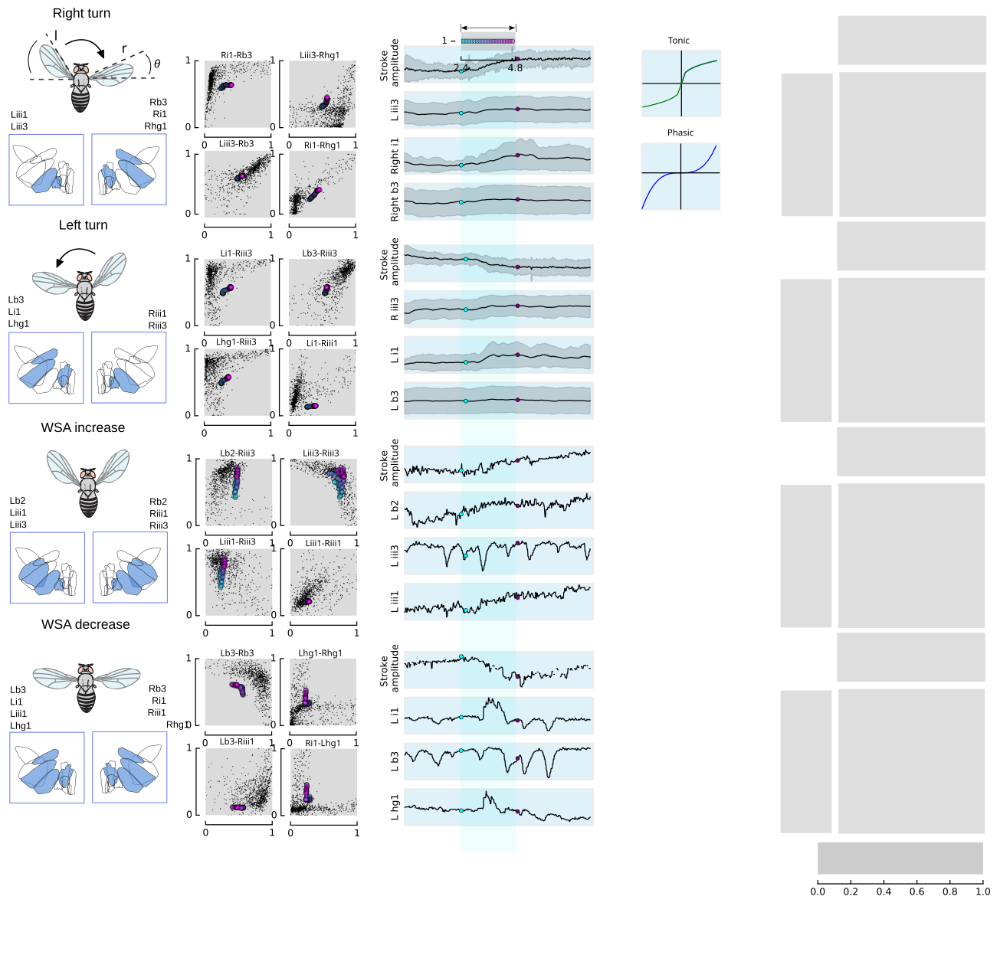

In [63]:
### now do saccade portion to be incorporated in later




from matplotlib.animation import FuncAnimation

import figurefirst as fifi

#layout = fifi.FigureLayout('paper_figure_1_v2.svg',make_mplfigures = True)
layout = fifi.FigureLayout('layouts/paper_figure_4_v6.svg',make_mplfigures = True)

#layout.axes['yaw_left'].plot(time, mean_WBA) #,'o',alpha = 0.2)
#layout.axes['yaw_left'].fill_between(time, (mean_WBA-error), (mean_WBA + error),alpha = 0.1)

#layout.axes['yaw_right'].plot(time, mean_WBA_turn_right) #,'o',alpha = 0.2)
#layout.axes['yaw_right'].fill_between(time, (mean_WBA_turn_right-error_turn_right), (mean_WBA_turn_right + error_turn_right),alpha = 0.1)

import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np; np.random.seed(0)
import pandas as pd



x = np.arange(-10,10)
layout.axes['phasic'].plot(x, x**3)
layout.axes['tonic'].plot(x, x** (1. / 3))
layout.axes['phasic'].set_xbound(-10, 10)
layout.axes['tonic'].set_xbound(-10, 10)
layout.axes['tonic'].axhline(y=0, color='k')
layout.axes['tonic'].axvline(x=0, color='k')
layout.axes['phasic'].axhline(y=0, color='k')
layout.axes['phasic'].axvline(x=0, color='k')
#layout.axes['phasic'].set_ybound(-10, 10)
layout.axes['tonic'].set_ybound([-3, 3])
layout.axes['tonic'].plot(x, np.cbrt(x))




fly = flylist[6]
snum = 1  #5

#l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]

times = np.arange(len(x))*0.02
colors = times[120:240]


x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


###check normed signals method 


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]

'''
layout.axes['l_wsa'].plot(times,l_deg,clip_on = False,color = 'k')
layout.axes['l_wsa'].set_xbound(0,times[-1])
layout.axes['l_wsa'].set_ylabel('left \n amplitude')
layout.axes['l_wsa'].patch.set_alpha(0.0)
layout.axes['l_wsa'].set_ybound(20,40)
layout.axes['l_wsa'].set_yticks([20, 30, 40])
#layout.axes['l_wsa'].set_ybound(-15,15)
#layout.axes['l_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)

layout.axes['r_wsa'].plot(times,r_deg,clip_on = False,color = 'k')
layout.axes['r_wsa'].set_xbound(0,times[-1])
layout.axes['r_wsa'].set_ylabel('right \n amplitude')
layout.axes['r_wsa'].patch.set_alpha(0.0)
layout.axes['r_wsa'].set_ybound(20,40)
layout.axes['r_wsa'].set_yticks([20, 30, 40])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)

'''

layout.axes['lmr_rt'].plot(times,yaw_right_dlmr,clip_on = False,color = 'k')
layout.axes['lmr_rt'].fill_between(times, (yaw_right_dlmr - yaw_right_dlmr_er),  (yaw_right_dlmr + yaw_right_dlmr_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lmr_rt'].set_xbound(0,times[-1])
layout.axes['lmr_rt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_rt'].patch.set_alpha(0.0)
layout.axes['lmr_rt'].set_ybound(-20,20)
layout.axes['lmr_rt'].set_yticks([-15, 0, 15])
layout.axes['lmr_rt'].plot(times[120],yaw_right_dlmr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lmr_rt'].plot(times[240],yaw_right_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 
#ax17.set_xbound(times[120],times[240]),ax17.set_ybound(0.8,1.2)
layout.axes['lmr_rt'].set_xticks([times[120],times[240]])


layout.axes['liii1_rt'].plot(times,yaw_right_diii3l,clip_on = False,color = 'k')
layout.axes['liii1_rt'].fill_between(times, (yaw_right_diii3l - yaw_right_diii3l_er),  (yaw_right_diii3l + yaw_right_diii3l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['liii1_rt'].set_xbound(0,times[-1])
layout.axes['liii1_rt'].set_ylabel('L iii3')
layout.axes['liii1_rt'].plot(times[120],yaw_right_diii3l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
#layout.axes['liii1_rt'].plot(times[120],iii3l[120],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].plot(times[240],yaw_right_diii3l[240],'purple', marker='o', markersize=4)#, 'o') 

#x = list(pitch_down_new_df['muscles'])
c_r = times[120:240]
Min = times[119]
Max = times[241]             
x = yaw_right_di1r[120:240]
y = yaw_right_db3r[120:240]
df= pd.DataFrame({"x":x,"y":y,"c":c_r})
cmap = plt.cm.cool
norm = matplotlib.colors.Normalize(vmin=Min, vmax=Max)

ax1 = layout.axes['Liii1_Rb3']
scatter(flylist[6], ('Ri1'),('Rb3'), ax1)
c = ax1.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
#plot_sector(flylist,('left','iii1'),('right','b3'),'nb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
########layout.axes['Liii1_Rb3'].plot(df.x, df.y, color=cmap(norm(df.c.values)), marker = 'o', markersize=2)
#plot_sector(flylist,('left','iii1'),('right','b3'),'lb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
layout.axes['Liii1_Rb3'].set_xbound(0,1),layout.axes['Liii1_Rb3'].set_ybound(0,1)#,ax3.set_xlabel('left b3',color = c_l),ax3.set_ylabel('right b3',color = c_r)
layout.axes['Liii1_Rb3'].set_xticks([0,1])
layout.axes['Liii1_Rb3'].set_yticks([0,1])                

x = yaw_right_diii3l[120:240]
y = yaw_right_dhg1r[120:240]
ax2 = layout.axes['Liii3_Rhg1']
scatter(flylist[6], ('Liii3'),('Rhg1'), ax2)
c = ax2.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax2.set_xbound(0,1),ax2.set_ybound(0,1)
ax2.set_xticks([0,1])
ax2.set_yticks([0,1])                
                
x = yaw_right_diii3l[120:240]
y = yaw_right_db3r[120:240]
ax3 = layout.axes['Liii3_Rb3']
scatter(flylist[6], ('Liii3'),('Rb3'), ax3)
c = ax3.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax3.set_xbound(0,1),ax2.set_ybound(0,1)
ax3.set_xticks([0,1])
ax3.set_yticks([0,1])  


x = yaw_right_dhg1r[120:240]
y = yaw_right_di1r[120:240]
ax4 = layout.axes['Ri1_Rhg1']
scatter(flylist[6], ('Ri1'),('Rhg1'), ax4)
c = ax4.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax4.set_xbound(0,1),ax2.set_ybound(0,1)
ax4.set_xticks([0,1])
ax4.set_yticks([0,1])  



            

layout.axes['ri1_rt'].plot(times,yaw_right_di1r,clip_on = False,color = 'k')
layout.axes['ri1_rt'].fill_between(times, (yaw_right_di1r - yaw_right_di1r_er),  (yaw_right_di1r+ yaw_right_di1r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['ri1_rt'].set_xbound(0,times[-1])
layout.axes['ri1_rt'].set_ylabel('Right i1')
layout.axes['ri1_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['ri1_rt'].plot(times[120],yaw_right_di1r[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['ri1_rt'].plot(times[240],yaw_right_di1r[240],'purple', marker='o', markersize=4)#, 'o') 



layout.axes['rb3_rt'].plot(times,yaw_right_db3r,clip_on = False,color = 'k')
layout.axes['rb3_rt'].fill_between(times, (yaw_right_db3r - yaw_right_db3r_er),  (yaw_right_db3r+ yaw_right_db3r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['rb3_rt'].set_xbound(0,times[-1])
layout.axes['rb3_rt'].set_ylabel('Right b3')
layout.axes['rb3_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['rb3_rt'].plot(times[120],yaw_right_db3r[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['rb3_rt'].plot(times[240],yaw_right_db3r[240],'purple', marker='o', markersize=4)#, 'o') 



#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)


##write the clips out here and use the derivative to get the signals 



## plot each segment

#----------------------------------------------------------------------


fly = flylist[6]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]



layout.axes['lmr_lt'].plot(times,yaw_left_dlmr,clip_on = False,color = 'k')
layout.axes['lmr_lt'].fill_between(times, (yaw_left_dlmr - yaw_left_dlmr_er),  (yaw_left_dlmr+ yaw_left_dlmr_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lmr_lt'].set_xbound(0,times[-1])
layout.axes['lmr_lt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_lt'].patch.set_alpha(0.0)
layout.axes['lmr_lt'].set_ybound(-20,20)
layout.axes['lmr_lt'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lmr_lt'].plot(times[130],yaw_left_dlmr[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lmr_lt'].plot(times[240],yaw_left_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 


x = yaw_left_di1l[120:240]
y = yaw_left_diii3r[120:240]
ax5 = layout.axes['Li1_Riii3']
scatter(flylist[6], ('Li1'),('Riii3'), ax5)
c = ax5.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax5.set_xbound(0,1),ax5.set_ybound(0,1)
ax5.set_xticks([0,1])
ax5.set_yticks([0,1])                
                


x = yaw_left_db3l[120:240]
y = yaw_left_diii3r[120:240]
ax6 = layout.axes['Lb3_Riii3']
scatter(flylist[6], ('Lb3'),('Riii3'), ax6)
c = ax6.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax6.set_xbound(0,1),ax6.set_ybound(0,1)
ax6.set_xticks([0,1])
ax6.set_yticks([0,1])                
                               
                
x = yaw_left_dhg1l[120:240]
y = yaw_left_diii3r[120:240]
ax7 = layout.axes['Lhg1_Riii3']
scatter(flylist[6], ('Lhg1'),('Riii3'), ax7)
c = ax7.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax7.set_xbound(0,1),ax7.set_ybound(0,1)
ax7.set_xticks([0,1])
ax7.set_yticks([0,1])  


x = yaw_left_di1l[120:240]
y = yaw_left_diii1r[120:240]
ax8 = layout.axes['Li1_Riii1']
scatter(flylist[6], ('Li1'),('Riii1'), ax8)
c = ax8.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax8.set_xbound(0,1),ax8.set_ybound(0,1)
ax8.set_xticks([0,1])
ax8.set_yticks([0,1])  



layout.axes['riii3_lt'].plot(times,yaw_left_diii3r,clip_on = False,color = 'k')
layout.axes['riii3_lt'].fill_between(times, (yaw_left_diii3r - yaw_left_diii3r_er),  (yaw_left_diii3r+ yaw_left_diii3r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['riii3_lt'].set_xbound(0,times[-1])
layout.axes['riii3_lt'].set_ylabel('R iii3')
layout.axes['riii3_lt'].patch.set_alpha(0.0)
layout.axes['riii3_lt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['riii3_lt'].plot(times[130],yaw_left_diii3r[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['riii3_lt'].plot(times[240],yaw_left_diii3r[240],'purple', marker='o', markersize=4)#, 'o') 


layout.axes['li1_lt'].plot(times,yaw_left_di1l,clip_on = False,color = 'k')
layout.axes['li1_lt'].fill_between(times, (yaw_left_di1l - yaw_left_di1l_er),  (yaw_left_di1l+ yaw_left_di1l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['li1_lt'].set_xbound(0,times[-1])
layout.axes['li1_lt'].set_ylabel('L i1')
layout.axes['li1_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['li1_lt'].plot(times[130],yaw_left_di1l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['li1_lt'].plot(times[240],yaw_left_di1l[240],'purple', marker='o', markersize=4)#, 'o') 

layout.axes['lb3_lt'].plot(times,yaw_left_db3l,clip_on = False,color = 'k')
layout.axes['lb3_lt'].fill_between(times, (yaw_left_db3l - yaw_left_db3l_er),  (yaw_left_db3l+ yaw_left_db3l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lb3_lt'].set_xbound(0,times[-1])
layout.axes['lb3_lt'].set_ylabel('L b3')
layout.axes['lb3_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lb3_lt'].plot(times[130],yaw_left_db3l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_lt'].plot(times[240],yaw_left_db3l[240],'purple', marker='o', markersize=4)#, 'o') 





#____________________________________________________________________





fly = flylist[3]
snum = 1  #5


l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]

times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)

layout.axes['lpr_WSAi'].plot(times,lpr,clip_on = False,color = 'k')
layout.axes['lpr_WSAi'].set_xbound(0,times[-1])
layout.axes['lpr_WSAi'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAi'].patch.set_alpha(0.0)
#layout.axes['lpr_WSAi'].set_ybound(-20,20)
#layout.axes['lpr_WSAi'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lpr_WSAi'].plot(times[120],lpr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lpr_WSAi'].plot(times[240],lpr[240],'purple', marker='o', markersize=4)#, 'o') 




x = b2l[120:240]
y = iii3r[120:240]
ax9 = layout.axes['Lb2_Riii3']
scatter(flylist[6], ('Lb2'),('Riii3'), ax9)
c = ax9.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax9.set_xbound(0,1),ax9.set_ybound(0,1)
ax9.set_xticks([0,1])
ax9.set_yticks([0,1])                
                


x = iii3l[120:240]
y = iii3r[120:240]
ax10 = layout.axes['Liii3_Riii3']
scatter(flylist[6], ('Liii3'),('Riii3'), ax10)
c = ax10.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax10.set_xbound(0,1),ax10.set_ybound(0,1)
ax10.set_xticks([0,1])
ax10.set_yticks([0,1])                
                               
                
x = iii1l[120:240]
y = iii3r[120:240]
ax11 = layout.axes['Liii1_Riii3']
scatter(flylist[6], ('Liii1'),('Riii3'), ax11)
c = ax11.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax11.set_xbound(0,1),ax11.set_ybound(0,1)
ax11.set_xticks([0,1])
ax11.set_yticks([0,1])  


x = iii1l[120:240]
y = iii1r[120:240]
ax12 = layout.axes['Liii1_Riii1']
scatter(flylist[6], ('Liii1'),('Riii1'), ax12)
c = ax12.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax12.set_xbound(0,1),ax12.set_ybound(0,1)
ax12.set_xticks([0,1])
ax12.set_yticks([0,1])  



layout.axes['lb2_WSAi'].plot(times,b2l,clip_on = False,color = 'k')
layout.axes['lb2_WSAi'].set_xbound(0,times[-1])
layout.axes['lb2_WSAi'].set_ylabel('L b2')
layout.axes['lb2_WSAi'].patch.set_alpha(0.0)
layout.axes['lb2_WSAi'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['lb2_WSAi'].plot(times[120],b2l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb2_WSAi'].plot(times[240],b2l[240],'purple', marker='o', markersize=4)#, 'o') 


layout.axes['liii3_WSAi'].plot(times,iii3l,clip_on = False,color = 'k')
layout.axes['liii3_WSAi'].set_xbound(0,times[-1])
layout.axes['liii3_WSAi'].set_ylabel('L iii3')
layout.axes['liii3_WSAi'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['liii3_WSAi'].plot(times[130],iii3l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii3_WSAi'].plot(times[240],iii3l[240],'purple', marker='o', markersize=4)#, 'o') 

layout.axes['liii1_WSAi'].plot(times,iii1l,clip_on = False,color = 'k')
layout.axes['liii1_WSAi'].set_xbound(0,times[-1])
layout.axes['liii1_WSAi'].set_ylabel('L iii1')
layout.axes['liii1_WSAi'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['liii1_WSAi'].plot(times[130],iii1l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_WSAi'].plot(times[240],iii1l[240],'purple', marker='o', markersize=4)#, 'o') 









#____________________________________________________________________________

fly = flylist[1]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)

b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]


layout.axes['lpr_WSAd'].plot(times,lpr,clip_on = False,color = 'k')
layout.axes['lpr_WSAd'].set_xbound(0,times[-1])
layout.axes['lpr_WSAd'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAd'].patch.set_alpha(0.0)
#layout.axes['lpr_WSAd'].set_ybound(-20,20)
#layout.axes['lpr_WSAd'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lpr_WSAd'].plot(times[120],lpr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lpr_WSAd'].plot(times[240],lpr[240],'purple', marker='o', markersize=4)#, 'o') 




x = b3l[120:240]
y = b3r[120:240]
ax13 = layout.axes['Lb3_Rb3']
scatter(flylist[6], ('Lb3'),('Rb3'), ax13)
c = ax13.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax13.set_xbound(0,1),ax13.set_ybound(0,1)
ax13.set_xticks([0,1])
ax13.set_yticks([0,1])                
                


x = hg1l[120:240]
y = hg1r[120:240]
ax14 = layout.axes['Lhg1_Rhg1']
scatter(flylist[6], ('Lhg1'),('Rhg1'), ax14)
c = ax14.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax14.set_xbound(0,1),ax14.set_ybound(0,1)
ax14.set_xticks([0,1])
ax14.set_yticks([0,1])                
                               
                
x = b3l[120:240]
y = iii1r[120:240]
ax15 = layout.axes['Lb3_Riii1']
scatter(flylist[6], ('Lb3'),('Riii1'), ax15)
c = ax15.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax15.set_xbound(0,1),ax15.set_ybound(0,1)
ax15.set_xticks([0,1])
ax15.set_yticks([0,1])  


x = hg1l[120:240]
y = i1r[120:240]
ax16 = layout.axes['Lhg1_Ri1']
scatter(flylist[6], ('Lhg1'),('Ri1'), ax16)
c = ax16.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax16.set_xbound(0,1),ax16.set_ybound(0,1)
ax16.set_xticks([0,1])
ax16.set_yticks([0,1])  


x = times[120:240]
y = np.ones(20)
ax17 = layout.axes['cmap_legend']
x_prime = x[::6]
colors = x_prime
c = ax17.scatter(x_prime, y, c=colors, cmap='cool', alpha=0.45)
ax17.set_xbound(times[120],times[240]),ax17.set_ybound(0.8,1.2)
ax17.set_xticks([times[120],times[240]])
ax17.set_yticks([1])  



layout.axes['li1_WSAd'].plot(times,i1l,clip_on = False,color = 'k')
layout.axes['li1_WSAd'].set_xbound(0,times[-1])
layout.axes['li1_WSAd'].set_ylabel('L i1')
layout.axes['li1_WSAd'].patch.set_alpha(0.0)
layout.axes['li1_WSAd'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['li1_WSAd'].plot(times[120],i1l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['li1_WSAd'].plot(times[240],i1l[240],'purple', marker='o', markersize=4)#, 'o') 


layout.axes['lb3_WSAd'].plot(times,b3l,clip_on = False,color = 'k')
layout.axes['lb3_WSAd'].set_xbound(0,times[-1])
layout.axes['lb3_WSAd'].set_ylabel('L b3')
layout.axes['lb3_WSAd'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lb3_WSAd'].plot(times[120],b3l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_WSAd'].plot(times[240],b3l[240],'purple', marker='o', markersize=4)#, 'o') 

layout.axes['lhg1_WSAd'].plot(times,hg1l,clip_on = False,color = 'k')
layout.axes['lhg1_WSAd'].set_xbound(0,times[-1])
layout.axes['lhg1_WSAd'].set_ylabel('L hg1')
layout.axes['lhg1_WSAd'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lhg1_WSAd'].plot(times[120],hg1l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lhg1_WSAd'].plot(times[240],hg1l[240],'purple', marker='o', markersize=4)#, 'o') 









fifi.mpl_functions.set_spines(layout)
layout.save('figure_05_v7_p.svg')
plt.close('all')
display(SVG('figure_05_v7_p.svg'))




/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:28: RuntimeWarning: invalid value encountered in power


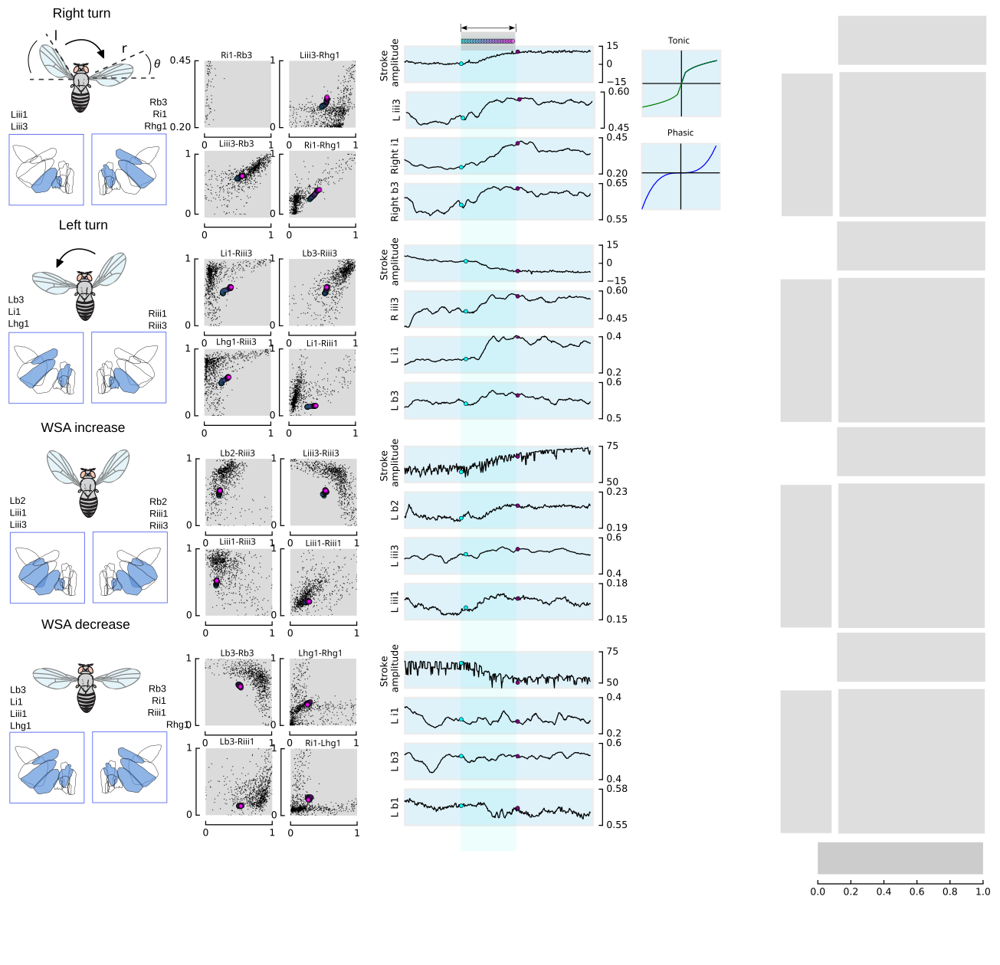

In [140]:
### now do saccade portion to be incorporated in later




from matplotlib.animation import FuncAnimation

import figurefirst as fifi

#layout = fifi.FigureLayout('paper_figure_1_v2.svg',make_mplfigures = True)
layout = fifi.FigureLayout('layouts/paper_figure_4_v7.svg',make_mplfigures = True)

#layout.axes['yaw_left'].plot(time, mean_WBA) #,'o',alpha = 0.2)
#layout.axes['yaw_left'].fill_between(time, (mean_WBA-error), (mean_WBA + error),alpha = 0.1)

#layout.axes['yaw_right'].plot(time, mean_WBA_turn_right) #,'o',alpha = 0.2)
#layout.axes['yaw_right'].fill_between(time, (mean_WBA_turn_right-error_turn_right), (mean_WBA_turn_right + error_turn_right),alpha = 0.1)

import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np; np.random.seed(0)
import pandas as pd



x = np.arange(-10,10)
layout.axes['phasic'].plot(x, x**3)
layout.axes['tonic'].plot(x, x** (1. / 3))
layout.axes['phasic'].set_xbound(-10, 10)
layout.axes['tonic'].set_xbound(-10, 10)
layout.axes['tonic'].axhline(y=0, color='k')
layout.axes['tonic'].axvline(x=0, color='k')
layout.axes['phasic'].axhline(y=0, color='k')
layout.axes['phasic'].axvline(x=0, color='k')
#layout.axes['phasic'].set_ybound(-10, 10)
layout.axes['tonic'].set_ybound([-3, 3])
layout.axes['tonic'].plot(x, np.cbrt(x))




fly = flylist[6]
snum = 1  #5

#l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]

times = np.arange(len(x))*0.02
colors = times[120:240]


x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


###check normed signals method 


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]

'''
layout.axes['l_wsa'].plot(times,l_deg,clip_on = False,color = 'k')
layout.axes['l_wsa'].set_xbound(0,times[-1])
layout.axes['l_wsa'].set_ylabel('left \n amplitude')
layout.axes['l_wsa'].patch.set_alpha(0.0)
layout.axes['l_wsa'].set_ybound(20,40)
layout.axes['l_wsa'].set_yticks([20, 30, 40])
#layout.axes['l_wsa'].set_ybound(-15,15)
#layout.axes['l_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)

layout.axes['r_wsa'].plot(times,r_deg,clip_on = False,color = 'k')
layout.axes['r_wsa'].set_xbound(0,times[-1])
layout.axes['r_wsa'].set_ylabel('right \n amplitude')
layout.axes['r_wsa'].patch.set_alpha(0.0)
layout.axes['r_wsa'].set_ybound(20,40)
layout.axes['r_wsa'].set_yticks([20, 30, 40])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)

'''

layout.axes['lmr_rt'].plot(times,yaw_right_dlmr,clip_on = False,color = 'k')
#layout.axes['lmr_rt'].fill_between(times, (yaw_right_dlmr - yaw_right_dlmr_er),  (yaw_right_dlmr + yaw_right_dlmr_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lmr_rt'].set_xbound(0,times[-1])
layout.axes['lmr_rt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_rt'].patch.set_alpha(0.0)
layout.axes['lmr_rt'].set_ybound(-20,20)
layout.axes['lmr_rt'].set_yticks([-15, 0, 15])
layout.axes['lmr_rt'].plot(times[120],yaw_right_dlmr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lmr_rt'].plot(times[240],yaw_right_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 
#ax17.set_xbound(times[120],times[240]),ax17.set_ybound(0.8,1.2)
layout.axes['lmr_rt'].set_xticks([times[120],times[240]])


layout.axes['liii1_rt'].plot(times,yaw_right_diii3l,clip_on = False,color = 'k')
#layout.axes['liii1_rt'].fill_between(times, (yaw_right_diii3l - yaw_right_diii3l_er),  (yaw_right_diii3l + yaw_right_diii3l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['liii1_rt'].set_xbound(0,times[-1])
layout.axes['liii1_rt'].set_ylabel('L iii3')
layout.axes['liii1_rt'].plot(times[120],yaw_right_diii3l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
#layout.axes['liii1_rt'].plot(times[120],iii3l[120],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_rt'].plot(times[240],yaw_right_diii3l[240],'purple', marker='o', markersize=4)#, 'o')
layout.axes['liii1_rt'].set_ybound(0.45,0.60)
layout.axes['liii1_rt'].set_yticks([0.45, 0.6])

#x = list(pitch_down_new_df['muscles'])
c_r = times[120:240]
Min = times[119]
Max = times[241]             
x = yaw_right_di1r[120:240]
y = yaw_right_db3r[120:240]
df= pd.DataFrame({"x":x,"y":y,"c":c_r})
cmap = plt.cm.cool
norm = matplotlib.colors.Normalize(vmin=Min, vmax=Max)

ax1 = layout.axes['Liii1_Rb3']
scatter(flylist[6], ('Ri1'),('Rb3'), ax1)
c = ax1.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
#plot_sector(flylist,('left','iii1'),('right','b3'),'nb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
########layout.axes['Liii1_Rb3'].plot(df.x, df.y, color=cmap(norm(df.c.values)), marker = 'o', markersize=2)
#plot_sector(flylist,('left','iii1'),('right','b3'),'lb-nu',ax3,layout.pathspecs,mode = 'kde',contours = True)
layout.axes['Liii1_Rb3'].set_xbound(0,1),layout.axes['Liii1_Rb3'].set_ybound(0,1)#,ax3.set_xlabel('left b3',color = c_l),ax3.set_ylabel('right b3',color = c_r)
layout.axes['Liii1_Rb3'].set_xticks([0,1])
layout.axes['Liii1_Rb3'].set_yticks([0,1])  
layout.axes['Liii1_Rb3'].set_ybound(0.20,0.45)
layout.axes['Liii1_Rb3'].set_yticks([0.2, 0.45])

x = yaw_right_diii3l[120:240]
y = yaw_right_dhg1r[120:240]
ax2 = layout.axes['Liii3_Rhg1']
scatter(flylist[6], ('Liii3'),('Rhg1'), ax2)
c = ax2.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax2.set_xbound(0,1),ax2.set_ybound(0,1)
ax2.set_xticks([0,1])
ax2.set_yticks([0,1])                
                
x = yaw_right_diii3l[120:240]
y = yaw_right_db3r[120:240]
ax3 = layout.axes['Liii3_Rb3']
scatter(flylist[6], ('Liii3'),('Rb3'), ax3)
c = ax3.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax3.set_xbound(0,1),ax2.set_ybound(0,1)
ax3.set_xticks([0,1])
ax3.set_yticks([0,1])  


x = yaw_right_dhg1r[120:240]
y = yaw_right_di1r[120:240]
ax4 = layout.axes['Ri1_Rhg1']
scatter(flylist[6], ('Ri1'),('Rhg1'), ax4)
c = ax4.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax4.set_xbound(0,1),ax2.set_ybound(0,1)
ax4.set_xticks([0,1])
ax4.set_yticks([0,1])  



            

layout.axes['ri1_rt'].plot(times,yaw_right_di1r,clip_on = False,color = 'k')
#layout.axes['ri1_rt'].fill_between(times, (yaw_right_di1r - yaw_right_di1r_er),  (yaw_right_di1r+ yaw_right_di1r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['ri1_rt'].set_xbound(0,times[-1])
layout.axes['ri1_rt'].set_ylabel('Right i1')
layout.axes['ri1_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['ri1_rt'].plot(times[120],yaw_right_di1r[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['ri1_rt'].plot(times[240],yaw_right_di1r[240],'purple', marker='o', markersize=4)#, 'o') 
#layout.axes['ri1_rt'].set_ybound(0.40,0.60)
#layout.axes['ri1_rt'].set_yticks([0.40, 0.6])
layout.axes['ri1_rt'].set_ybound(0.2,0.45)
layout.axes['ri1_rt'].set_yticks([0.2, 0.45])


layout.axes['rb3_rt'].plot(times,yaw_right_db3r,clip_on = False,color = 'k')
#layout.axes['rb3_rt'].fill_between(times, (yaw_right_db3r - yaw_right_db3r_er),  (yaw_right_db3r+ yaw_right_db3r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['rb3_rt'].set_xbound(0,times[-1])
layout.axes['rb3_rt'].set_ylabel('Right b3')
layout.axes['rb3_rt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['rb3_rt'].plot(times[120],yaw_right_db3r[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['rb3_rt'].plot(times[240],yaw_right_db3r[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['rb3_rt'].set_ybound(0.55,0.65)
layout.axes['rb3_rt'].set_yticks([0.55, 0.65])



#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)


##write the clips out here and use the derivative to get the signals 



## plot each segment

#----------------------------------------------------------------------


fly = flylist[6]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=-8, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]



layout.axes['lmr_lt'].plot(times,yaw_left_dlmr,clip_on = False,color = 'k')
#layout.axes['lmr_lt'].fill_between(times, (yaw_left_dlmr - yaw_left_dlmr_er),  (yaw_left_dlmr+ yaw_left_dlmr_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lmr_lt'].set_xbound(0,times[-1])
layout.axes['lmr_lt'].set_ylabel('Stroke \n amplitude')
layout.axes['lmr_lt'].patch.set_alpha(0.0)
layout.axes['lmr_lt'].set_ybound(-20,20)
layout.axes['lmr_lt'].set_yticks([-15, 0, 15])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lmr_lt'].plot(times[130],yaw_left_dlmr[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lmr_lt'].plot(times[240],yaw_left_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 


x = yaw_left_di1l[120:240]
y = yaw_left_diii3r[120:240]
ax5 = layout.axes['Li1_Riii3']
scatter(flylist[6], ('Li1'),('Riii3'), ax5)
c = ax5.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax5.set_xbound(0,1),ax5.set_ybound(0,1)
ax5.set_xticks([0,1])
ax5.set_yticks([0,1])                
                


x = yaw_left_db3l[120:240]
y = yaw_left_diii3r[120:240]
ax6 = layout.axes['Lb3_Riii3']
scatter(flylist[6], ('Lb3'),('Riii3'), ax6)
c = ax6.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax6.set_xbound(0,1),ax6.set_ybound(0,1)
ax6.set_xticks([0,1])
ax6.set_yticks([0,1])                
                               
                
x = yaw_left_dhg1l[120:240]
y = yaw_left_diii3r[120:240]
ax7 = layout.axes['Lhg1_Riii3']
scatter(flylist[6], ('Lhg1'),('Riii3'), ax7)
c = ax7.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax7.set_xbound(0,1),ax7.set_ybound(0,1)
ax7.set_xticks([0,1])
ax7.set_yticks([0,1])  


x = yaw_left_di1l[120:240]
y = yaw_left_diii1r[120:240]
ax8 = layout.axes['Li1_Riii1']
scatter(flylist[6], ('Li1'),('Riii1'), ax8)
c = ax8.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax8.set_xbound(0,1),ax8.set_ybound(0,1)
ax8.set_xticks([0,1])
ax8.set_yticks([0,1])  



layout.axes['riii3_lt'].plot(times,yaw_left_diii3r,clip_on = False,color = 'k')
#layout.axes['riii3_lt'].fill_between(times, (yaw_left_diii3r - yaw_left_diii3r_er),  (yaw_left_diii3r+ yaw_left_diii3r_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['riii3_lt'].set_xbound(0,times[-1])
layout.axes['riii3_lt'].set_ylabel('R iii3')
layout.axes['riii3_lt'].set_ybound(0.45,0.60)
layout.axes['riii3_lt'].set_yticks([0.45, 0.6])
layout.axes['riii3_lt'].patch.set_alpha(0.0)
layout.axes['riii3_lt'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['riii3_lt'].plot(times[130],yaw_left_diii3r[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['riii3_lt'].plot(times[240],yaw_left_diii3r[240],'purple', marker='o', markersize=4)#, 'o') 


layout.axes['li1_lt'].plot(times,yaw_left_di1l,clip_on = False,color = 'k')
#layout.axes['li1_lt'].fill_between(times, (yaw_left_di1l - yaw_left_di1l_er),  (yaw_left_di1l+ yaw_left_di1l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['li1_lt'].set_xbound(0,times[-1])
layout.axes['li1_lt'].set_ylabel('L i1')
layout.axes['li1_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['li1_lt'].plot(times[130],yaw_left_di1l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['li1_lt'].plot(times[240],yaw_left_di1l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['li1_lt'].set_ybound(0.20,0.40)
layout.axes['li1_lt'].set_yticks([0.20, 0.4])

layout.axes['lb3_lt'].plot(times,yaw_left_db3l,clip_on = False,color = 'k')
#layout.axes['lb3_lt'].fill_between(times, (yaw_left_db3l - yaw_left_db3l_er),  (yaw_left_db3l+ yaw_left_db3l_er) ,clip_on = False, color = 'k', alpha = 0.15)
layout.axes['lb3_lt'].set_xbound(0,times[-1])
layout.axes['lb3_lt'].set_ylabel('L b3')
layout.axes['lb3_lt'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lb3_lt'].plot(times[130],yaw_left_db3l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_lt'].plot(times[240],yaw_left_db3l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_lt'].set_ybound(0.50,0.60)
layout.axes['lb3_lt'].set_yticks([0.50, 0.60])




#____________________________________________________________________





fly = flylist[3]
snum = 1  #5


l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'][snum]


b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]

times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)

layout.axes['lpr_WSAi'].plot(times,WSAi_dlmr,clip_on = False,color = 'k')
layout.axes['lpr_WSAi'].set_xbound(0,times[-1])
layout.axes['lpr_WSAi'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAi'].patch.set_alpha(0.0)
#layout.axes['lpr_WSAi'].set_ybound(-20,20)
layout.axes['lpr_WSAi'].set_yticks([50, 75])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lpr_WSAi'].plot(times[120],WSAi_dlmr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lpr_WSAi'].plot(times[240],WSAi_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 




x = WSAi_db2l[120:240]
y = WSAi_diii3r[120:240]
ax9 = layout.axes['Lb2_Riii3']
scatter(flylist[6], ('Lb2'),('Riii3'), ax9)
c = ax9.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax9.set_xbound(0,1),ax9.set_ybound(0,1)
ax9.set_xticks([0,1])
ax9.set_yticks([0,1])                
                


x = WSAi_diii3l[120:240]
y = WSAi_diii3r[120:240]
ax10 = layout.axes['Liii3_Riii3']
scatter(flylist[6], ('Liii3'),('Riii3'), ax10)
c = ax10.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax10.set_xbound(0,1),ax10.set_ybound(0,1)
ax10.set_xticks([0,1])
ax10.set_yticks([0,1])                
                               
                
x = WSAi_diii1l[120:240]
y = WSAi_diii3r[120:240]
ax11 = layout.axes['Liii1_Riii3']
scatter(flylist[6], ('Liii1'),('Riii3'), ax11)
c = ax11.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax11.set_xbound(0,1),ax11.set_ybound(0,1)
ax11.set_xticks([0,1])
ax11.set_yticks([0,1])  


x = iii1l[120:240]
y = iii1r[120:240]
ax12 = layout.axes['Liii1_Riii1']
scatter(flylist[6], ('Liii1'),('Riii1'), ax12)
c = ax12.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax12.set_xbound(0,1),ax12.set_ybound(0,1)
ax12.set_xticks([0,1])
ax12.set_yticks([0,1])  



layout.axes['lb2_WSAi'].plot(times,WSAi_db2l,clip_on = False,color = 'k')
layout.axes['lb2_WSAi'].set_xbound(0,times[-1])
layout.axes['lb2_WSAi'].set_ylabel('L b2')
layout.axes['lb2_WSAi'].patch.set_alpha(0.0)
layout.axes['lb2_WSAi'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['lb2_WSAi'].plot(times[120],WSAi_db2l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb2_WSAi'].plot(times[240],WSAi_db2l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['lb2_WSAi'].set_ybound(0.19,0.23)
layout.axes['lb2_WSAi'].set_yticks([0.19, 0.23])


layout.axes['liii3_WSAi'].plot(times,WSAi_diii3l,clip_on = False,color = 'k')
layout.axes['liii3_WSAi'].set_xbound(0,times[-1])
layout.axes['liii3_WSAi'].set_ylabel('L iii3')
layout.axes['liii3_WSAi'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['liii3_WSAi'].plot(times[130],WSAi_diii3l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii3_WSAi'].plot(times[240],WSAi_diii3l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii3_WSAi'].set_ybound(0.45,0.60)
layout.axes['liii3_WSAi'].set_yticks([0.40, 0.6])

layout.axes['liii1_WSAi'].plot(times,WSAi_diii1l,clip_on = False,color = 'k')
layout.axes['liii1_WSAi'].set_xbound(0,times[-1])
layout.axes['liii1_WSAi'].set_ylabel('L iii1')
layout.axes['liii1_WSAi'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['liii1_WSAi'].plot(times[130],WSAi_diii1l[130],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_WSAi'].plot(times[240],WSAi_diii1l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['liii1_WSAi'].set_ybound(0.150,0.18)
layout.axes['liii1_WSAi'].set_yticks([0.150, 0.18])








#____________________________________________________________________________

fly = flylist[1]
snum = 1  #5

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'][snum]
times = np.arange(len(x))*0.02

x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)
lpr = np.rad2deg((l+r)/10 *2*np.pi)

b1l = normd(fly.normed_signals['left', 'b1'])[idxs]
b1r = normd(fly.normed_signals['right', 'b1'])[idxs]

b2l = normd(fly.normed_signals['left', 'b2'])[idxs]
b2r = normd(fly.normed_signals['right', 'b2'])[idxs]

b3l = normd(fly.normed_signals['left', 'b3'])[idxs]
b3r = normd(fly.normed_signals['right', 'b3'])[idxs]

i1l = normd(fly.normed_signals['left', 'i1'])[idxs]
i1r = normd(fly.normed_signals['right', 'i1'])[idxs]

i2l = normd(fly.normed_signals['left', 'i2'])[idxs]
i2r = normd(fly.normed_signals['right', 'i2'])[idxs]

iii1l = normd(fly.normed_signals['left', 'iii1'])[idxs]
iii1r = normd(fly.normed_signals['right', 'iii1'])[idxs]

iii3l = normd(fly.normed_signals['left', 'iii3'])[idxs]
iii3r = normd(fly.normed_signals['right', 'iii3'])[idxs]

hg1l = normd(fly.normed_signals['left', 'hg1'])[idxs]
hg1r = normd(fly.normed_signals['right', 'hg1'])[idxs]

hg2l = normd(fly.normed_signals['left', 'hg2'])[idxs]
hg2r = normd(fly.normed_signals['right', 'hg2'])[idxs]

hg3l = normd(fly.normed_signals['left', 'hg3'])[idxs]
hg3r = normd(fly.normed_signals['right', 'hg3'])[idxs]

hg4l = normd(fly.normed_signals['left', 'hg4'])[idxs]
hg4r = normd(fly.normed_signals['right', 'hg4'])[idxs]


layout.axes['lpr_WSAd'].plot(times,WSAd_dlmr,clip_on = False,color = 'k')
layout.axes['lpr_WSAd'].set_xbound(0,times[-1])
layout.axes['lpr_WSAd'].set_ylabel('Stroke \n amplitude')
layout.axes['lpr_WSAd'].patch.set_alpha(0.0)
layout.axes['lpr_WSAd'].set_ybound(50,75)
layout.axes['lpr_WSAd'].set_yticks([50, 75])
#layout.axes['r_wsa'].set_ybound(-15,15)
#layout.axes['r_wsa'].set_yticks([-15,0,15])
#layout.axes['arena_position'].patch.set_alpha(0.0)
layout.axes['lpr_WSAd'].plot(times[120],WSAd_dlmr[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lpr_WSAd'].plot(times[240],WSAd_dlmr[240],'purple', marker='o', markersize=4)#, 'o') 




x = WSAd_db3l[120:240]
y = WSAd_db3r[120:240]
ax13 = layout.axes['Lb3_Rb3']
scatter(flylist[6], ('Lb3'),('Rb3'), ax13)
c = ax13.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax13.set_xbound(0,1),ax13.set_ybound(0,1)
ax13.set_xticks([0,1])
ax13.set_yticks([0,1])                
                


x = WSAd_dhg1l[120:240]
y = WSAd_dhg1r[120:240]
ax14 = layout.axes['Lhg1_Rhg1']
scatter(flylist[6], ('Lhg1'),('Rhg1'), ax14)
c = ax14.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax14.set_xbound(0,1),ax14.set_ybound(0,1)
ax14.set_xticks([0,1])
ax14.set_yticks([0,1])                
                               
                
x = WSAd_db3l[120:240]
y = WSAd_diii1r[120:240]
ax15 = layout.axes['Lb3_Riii1']
scatter(flylist[6], ('Lb3'),('Riii1'), ax15)
c = ax15.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax15.set_xbound(0,1),ax15.set_ybound(0,1)
ax15.set_xticks([0,1])
ax15.set_yticks([0,1])  


x = WSAd_dhg1l[120:240]
y = WSAd_di1r[120:240]
ax16 = layout.axes['Lhg1_Ri1']
scatter(flylist[6], ('Lhg1'),('Ri1'), ax16)
c = ax16.scatter(x, y, c=colors, cmap='cool', alpha=0.25)
ax16.set_xbound(0,1),ax16.set_ybound(0,1)
ax16.set_xticks([0,1])
ax16.set_yticks([0,1])  


x = times[120:240]
y = np.ones(20)
ax17 = layout.axes['cmap_legend']
x_prime = x[::6]
colors = x_prime
c = ax17.scatter(x_prime, y, c=colors, cmap='cool', alpha=0.45)
ax17.set_xbound(times[120],times[240]),ax17.set_ybound(0.8,1.2)
ax17.set_xticks([times[120],times[240]])
ax17.set_yticks([1])  



layout.axes['li1_WSAd'].plot(times,WSAd_di1l,clip_on = False,color = 'k')
layout.axes['li1_WSAd'].set_xbound(0,times[-1])
layout.axes['li1_WSAd'].set_ylabel('L i1')
layout.axes['li1_WSAd'].patch.set_alpha(0.0)
layout.axes['li1_WSAd'].patch.set_alpha(0.0)
#layout.axes['liii1_rt'].set_ybound(-20,20)
#layout.axes['liii1_rt'].set_yticks([-15, 0, 15])#
layout.axes['li1_WSAd'].plot(times[120],WSAd_di1l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['li1_WSAd'].plot(times[240],WSAd_di1l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['li1_WSAd'].set_ybound(0.20,0.4)
layout.axes['li1_WSAd'].set_yticks([0.20, 0.40])

layout.axes['lb3_WSAd'].plot(times,WSAd_db3l,clip_on = False,color = 'k')
layout.axes['lb3_WSAd'].set_xbound(0,times[-1])
layout.axes['lb3_WSAd'].set_ylabel('L b3')
layout.axes['lb3_WSAd'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lb3_WSAd'].plot(times[120],WSAd_db3l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_WSAd'].plot(times[240],WSAd_db3l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['lb3_WSAd'].set_ybound(0.40,0.60)
layout.axes['lb3_WSAd'].set_yticks([0.40, 0.6])

layout.axes['lhg1_WSAd'].plot(times,WSAd_db1l,clip_on = False,color = 'k')
layout.axes['lhg1_WSAd'].set_xbound(0,times[-1])
layout.axes['lhg1_WSAd'].set_ylabel('L b1')
layout.axes['lhg1_WSAd'].patch.set_alpha(0.0)
#layout.axes['ri1_rt'].set_ybound(-20,20)
#layout.axes['ri1_rt'].set_yticks([-15, 0, 15])
layout.axes['lhg1_WSAd'].plot(times[120],WSAd_db1l[120],'cyan', marker='o', markersize=4)#, 'o') 
layout.axes['lhg1_WSAd'].plot(times[240],WSAd_db1l[240],'purple', marker='o', markersize=4)#, 'o') 
layout.axes['lhg1_WSAd'].set_ybound(0.55,0.58)
layout.axes['lhg1_WSAd'].set_yticks([0.55, 0.58])







fifi.mpl_functions.set_spines(layout)
layout.save('figure_05_v7.svg')
plt.close('all')
display(SVG('figure_05_v7.svg'))

In [22]:
###mean_angular_velocity 

import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np; np.random.seed(0)
import pandas as pd






fly = flylist[6]
snum = 1  #5

#l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]
#idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=0, b_y=0'][snum]

l = fly.block_data['left', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
r = fly.block_data['right', 'amp', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]
x = fly.block_data['common', 'x_pos', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]

idxs = fly.block_data['common','idx', 'cl_blocks, g_x=-1, g_y=0 b_x=8, b_y=0'][snum]


times = np.arange(len(x))*0.02
colors = times[120:240]


x = np.rad2deg(x/10.0 *2*np.pi)
x -= np.mean(x[:100])
x += 180
lmr = np.rad2deg((l-r)/10 *2*np.pi)
l_deg = np.rad2deg((l)/10 *2*np.pi)
r_deg = np.rad2deg((r)/10 *2*np.pi)


import sympy as sym  # sym.diff()

l_diff = np.gradient(l_deg)
r_diff = np.gradient(r_deg)
lmr_diff = np.gradient(lmr)


In [39]:
inds = np.arange(395)
time = inds/50.

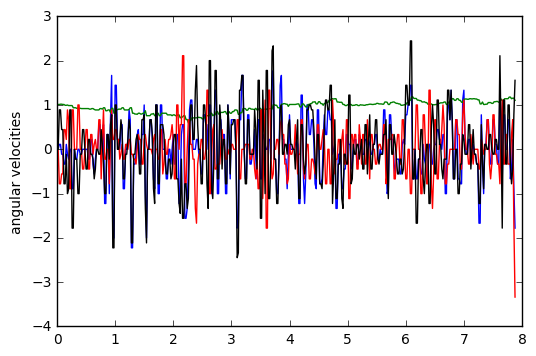

In [42]:
import matplotlib.pyplot as plt
plt.plot(time, l_diff, color = 'b')
plt.plot(time, l, color = 'green')
plt.plot(time, r_diff, color = 'r')
plt.plot(time, lmr_diff, color = 'k')
plt.ylabel('angular velocities')
plt.show()

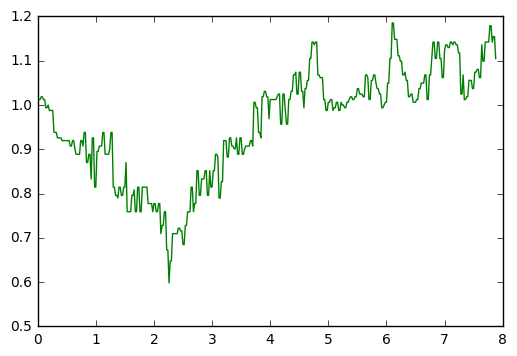

In [43]:
plt.plot(time, l, color = 'green')

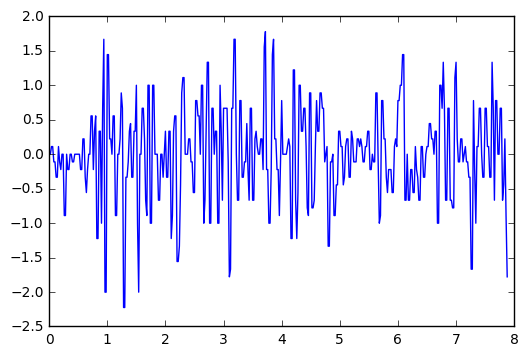

In [44]:
plt.plot(time, l_diff, color = 'b')

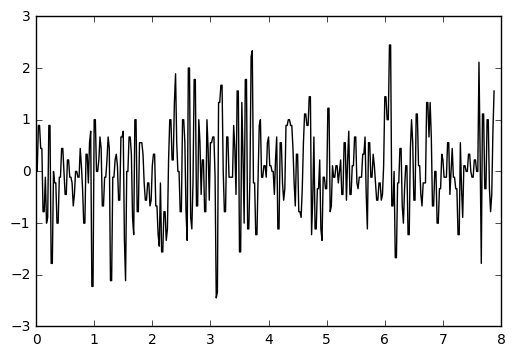

In [45]:
plt.plot(time, lmr_diff, color = 'k')

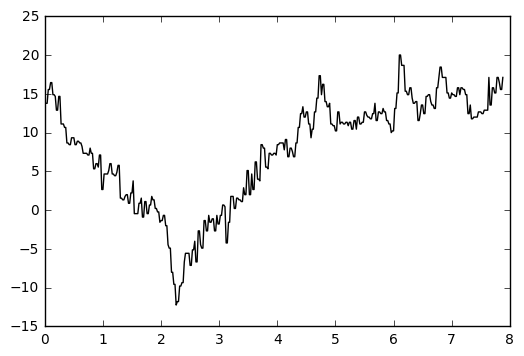

In [46]:
plt.plot(time, lmr, color = 'k')

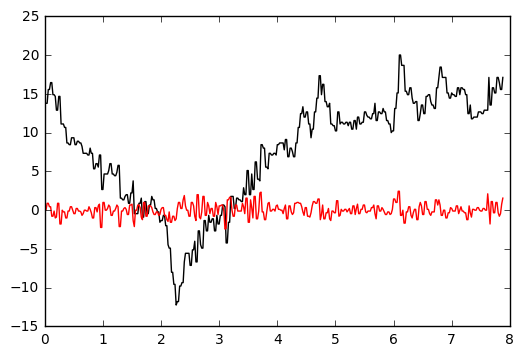

In [47]:
plt.plot(time, lmr, color = 'k')
plt.plot(time, lmr_diff, color = 'r')

In [48]:
def findSacs(WAfilt, wsv,  *args):
    """
    Finds events, or saccades, defined as local min-/maxima of trace velocity (wsv) within threshold/ceiling bounds 
    
    USAGE EXAMPLE:
    $ import numpy as np
    $ import Sac_ID_wsv as sid
    $ WAfilt                 = AF - np.nanmean(AF) # mean deduct the angle trace
    $ SAx, SAn, SVx, SVn  = sid.findSacs(WAfilt, wsv, fVec, fs, 20., 180., 6., 90.)
    # Or, if you want to use default values:
    $ SAx, SAn, SVx, SVn  = sid.findSacs(traceToID, wsv)
    
    IN:
    WAfilt:    The wing angle vector, for instance the LmR wing angle differential, kalman-filtered (filtering method does not matter)
    wsv:    Time-derivative of WAfilt, can be derived manually, or obtained from the kalman filter
    fVec:   A np.zeros vector with NaN entries where the fly was not flying
    fs:     The sampling frequency
    wsvThresh, wsvCeil, magThresh: saccade identifier parameters: velocity threshold, ceiling, and magnitude threshold (latter only used to exclude rebounds)
    
    OUT:
    SAmx, SAmn, SVmx, SVmn: np.nan vectors with Saccade Angles or Saccade Velocities in positive and negative directions, respectively
    
    QUESTIONS?
    ivo.ros@gmail.com

    """
    ## Local functions (inside this function, so they don't need to be separately defined)
    import numpy as np

    def calcMag(idx, wsv, WAfilt): # calculate difference in L-R WSA between nearest local extremes (of opposite sign)
            k=0
            chkMore=True
            refSign=np.sign(wsv[idx])
            while chkMore:
                k += 1
                compSign=np.sign(wsv[idx-k])
                if refSign != compSign: # if not equal
                    onIdx=idx-k+1
                    chkMore=False
            k=0
            chkMore=True
            while chkMore and k < 44:
                k += 1
#                print k
                compSign=np.sign(wsv[idx+k])
                if refSign != compSign:
                    offIdx=idx+k
                    chkMore=False
            if k == 44:  # dirty fail save
                offIdx=idx+k
            return WAfilt[offIdx] - WAfilt[onIdx], onIdx, offIdx # 'integral': BR (behavioral response) = dWSA(offIdx)-dWSA(onIdx)
            
    def sacOnly(inVec, fVec):
        fVecSqz = np.squeeze(fVec)
        outVec = np.array( np.sum([inVec, fVecSqz], axis=0) ).transpose()
        outVec[outVec == 0] = np.nan
        return outVec
            
    ### end of local functions
            
    ## check for arguments
    # Hardcoded default values (used when not included in function call varargs)
                                                            #flight vector,        recFreq wsvThr, Ceil,    magThr
    deffVec, deffs, defwsvThresh, defwsvCeil, defmagThresh = np.zeros_like(WAfilt),   64.,    20,     140.,    6.      # default values
    varargin = args
    nargin = 1 + len(varargin)
    if nargin == 1:
        fVec, fs, wsvThresh, wsvCeil, magThresh = deffVec, deffs, defwsvThresh, defwsvCeil, defmagThresh
    elif nargin == 2:
        fs, wsvThresh, wsvCeil, magThresh = deffs, defwsvThresh, defwsvCeil, defmagThresh
        fVec = varargin[0]
    elif nargin == 3:
        wsvThresh, wsvCeil, magThresh = defwsvThresh, defwsvCeil, defmagThresh
        fVec, fs = varargin[0], varargin[1]
    elif nargin == 4:
        wsvCeil, magThresh = defwsvCeil, defmagThresh
        fVec, fs, wsvThresh = varargin[0], varargin[1], varargin[2]
    elif nargin == 5:
        magThresh = defmagThresh
        fVec, fs, wsvThresh, wsvCeil = varargin[0], varargin[1], varargin[2], varargin[3]
    elif nargin == 6:
        fVec, fs, wsvThresh, wsvCeil, magThresh = varargin[0], varargin[1], varargin[2], varargin[3], varargin[4]
    else:
        print 'could not assign all parameters'

    # In words: find local extremes that exceed wsv threshold during flight
    # subsequently, integrate the unidirectional wsv sections surrounding local extremes, 
    # and retain only those which amplitudes surpasses a threshold amplitude.        
    
    ## Place holders
    wsvMxThr,       wsvMnThr    = np.zeros_like(wsv), np.zeros_like(wsv) 
    SwsvMx,         SwsvMn      = np.zeros_like(wsv), np.zeros_like(wsv)
    lcMxMagTemp,    lcMnMagTemp = np.zeros_like(wsv), np.zeros_like(wsv)
    lcMxMag,        lcMnMag     = np.zeros_like(wsv), np.zeros_like(wsv) 
    sacMx,          sacMn       = np.zeros_like(wsv), np.zeros_like(wsv)
    lcMnonIdx,      lcMnoffIdx  = np.zeros_like(wsv), np.zeros_like(wsv)
    lcMxonIdx,      lcMxoffIdx  = np.zeros_like(wsv), np.zeros_like(wsv)
    lcMxdeltaIdx,   lcMndeltaIdx= np.zeros_like(wsv), np.zeros_like(wsv)
    SacAngMx,       SacAngMn    = np.zeros_like(wsv), np.zeros_like(wsv)
    SacIdxMx,       SacIdxMn    = np.zeros_like(wsv), np.zeros_like(wsv)
        
    ## Find local extremes in the rate, that exceed the saccade velocity threshold
    reboundIds = int(.5*fs)
    for idx in range (reboundIds,len(wsv)-reboundIds):
        if wsv[idx]>=wsv[idx-1] and wsv[idx]>=wsv[idx+1] and wsv[idx]>wsvThresh and wsv[idx]<wsvCeil:
            wsvMxThr[idx] = wsv[idx]
        elif wsv[idx]<=wsv[idx-1] and wsv[idx]<=wsv[idx+1] and wsv[idx]<-wsvThresh and wsv[idx]>-wsvCeil:
            wsvMnThr[idx] = wsv[idx]
    
    ## Calculate a steering magnitude
    # Integrate unidirectional wsv sections surrounding local extremes to obtain saccade magnitude
    for idx in range (int(1.1*reboundIds),len(wsv)-int(1.1*reboundIds)):
        if abs(wsvMxThr[idx])>0: # for every local max
            lcSteerMag, onIdx, offIdx = calcMag(idx, wsv, WAfilt)
            if lcSteerMag > magThresh:
                lcMxMagTemp[idx] = lcSteerMag 
                lcMxonIdx[idx] = onIdx
                lcMxoffIdx[idx] = offIdx
                lcMxdeltaIdx[idx] = offIdx-idx
        if abs(wsvMnThr[idx])>0: # for every local minimum
            lcSteerMag, onIdx, offIdx = calcMag(idx, wsv, WAfilt)
            if lcSteerMag < -magThresh:
                lcMnMagTemp[idx] = lcSteerMag
                lcMnonIdx[idx] = onIdx
                lcMnoffIdx[idx] = offIdx
                lcMndeltaIdx[idx] = offIdx-idx
    
    ## Obtain saccades, retained extremes that are not 'rebounds' (stable pre-onset activity for .5s).
    # Note that steering magnitude is only used to detect rebounds, not to identify saccades
    for idx in range (reboundIds,len(wsv)-reboundIds):
        if lcMxMagTemp[idx]>0: # for every local maximum that exceeds the magnitude threshold
            if abs(np.sum(lcMnMagTemp[idx-reboundIds:idx]))<magThresh and ~np.isnan(fVec[idx-reboundIds:idx+reboundIds]).any(axis=0): 
                SwsvMx[idx] = wsv[idx]
                lcMxMag[idx] = lcMxMagTemp[idx]
                sacMx[int(lcMxonIdx[idx]):int(lcMxoffIdx[idx])] = WAfilt[int(lcMxonIdx[idx]):int(lcMxoffIdx[idx])]
                sacPeakIdx = int(idx+lcMxdeltaIdx[idx])
                SacAngMx[sacPeakIdx] = WAfilt[sacPeakIdx]                       # such that saccades can be indicated at peaks 
                SacIdxMx[idx] = sacPeakIdx                                      # indices of saccades, to allow cropping of saccades
        elif lcMnMagTemp[idx]<0: # for every local minimum that exceeds the magnitude threshold
            if abs(np.sum(lcMxMagTemp[idx-reboundIds:idx]))<magThresh and ~np.isnan(fVec[idx-reboundIds:idx+reboundIds]).any(axis=0): 
                SwsvMn[idx] = wsv[idx]
                lcMnMag[idx] = lcMnMagTemp[idx]
                sacMn[int(lcMnonIdx[idx]):int(lcMnoffIdx[idx])] = WAfilt[int(lcMnonIdx[idx]):int(lcMnoffIdx[idx])]
                sacPeakIdx = int(idx+lcMndeltaIdx[idx])
                SacAngMn[sacPeakIdx] = WAfilt[sacPeakIdx]
                SacIdxMn[idx] = sacPeakIdx                                      # indices of saccades, to allow cropping of saccades
      
    ## only when fly is flying, set all other instances to nan    
    SAmx,    SAmn    = sacOnly(SacAngMx, fVec), sacOnly(SacAngMn, fVec)
    SVmx,    SVmn    = sacOnly(SwsvMx,   fVec), sacOnly(SwsvMn,   fVec)
    #SMagMx,  SMagMn  = sacOnly(lcMxMag,  fVec), sacOnly(lcMnMag,  fVec)
    #SIdxmx,  SIdxmn  = sacOnly(SacIdxMx, fVec), sacOnly(SacIdxMn, fVec)    
    #you can also return the following: SMagMx, SMagMn, SIdxmx,  SIdxmn
    return SAmx,   SAmn,   SVmx, SVmn,  # [traceAngle, at saccade max peak;; peakAngVelo, at its Idx;; saccadePeakAngleIndex at peak angVelo index;  turnAngle]


In [54]:
#from pykalman import KalmanFilter
import numpy as np

from scipy.stats import norm
